## Import

In [1]:
from tqdm import tqdm

import numpy as np
from numpy.typing import NDArray
from numba import njit
from numba import set_num_threads
set_num_threads(28)

from matplotlib import pyplot as plt
import matplotlib as mpl
mpl.rcParams['text.usetex'] = True
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle

from domain.scan import iterate
from domain.scan import count
from domain.scan import scan
from domain.scan import orbit

from domain.da import da
from domain.da import refine

from domain.volume import rays
from domain.volume import directions
from domain.volume import volume

from domain.sample import sample
from domain.sample import mask
from domain.sample import filter
from domain.sample import select
from domain.domain import Domain

from domain import Configuration
from domain import Result
from domain import compute

## Henon map (2D & 4D)

In [2]:
@njit
def forward2d(
    x: NDArray[np.float64],
    parameters: NDArray[np.float64],
) -> NDArray[np.float64]:
    """
    Forward 2D Henon symplectic mapping in McMillan form

    Parameters
    ----------
    x: NDArray[np.float64], shape (dimension,)
        phase-space coordinates
    parameters: NDArray[np.float64]
        mapping parameters

    Returns
    -------
    NDArray[np.float64]

    """
    q, p = x
    a, b = parameters
    Q = p
    P = -q + a*p + (1.0 - b)*p**2 + b*p**3
    return np.array([Q, P], dtype=np.float64)


@njit
def inverse2d(
    x: NDArray[np.float64],
    parameters: NDArray[np.float64],
) -> NDArray[np.float64]:
    """
    Inverse 2D Henon symplectic mapping in McMillan form

    Parameters
    ----------
    x: NDArray[np.float64], shape (dimension,)
        phase-space coordinates
    parameters: NDArray[np.float64]
        mapping parameters

    Returns
    -------
    NDArray[np.float64]

    """
    q, p = x
    a, b = parameters
    Q = -p + a*q + (1.0 - b)*q**2 + b*q**3
    P = q
    return np.array([Q, P], dtype=np.float64)


@njit
def forward4d(
    x:NDArray[np.float64], 
    parameters:NDArray[np.float64]
) -> NDArray[np.float64]:
    """
    Forward 4D Henon symplectic mapping

    Parameters
    ----------
    x: NDArray[np.float64], (dimension, )
        initial condition
    parameters: NDArray[np.float64]
        mapping parameters

    Returns
    -------
    NDArray[np.float64]

    """
    qx, qy, px, py = x
    cx, sx, cy, sy, mu = parameters
    Qx = cx*qx + sx*(px + qx**2 - qy**2 + mu*(qx**3 - 3*qx*qy**2))
    Qy = cy*qy + sy*(py - 2*qx*qy + mu*(-3*qx**2*qy + qy**3))
    Px = cx*(px + qx**2 - qy**2 + mu*(qx**3 - 3*qx*qy**2)) - sx*qx
    Py = cy*(py - 2*qx*qy + mu*(-3*qx**2*qy + qy**3)) - sy*qy
    return np.array([Qx, Qy, Px, Py])


@njit
def inverse4d(
    x: NDArray[np.float64], 
    parameters: NDArray[np.float64]
) -> NDArray[np.float64]:
    """
    Accelerator mapping (Henon) symplectic mapping (inverse)

    Parameters
    ----------
    x: NDArray[np.float64], (dimension, )
        initial condition
    parameters: NDArray[np.float64]
        mapping parameters

    Returns
    -------
    NDArray[np.float64]

    """
    qx, qy, px, py = x
    cx, sx, cy, sy, mu = parameters
    Qx = cx*qx - sx*px
    Qy = cy*qy - sy*py
    Px = cx*px + sx*qx - Qx**2 + Qy**2 - mu*(Qx**3 - 3*Qx*Qy**2)
    Py = cy*py + sy*qy + 2*Qx*Qy - mu*(-3*Qx**2*Qy + Qy**3)
    return np.array([Qx, Qy, Px, Py])

In [3]:
# Test (2D)

a, b = 0.4678, 0.0
knobs = np.asarray([a, b])
state = np.array([0.05, -0.01])
print(state)
print(inverse2d(forward2d(state, knobs), knobs))
print()

a, b = -0.065, 0.0
knobs = np.asarray([a, b])
state = np.array([0.05, -0.01])
print(state)
print(inverse2d(forward2d(state, knobs), knobs))
print()

[ 0.05 -0.01]
[ 0.05 -0.01]

[ 0.05 -0.01]
[ 0.05 -0.01]



In [4]:
# Test (4D)

nux, nuy = 0.280, 0.310
mux, muy = 2*np.pi*nux, 2*np.pi*nuy
cx, sx, cy, sy = np.cos(mux), np.sin(mux), np.cos(muy), np.sin(muy)
mu = 1.0
knobs = np.asarray([cx, sx, cy, sy, mu])
state = np.array([0.05, -0.05, 0.01, 0.01])
print(state)
print(inverse4d(forward4d(state, knobs), knobs))
print()


nux, nuy = 0.168, 0.201
mux, muy = 2*np.pi*nux, 2*np.pi*nuy
cx, sx, cy, sy = np.cos(mux), np.sin(mux), np.cos(muy), np.sin(muy)
mu = 1.0
knobs = np.asarray([cx, sx, cy, sy, mu])
state = np.array([0.05, -0.05, 0.01, 0.01])
print(state)
print(inverse4d(forward4d(state, knobs), knobs))
print()

[ 0.05 -0.05  0.01  0.01]
[ 0.05 -0.05  0.01  0.01]

[ 0.05 -0.05  0.01  0.01]
[ 0.05 -0.05  0.01  0.01]



## Steps: Global parameters

In [5]:
# Domain 

dimension = 2                            # -- phase-space dimension
dl = 0.05                                # -- domain cell side length
dr = dl*dimension**0.5                   # -- radial step size
lb = np.array([-2, -2])                  # -- domain lower bounds for (qx, qy, px, py)
ub = np.array([+2, +2])                  # -- domain upper bounds for (qx, qy, px, py)
size = 2**10                             # -- total number of iterations
ndirections = 2                          # -- number of initial random directions
nsamples = 2                             # -- number of random marked cells selected from the current marked cells
npoints = 2                              # -- number of random points to generate for each selected cell
nrounds = 128                            # -- maximum number of expansion rounds to perform
nepochs = 32                             # -- number of domain computations (MC over initial directions and expansion)
center = np.array([0., 0., 0., 0])       # -- domain center
cut = 2.0                                # -- selection cut radius
threshold = 100.0                        # -- threshold radius (an initial condition with larger radius is considered lost)
termination = 0.95                       # -- termination parameter (fraction of rays hitting marked domain cells)
scale = 1.0                              # -- perturbation scaling factor for new sample generation
bins_plane = 16                          # -- number of bins for the mixing coordinate
bins_phase = 32                          # -- number of bins for the in-plane phases
phase_threshold = 1.0E-3                 # -- phase threshold used in weighted selection
alpha_plane = 1.0                        # -- plane weight factor
alpha_phase = 0.5                        # -- phase weight factor
boost = 0.5                              # -- weight boost near the edges
delta = 1.0                              # -- inverse-density score regularization
uniform = 0.05                           # -- fraction of uniform sampling to use
power = 1.0                              # -- score power
uniform = 0.05                           # -- fraction of uniform sampling

# Grid

grid = Domain(lb, ub, dl) 
grid.insert(np.arange(grid.total))
grid = grid.construct
grid.shape

# Reference point

center = np.array([0.0, 0.0])

# Reference directions

ds = directions(dimension, 128, random=False, ij=(0, 1), omega_min=0.0, omega_max=2*np.pi)

# Map parameters

a, b = 0.4678, 0.0
knobs = np.asarray([a, b])

# Objective

objective = iterate(size, threshold, forward2d)

## Steps: The grid scan method

In [6]:
# Set output container

out = np.zeros((len(grid, )), dtype=np.bool_)

In [7]:
# Perform scan

scan(grid, out, objective, knobs)

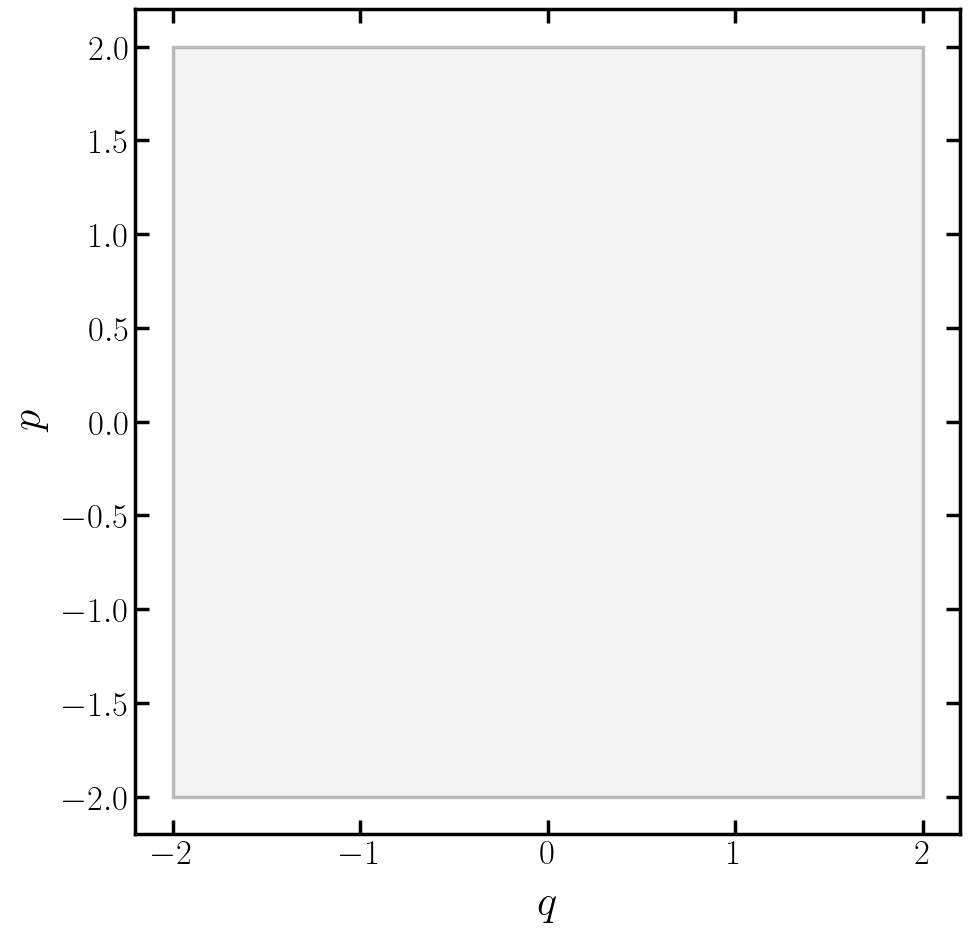

In [8]:
# Step-01: Domain

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'grid_01.png', dpi=dpi)
plt.show()

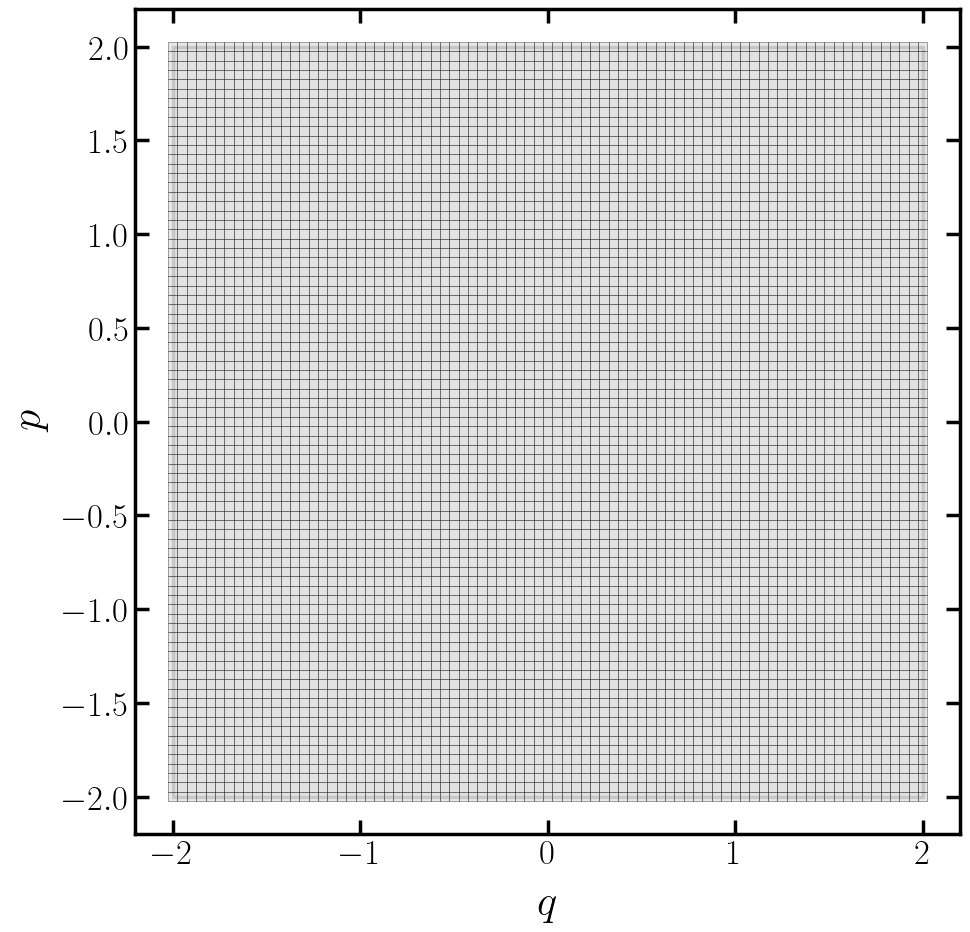

In [9]:
# Step-02: Grid

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'grid_02.png', dpi=dpi)    
plt.show()

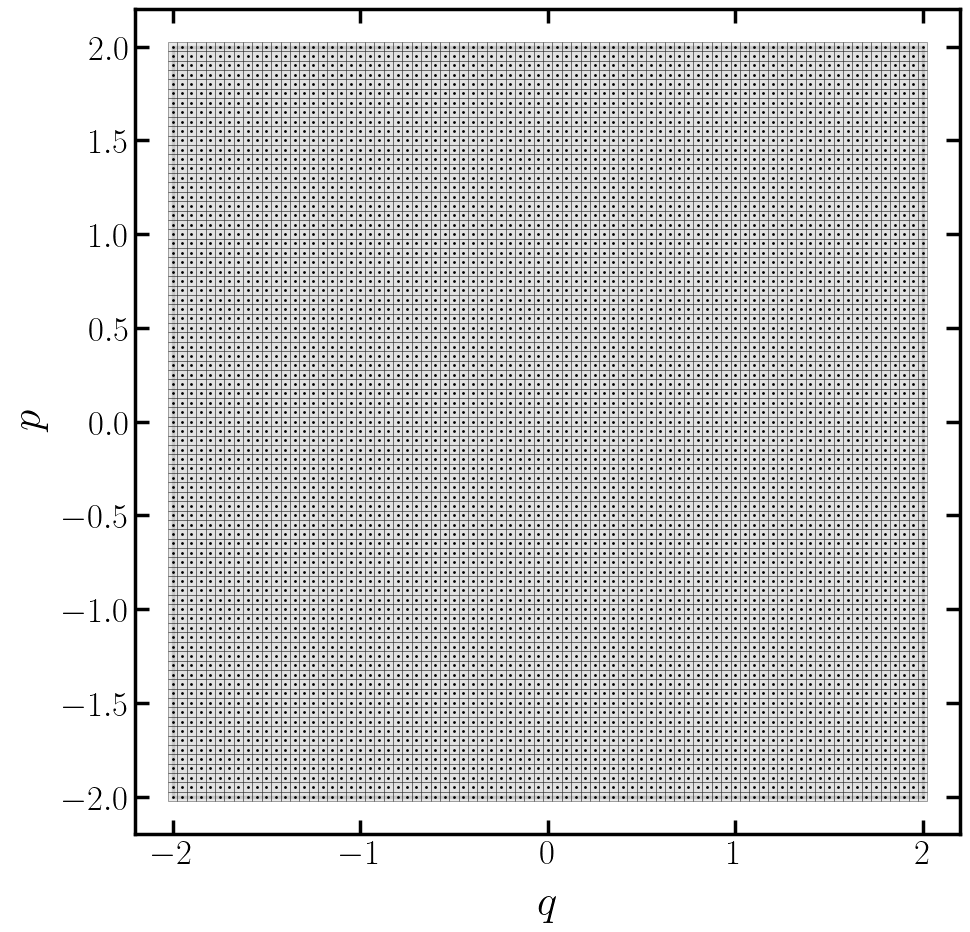

In [10]:
# Step-03: Coordinates

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
ax.errorbar(*grid.T, fmt=' ', marker="o", ms=1, color="black", zorder=2)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'grid_03.png', dpi=dpi)      
plt.show()

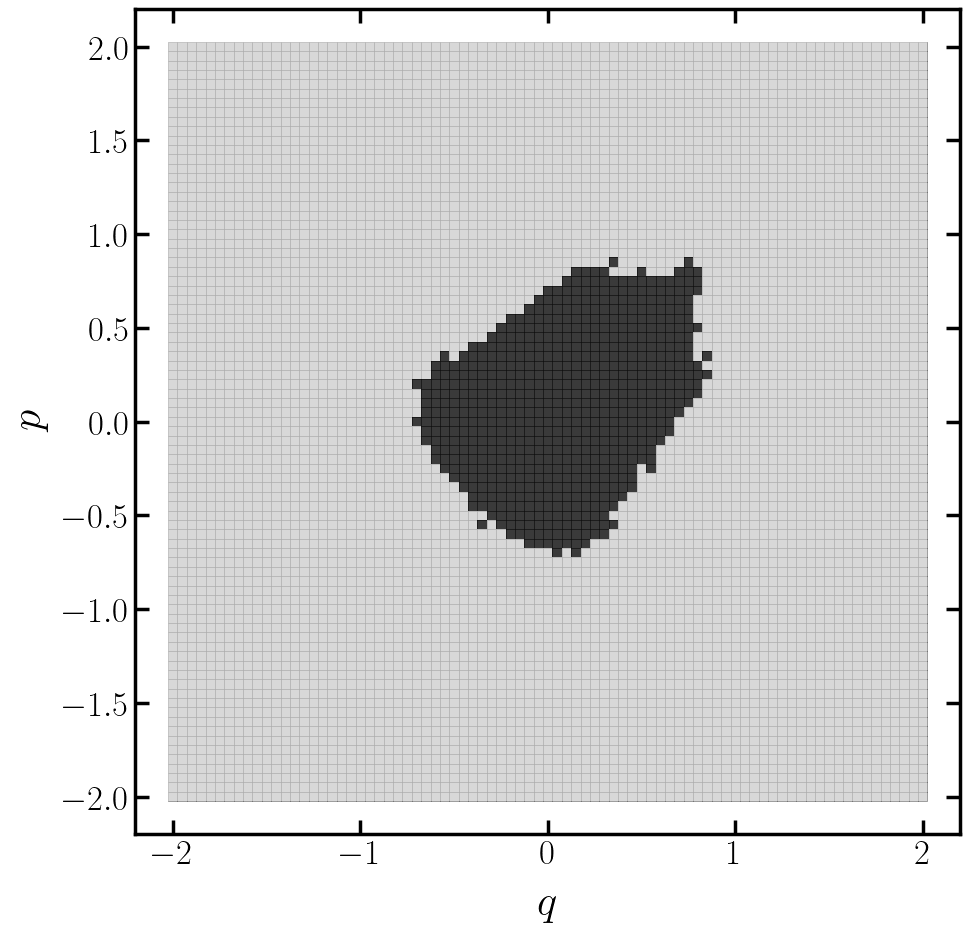

In [11]:
# Step-04: Scan

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.0, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in grid[out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
for cx, cy in grid[~out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'grid_04.png', dpi=dpi)      
plt.show()

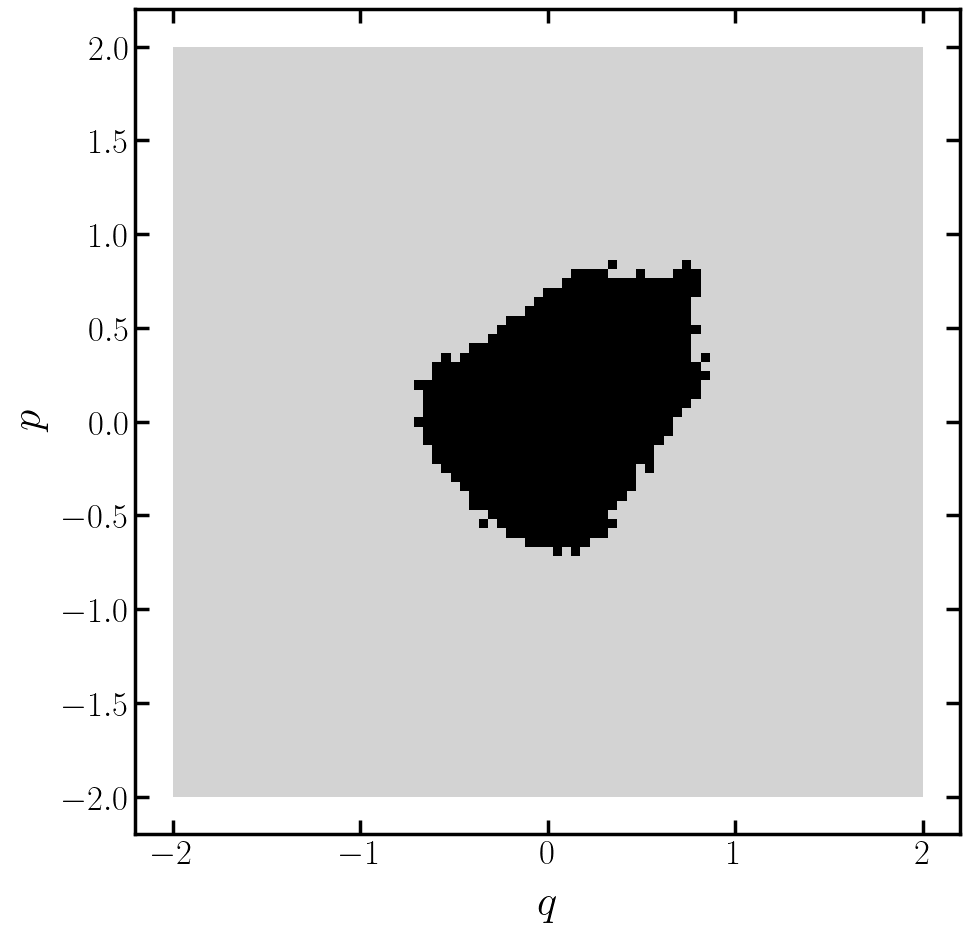

In [12]:
# Direct plotting

from matplotlib.colors import ListedColormap
cmap = ListedColormap(["lightgrey", "black"])

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
ax.imshow(out.reshape(int(len(out)**0.5), int(len(out)**0.5)), origin="lower", extent=(-2.0, 2.0, -2.0, 2.0), cmap=cmap, vmin=0, vmax=1, interpolation="nearest", aspect="equal")
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.show()

## Steps: The ray scan method

In [13]:
# Compute first unstable, stable and refined radii along the reference directions

ru, xu = da(1 + 1, dr, threshold, center, ds, objective, knobs, unstable=True)
rs, xs = da(1 + 1, dr, threshold, center, ds, objective, knobs, unstable=False)
rb, xb = refine(1 + 1, dr, threshold, center, ds, 8, rs, objective, knobs)

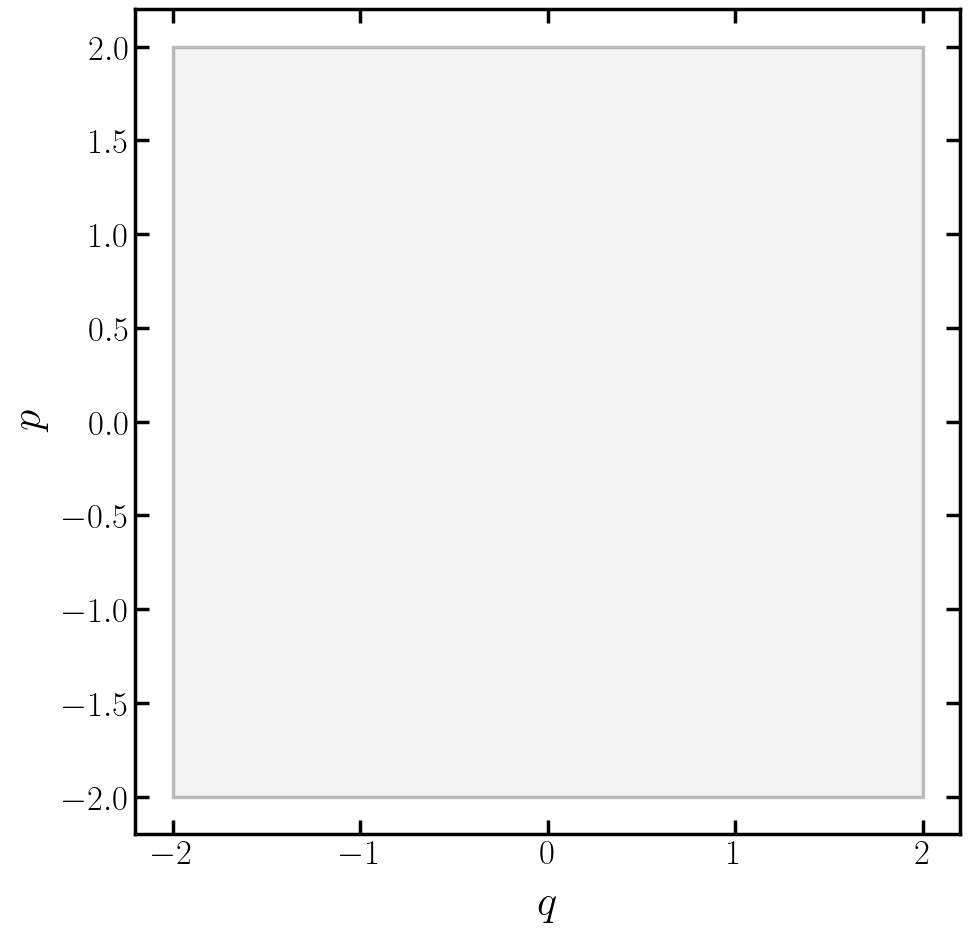

In [14]:
# Step-01: Domain

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_01.png', dpi=dpi)
plt.show()

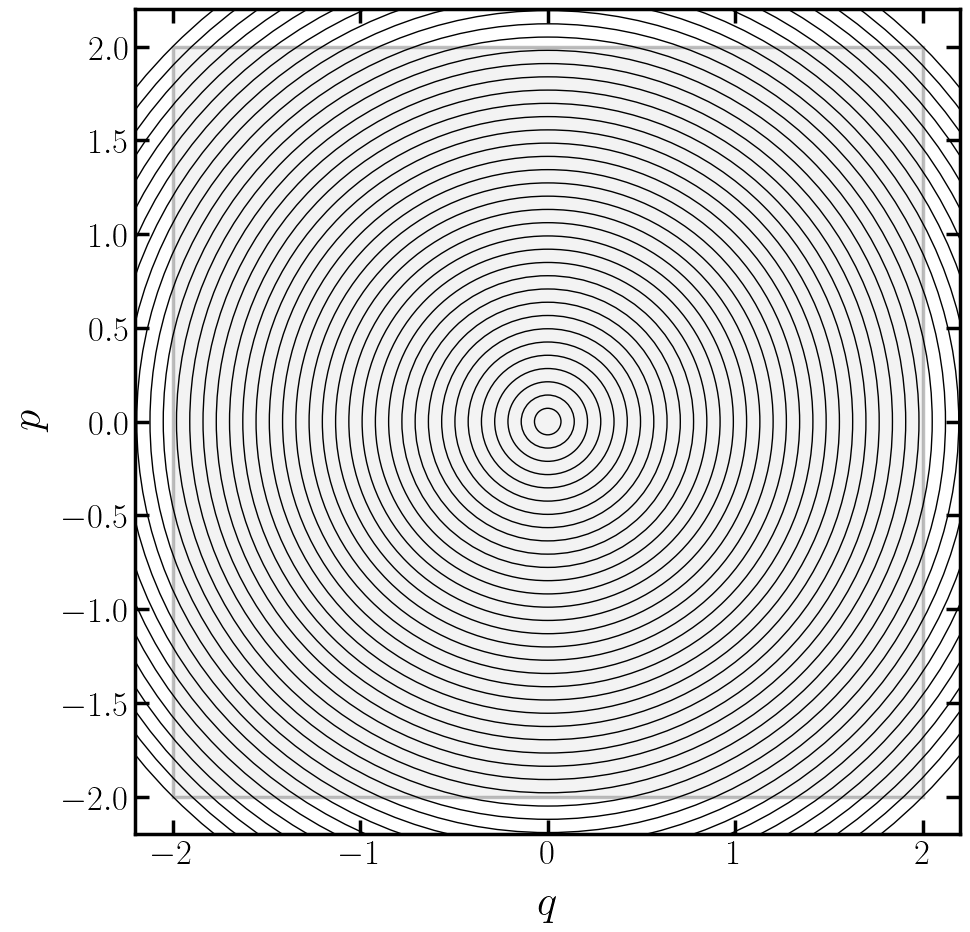

In [15]:
# Step-02: Circles

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
r = dr
while r <= 2.0*2**0.5:
    ax.add_patch(Circle((0.0, 0.0), radius=r, facecolor="none", edgecolor="black", linewidth=1.0, linestyle="-", alpha=1.0, zorder=2))
    r += dr
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_02.png', dpi=dpi)
plt.show()

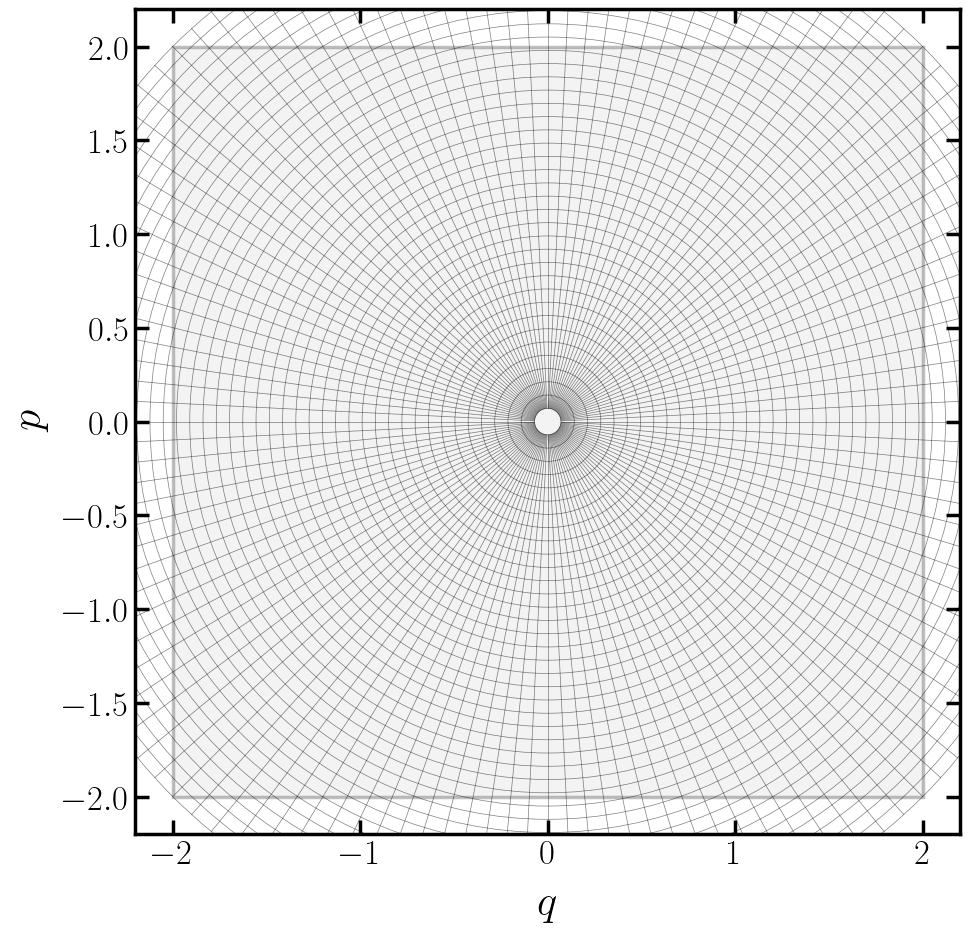

In [16]:
# Step-03: Rays

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)

domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
r = dr
while r <= 2.0 * 2**0.5:
    ax.add_patch(Circle((0.0, 0.0), radius=r, facecolor="none", edgecolor="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=2))
    r += dr
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_03.png', dpi=dpi)
plt.show()

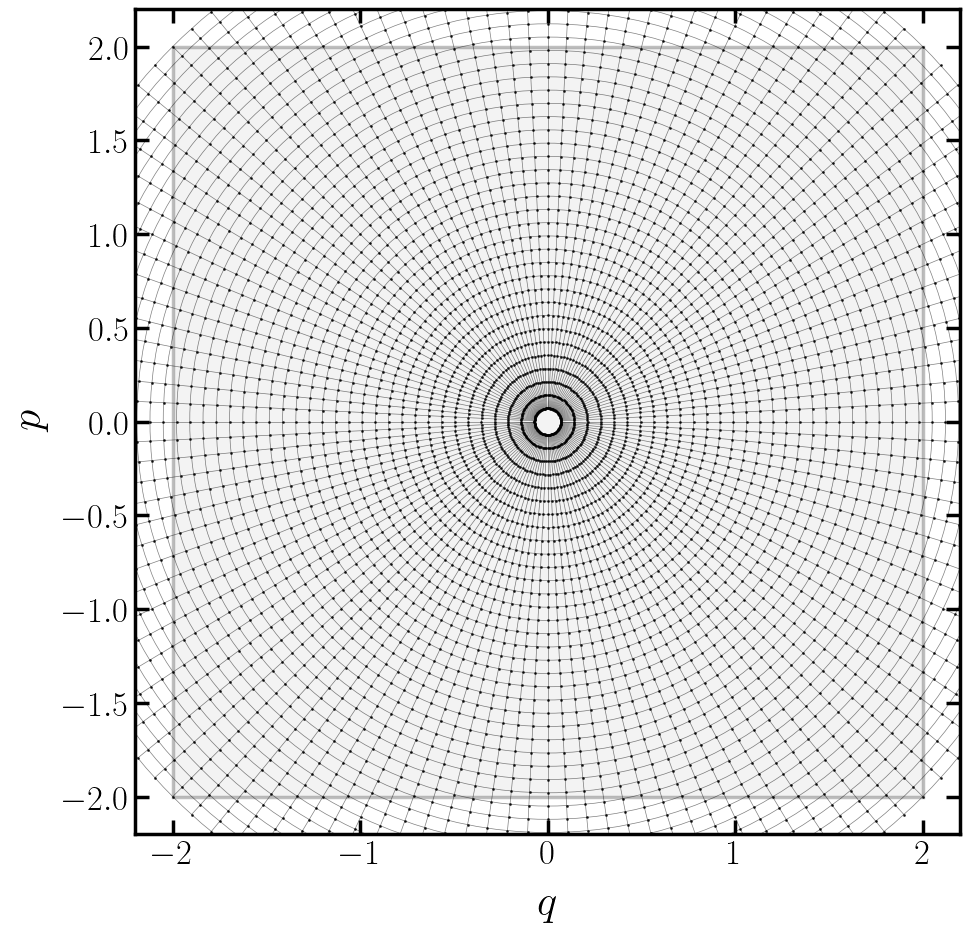

In [17]:
# Step-04: Coordinates

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
r = dr
while r <= 2.0 * 2**0.5:
    ax.add_patch(Circle((0.0, 0.0), radius=r, facecolor="none", edgecolor="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=2))
    r += dr
rmin = dr
rmax = 2.0 * 2**0.5
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=3)
points = np.array([[r * dq, r * dp] for dq, dp in ds for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_04.png', dpi=dpi)
plt.show()

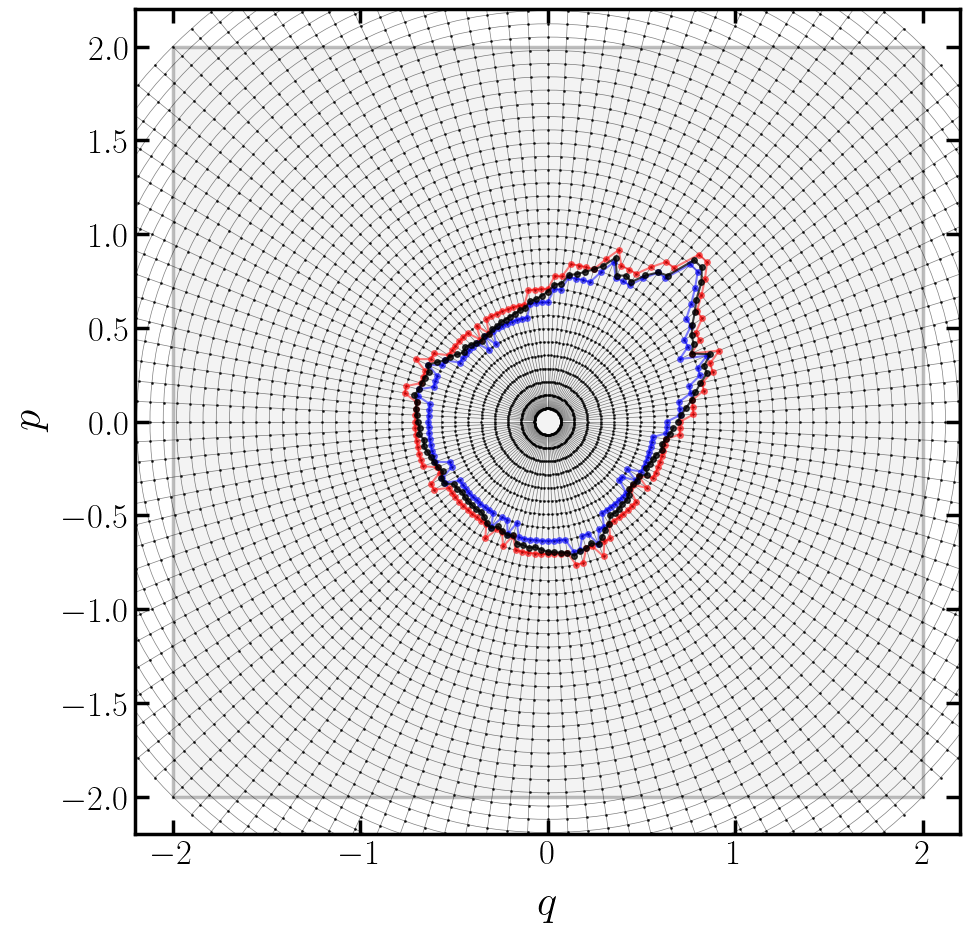

In [18]:
# Step-05: Scan

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
r = dr
while r <= 2.0 * 2**0.5:
    ax.add_patch(Circle((0.0, 0.0), radius=r, facecolor="none", edgecolor="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=2))
    r += dr
rmin = dr
rmax = 2.0 * 2**0.5
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=3)
points = np.array([[r * dq, r * dp] for dq, dp in ds for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=4)
ax.errorbar(*xu.T, fmt = '-', ms=4, marker="o", color="red", alpha=0.5, zorder=5)
ax.errorbar(*xs.T, fmt = '-', ms=4, marker="o", color="blue", alpha=0.5, zorder=5)
ax.errorbar(*xb.T, fmt = '-', ms=4, marker="o", color="black", alpha=0.75, zorder=5)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_05.png', dpi=dpi)
plt.show()

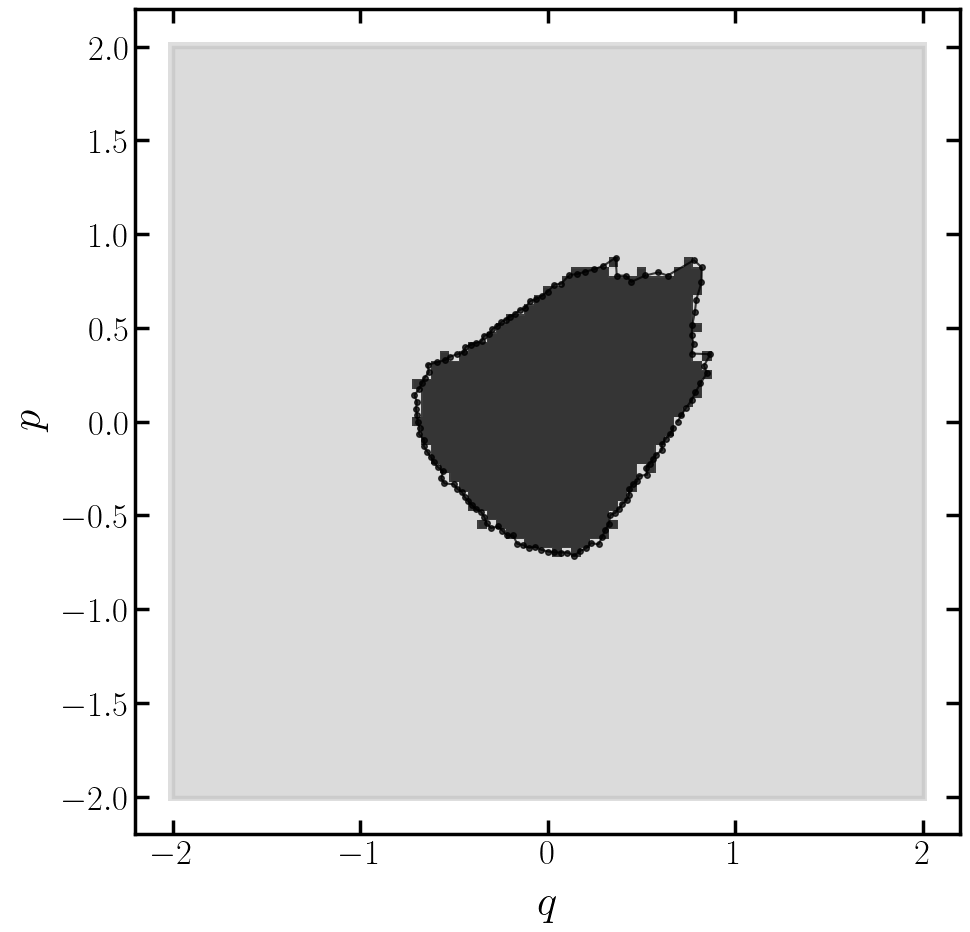

In [19]:
# Step-06: Comparison

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
cmap = ListedColormap(["white", "lightgrey"])
ax.imshow(out.reshape(int(len(out)**0.5), int(len(out)**0.5)), origin="lower", extent=(-2.0, 2.0, -2.0, 2.0), cmap=cmap, vmin=0, vmax=1, interpolation="nearest", aspect="equal", zorder=0)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
for cx, cy in grid[out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
for cx, cy in grid[~out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
ax.errorbar(*xb.T, fmt = '-', ms=4, marker="o", color="black", alpha=0.75, zorder=5)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_06.png', dpi=dpi)
plt.show()

## Steps: The bounding-set method

In [20]:
# Generate random initial rays

random = directions(dimension, ndirections)
random.shape

(2, 2)

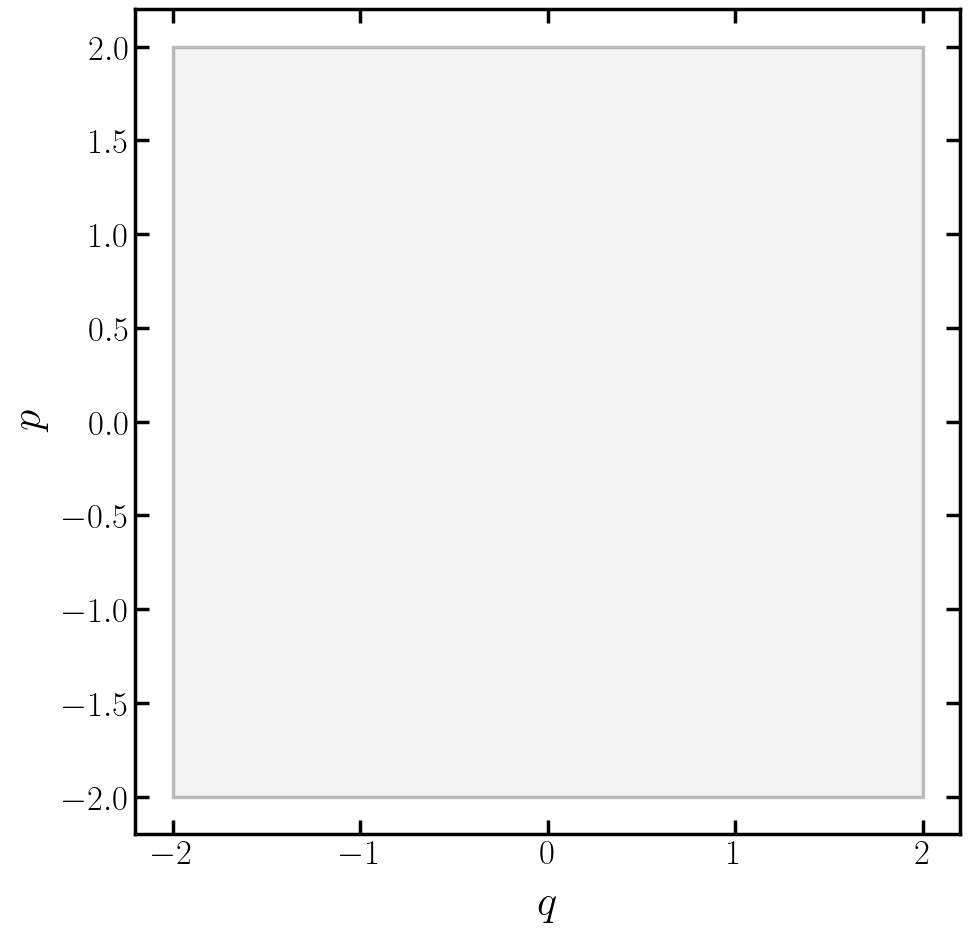

In [21]:
# Step-01: Domain

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_01.png', dpi=dpi)
plt.show()

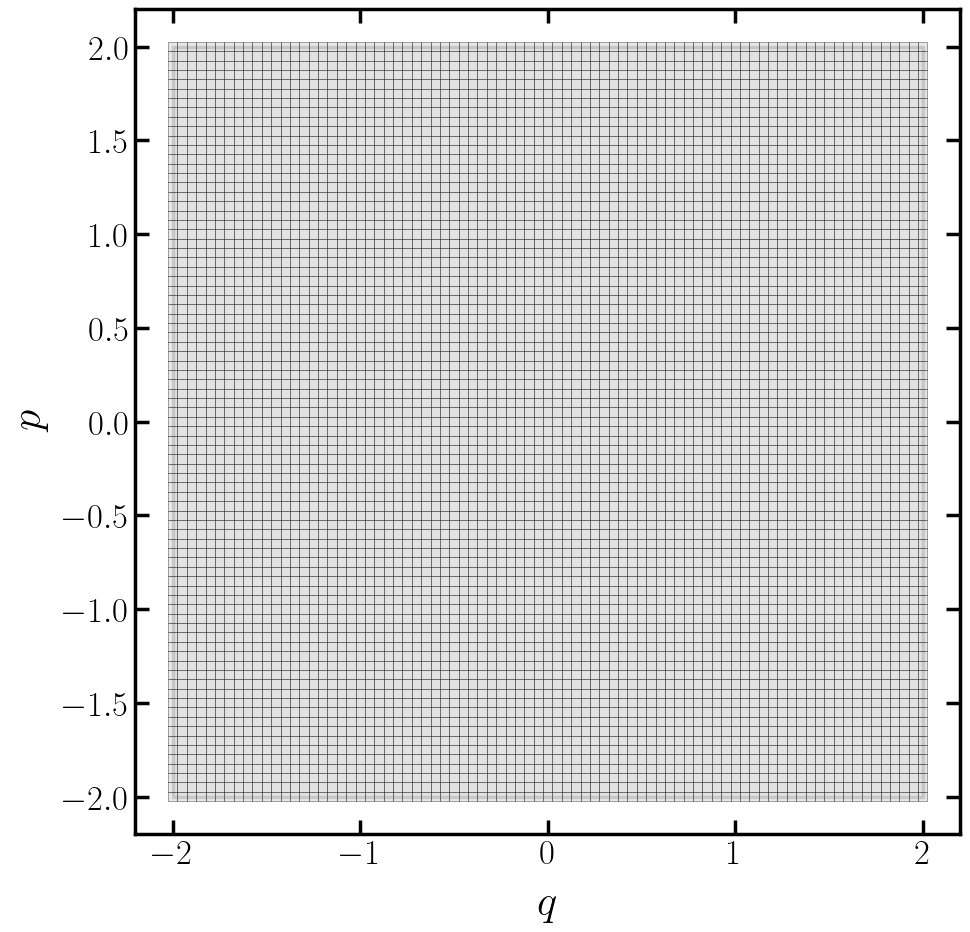

In [22]:
# Step-02: Grid

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_02.png', dpi=dpi)    
plt.show()

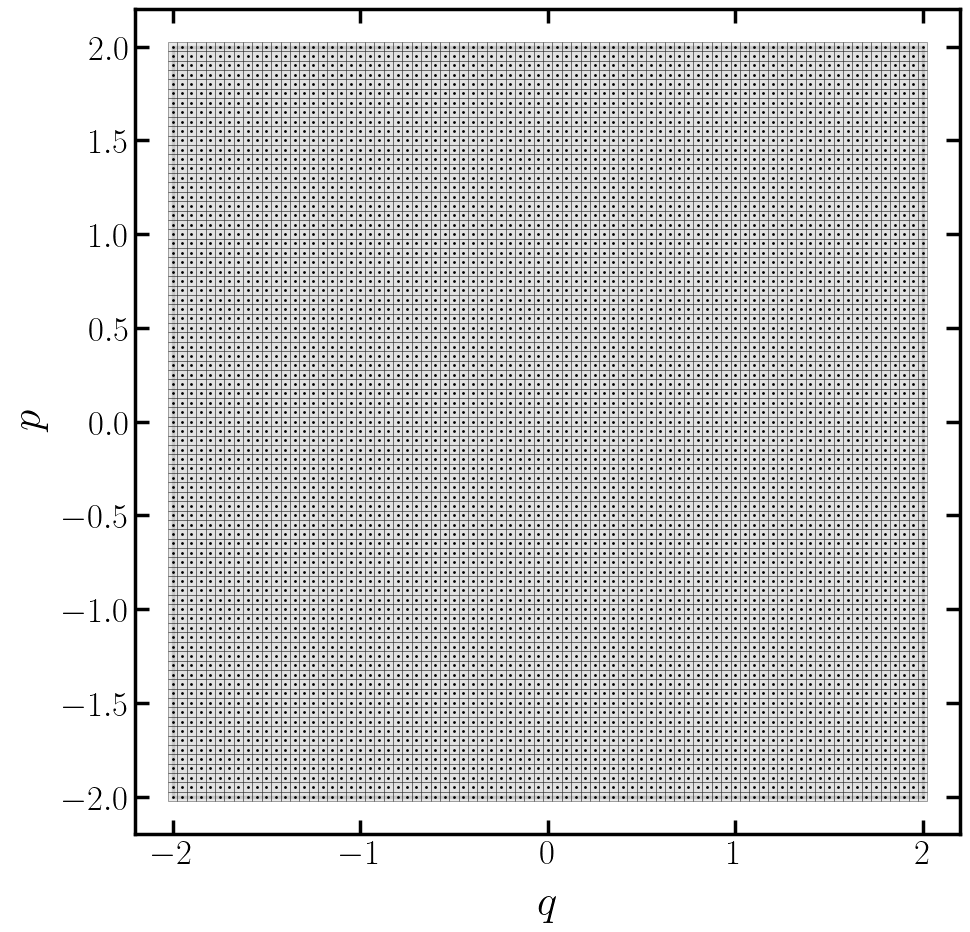

In [23]:
# Step-03: Coordinates

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
ax.errorbar(*grid.T, fmt=' ', marker="o", ms=1, color="black", zorder=2)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_03.png', dpi=dpi)      
plt.show()

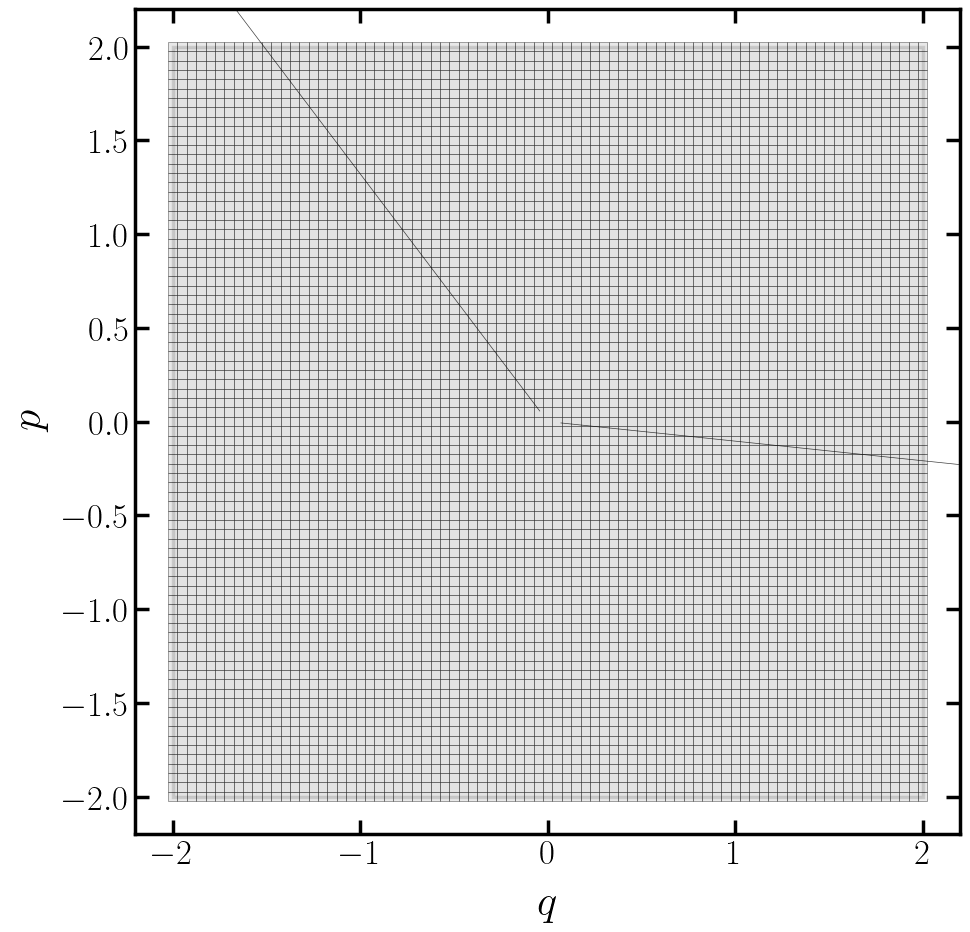

In [24]:
# Step-04: Directions

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in random:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.75, zorder=2)    
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_04.png', dpi=dpi)      
plt.show()

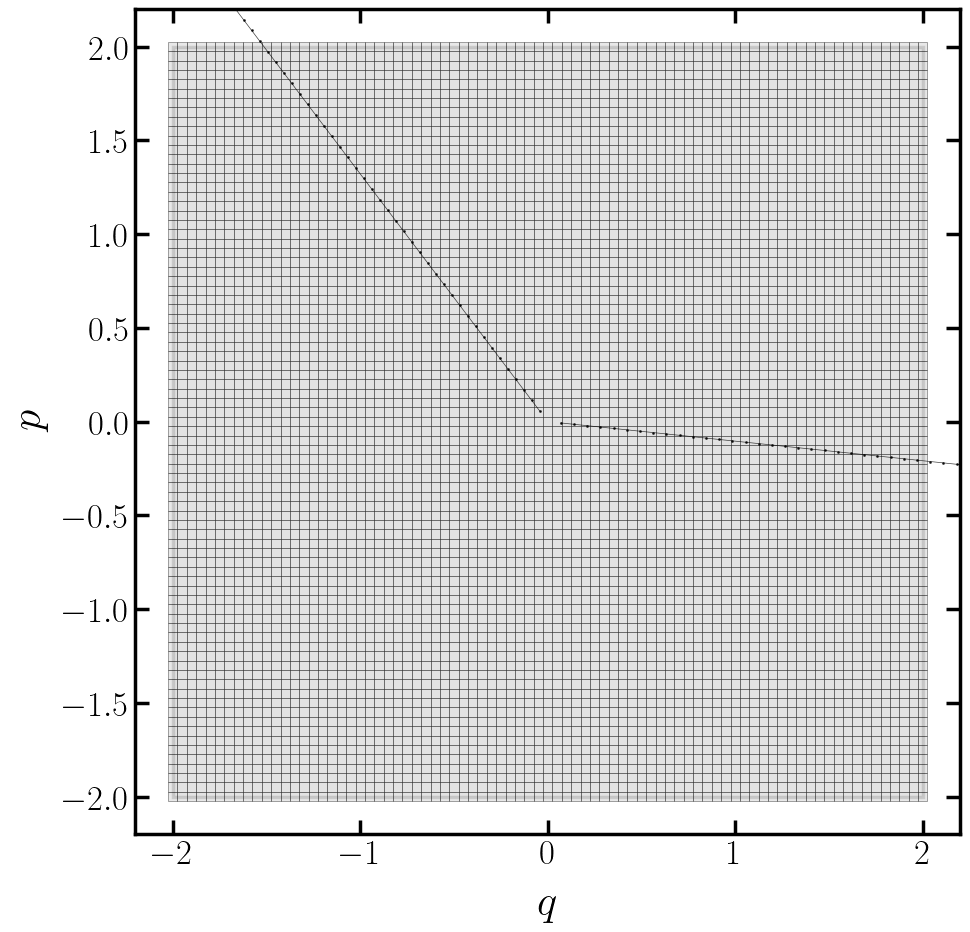

In [25]:
# Step-05: Points

from matplotlib.patches import Rectangle

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in random:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.75, zorder=2)    
points = np.array([[r * dq, r * dp] for dq, dp in random for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_05.png', dpi=dpi)      
plt.show()

In [26]:
# Compute first unstable radius along each random ray

rb, xb = da(dimension, dr, threshold, center, random, objective, knobs, unstable=True)

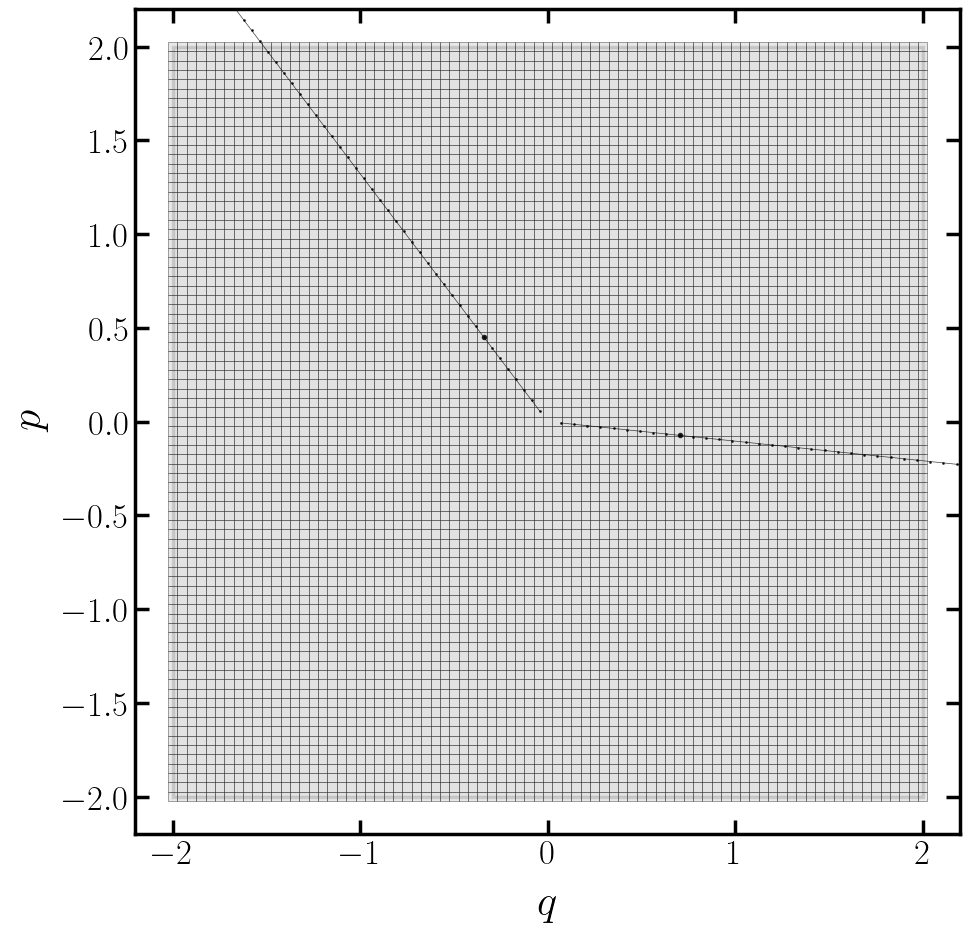

In [27]:
# Step-06: Rays

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in random:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.75, zorder=2)    
points = np.array([[r * dq, r * dp] for dq, dp in random for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.errorbar(*xb.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_06.png', dpi=dpi)      
plt.show()

In [28]:
# Compute full orbits for unstable points

orbits = np.zeros((ndirections, size, dimension), dtype=np.float64)
scan(xb, orbits, orbit(size, threshold, forward2d), knobs)
ps = filter(np.vstack(orbits), cut)

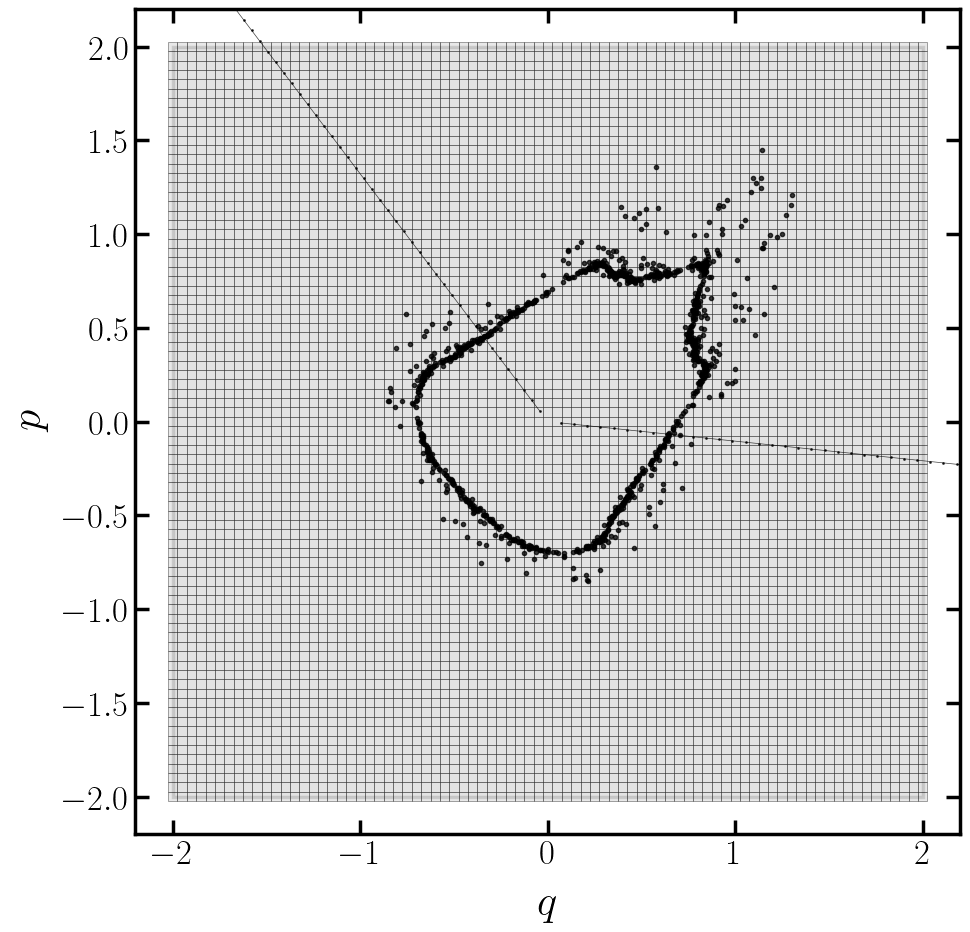

In [29]:
# Step-07: Orbits

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in random:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.75, zorder=2)    
points = np.array([[r * dq, r * dp] for dq, dp in random for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.errorbar(*xb.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=3)
ax.errorbar(*ps.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_07.png', dpi=dpi)      
plt.show()

In [30]:
# Define domain and add orbit points

domain  = Domain(lb, ub, dl)
domain.update(ps)

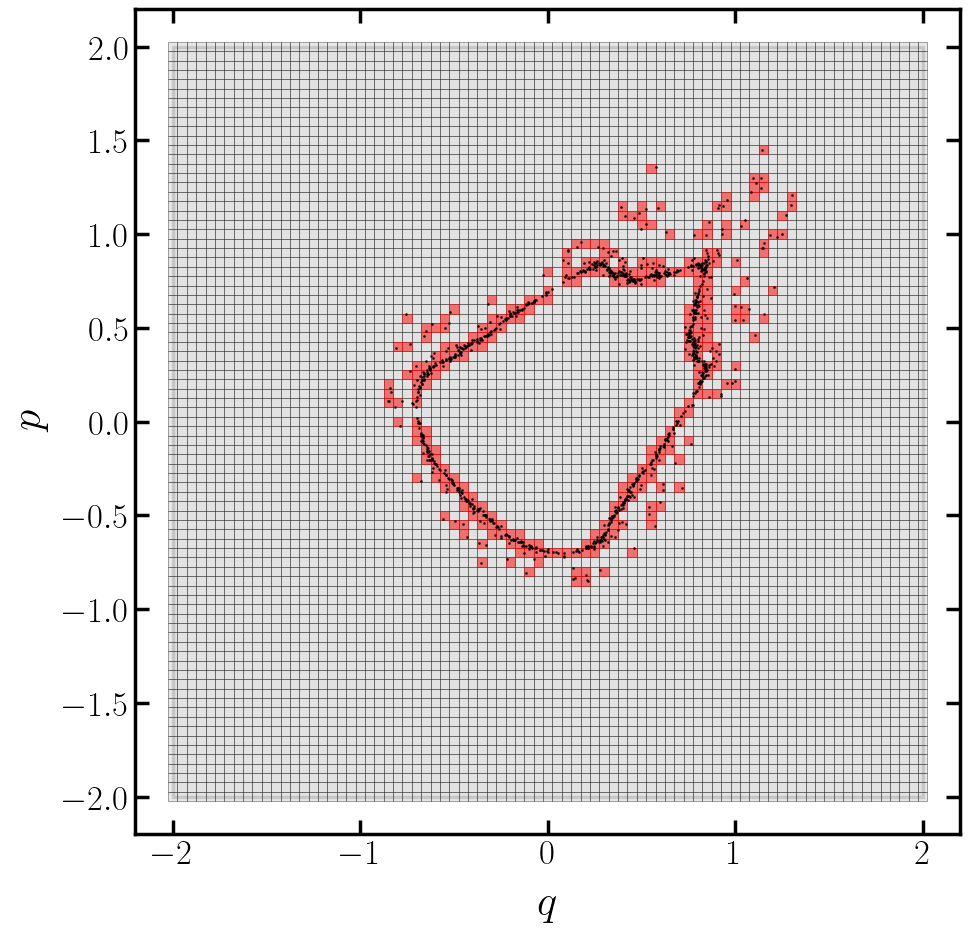

In [31]:
# Step-08: Project

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_08.png', dpi=dpi)      
plt.show()

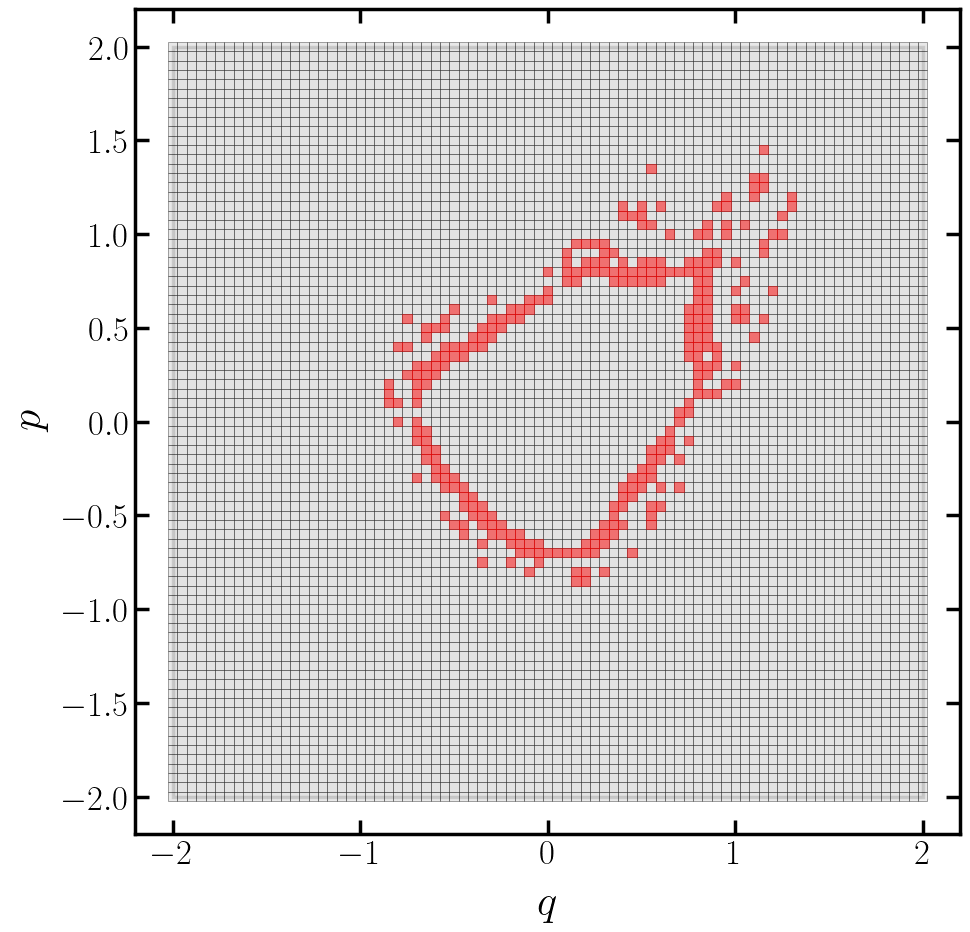

In [32]:
# Step-09: Initial

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_09.png', dpi=dpi)      
plt.show()

In [33]:
# Random samples

indices = np.random.choice(domain.list, nsamples)
samples = domain.transform(indices)
initial = sample(npoints, scale*dl, samples)

In [34]:
# Define container

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

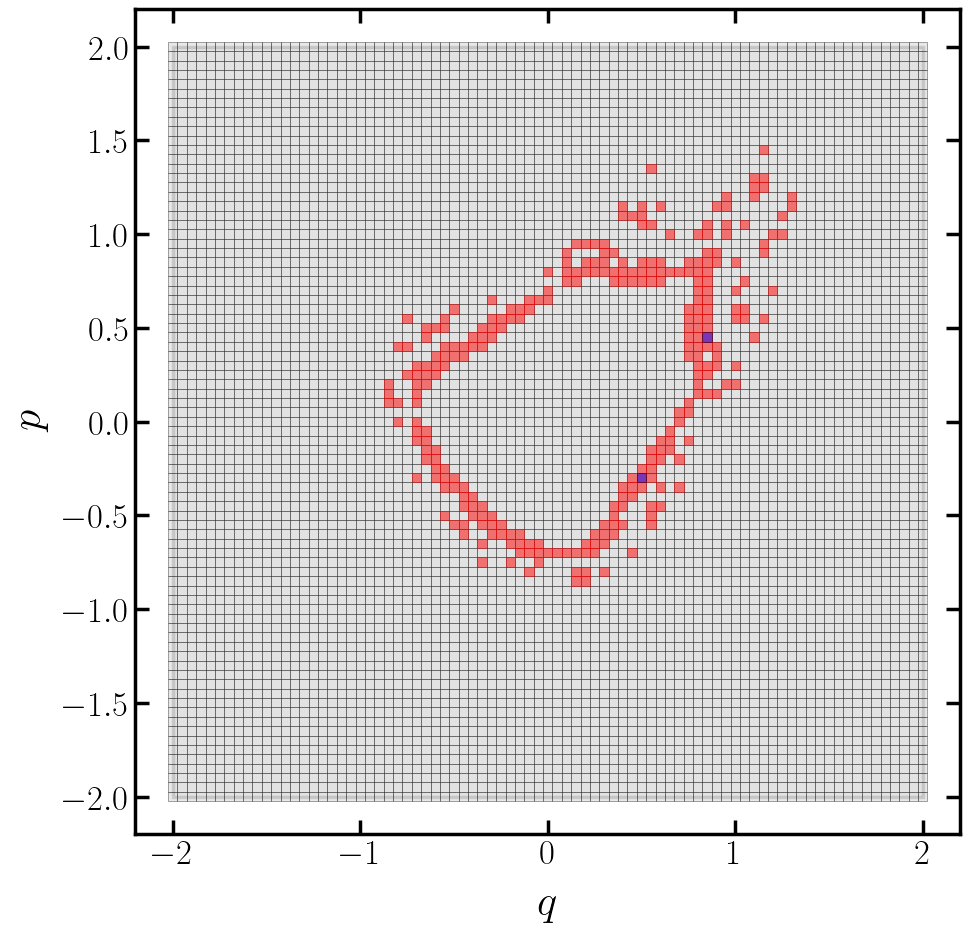

In [35]:
# Step-10: Select

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_10.png', dpi=dpi)      
plt.show()

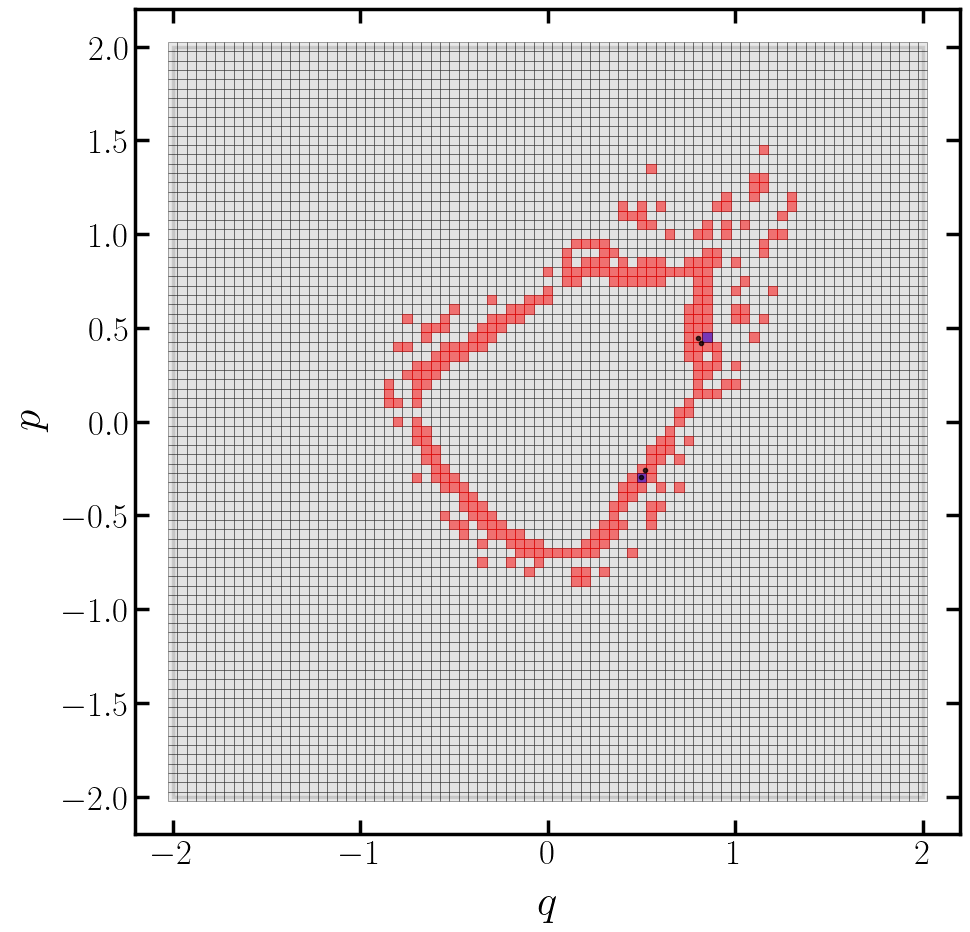

In [36]:
# Step-11: Sample

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.errorbar(*initial.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_11.png', dpi=dpi)      
plt.show()

In [37]:
# Scan (compute orbits)

scan(initial, orbits, orbit(size, threshold, forward2d), knobs)

In [38]:
# Unstable mask (should contain at least one unstalbe orbit)

unstable = np.isnan(np.sum(orbits[:, -1], axis=1))
unstable

array([ True,  True,  True, False])

In [39]:
# Reshape and filter orbits

ps = orbits[mask(orbits, threshold)].reshape(-1, dimension)
ps = filter(ps, cut)

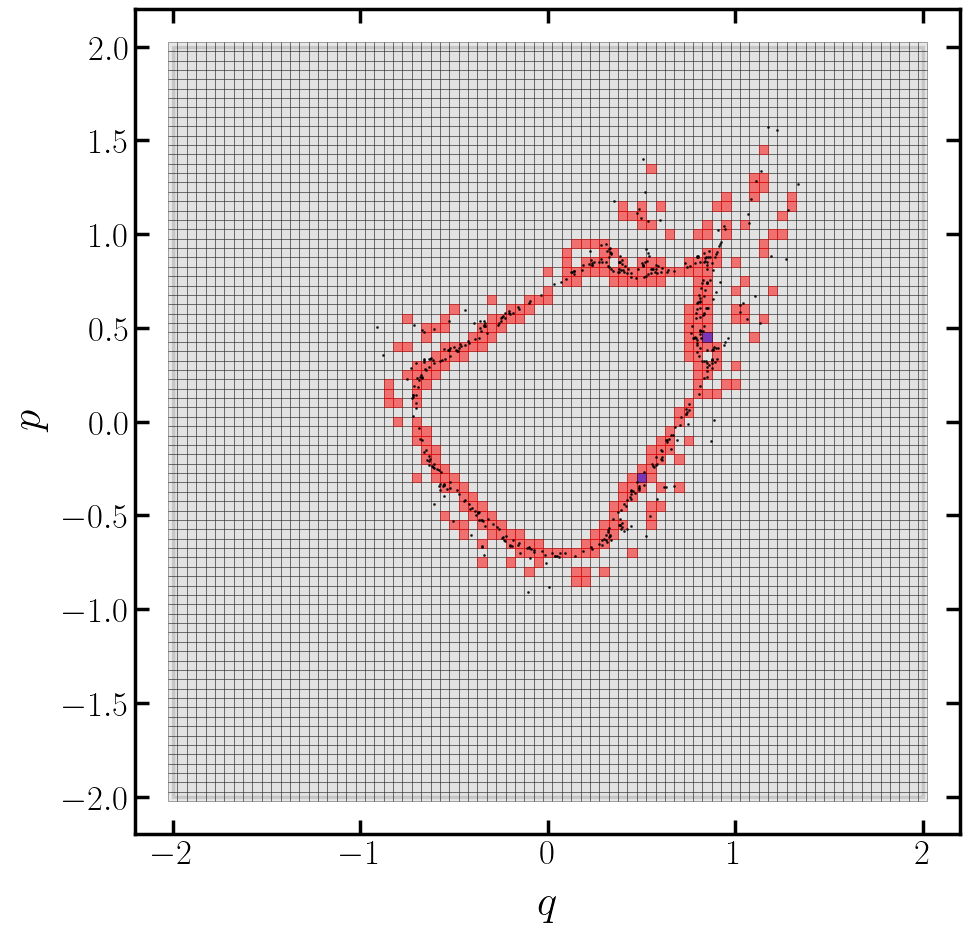

In [40]:
# Step-12: Orbits

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_12.png', dpi=dpi)      
plt.show()

In [41]:
# Update domain

domain.update(ps)

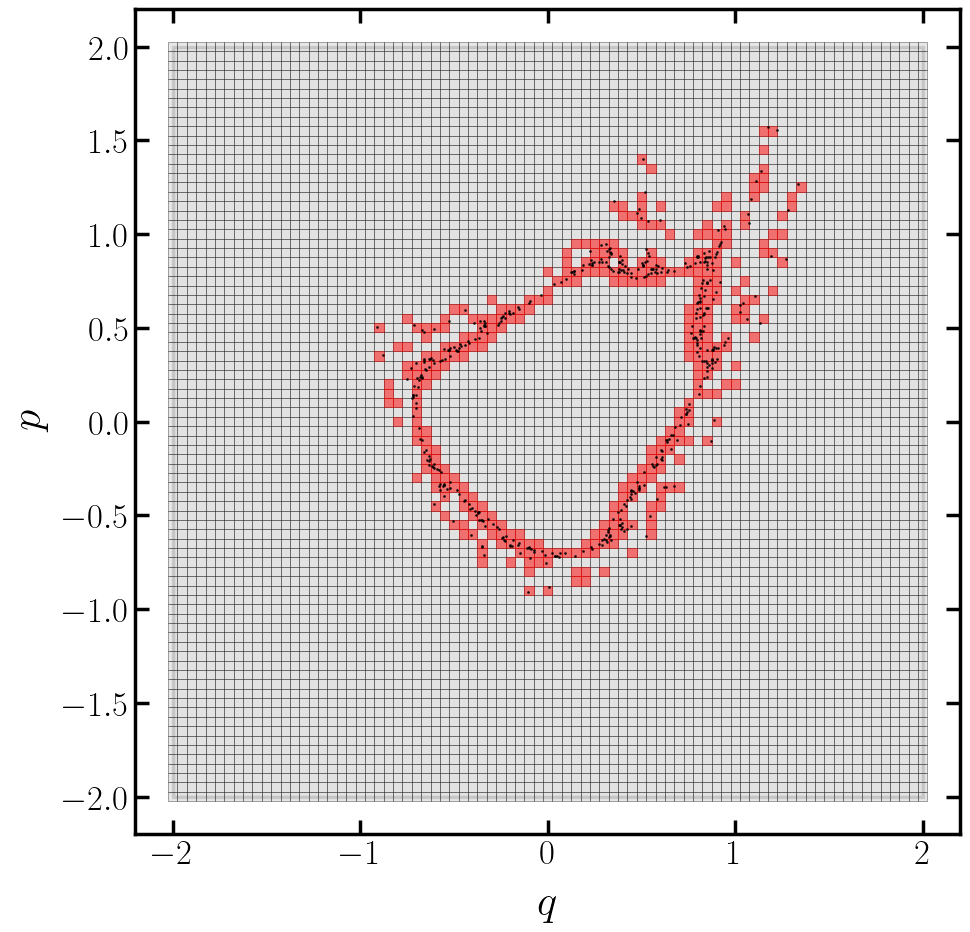

In [42]:
# Step-13: Project

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_13.png', dpi=dpi)      
plt.show()

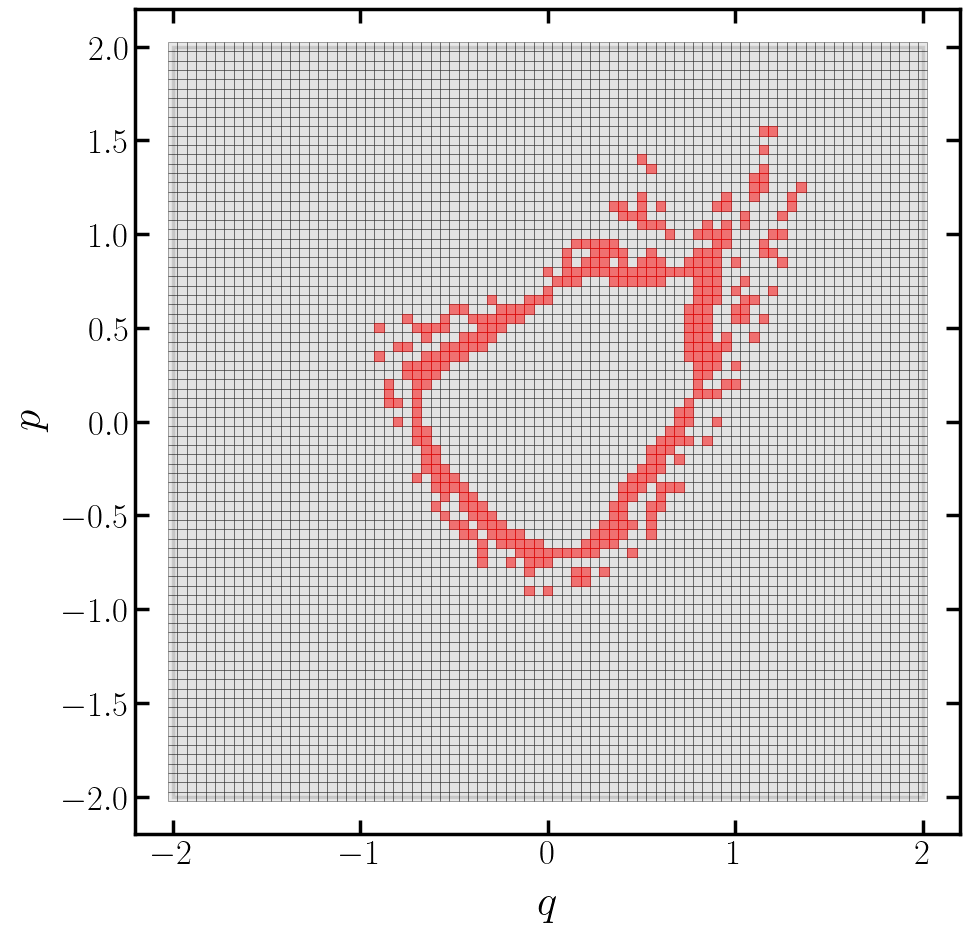

In [43]:
# Step-14: Current

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_14.png', dpi=dpi)      
plt.show()

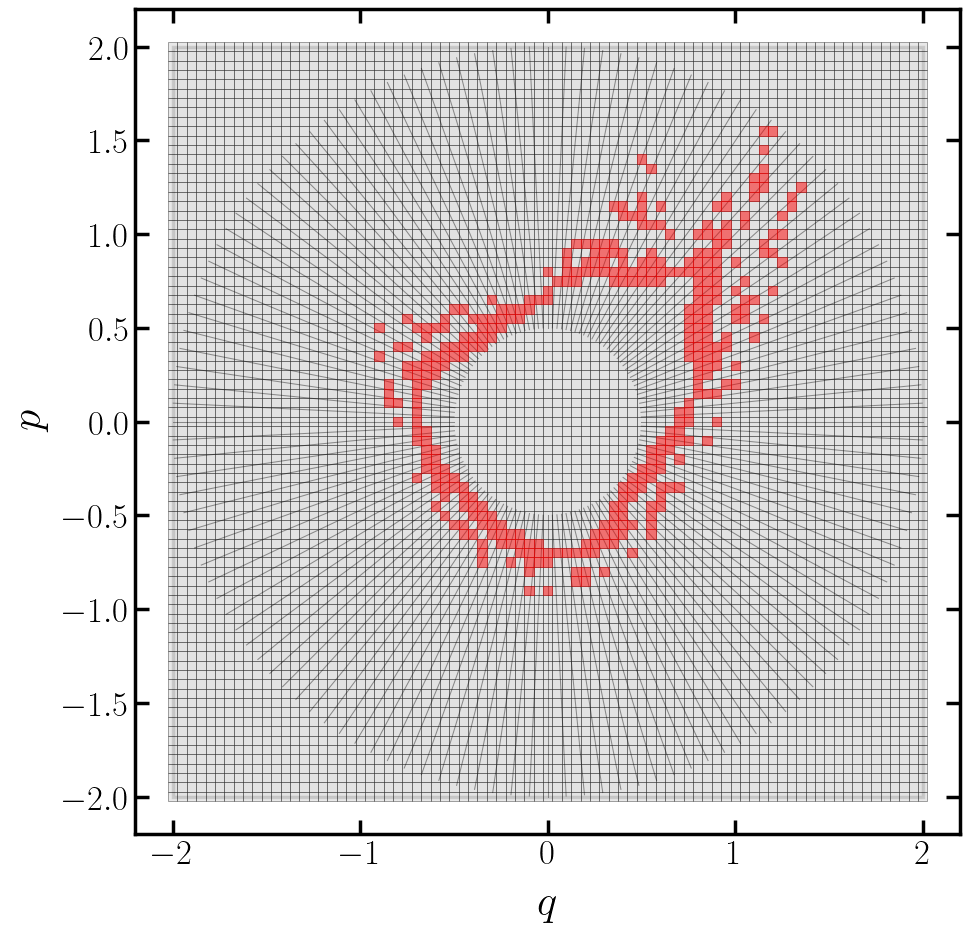

In [44]:
# Step-15: Directions

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
rmin = 0.5
rmax = 2.0
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.75, linestyle="-", alpha=0.75, zorder=1)  
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=3))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_15.png', dpi=dpi)      
plt.show()

In [45]:
keys, *_  = domain.boundary(*(128, 128), center, ds)
flag = np.sum(keys == -1)
flag

np.int64(0)

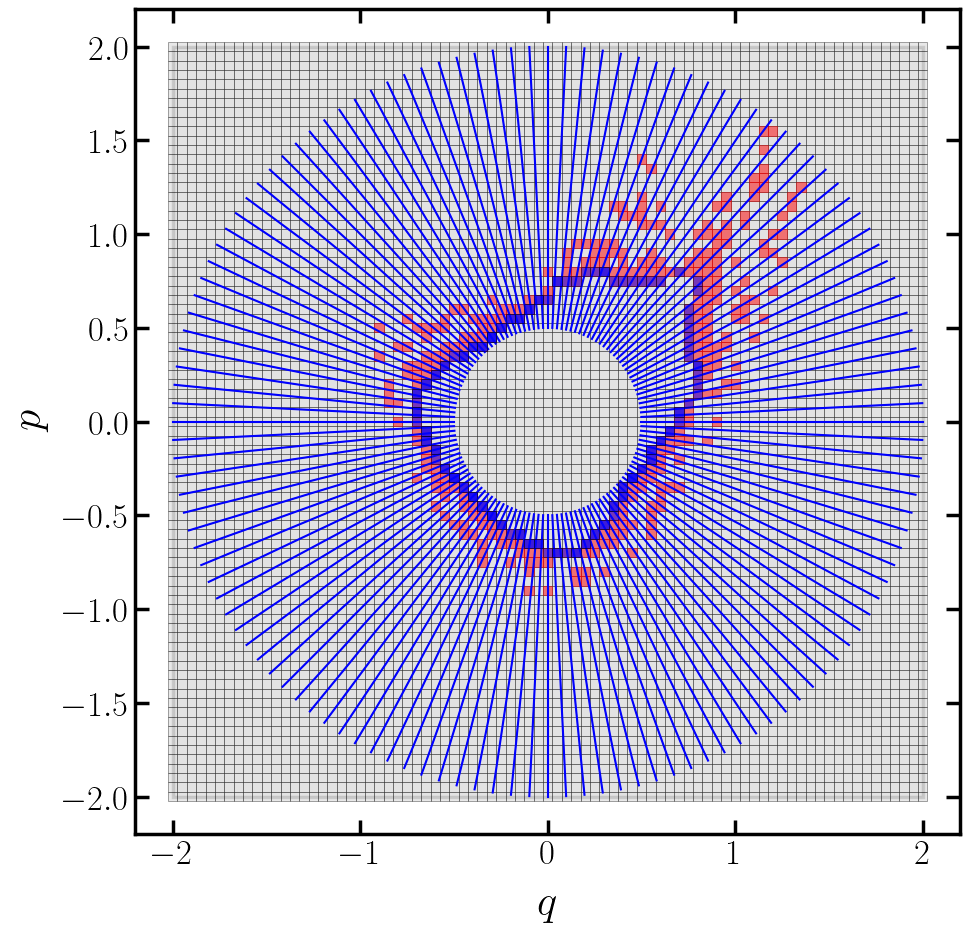

In [46]:
# Step-16: Activation

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
rmin = 0.5
rmax = 2.0
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.75, linestyle="-", alpha=0.75, zorder=1)  
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=3))
for (dq, dp), key in zip(ds, keys):
    if key == -1:
        ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="red", linewidth=1.5, linestyle="-", alpha=1, zorder=3) 
        continue
    (cx, cy), *_ = domain.transform(np.array([key]))
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="blue", linewidth=1.5, linestyle="-", alpha=1, zorder=4) 
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=4))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_16.png', dpi=dpi)      
plt.show()

In [47]:
# Keep only the inner shell

domain = Domain(lb, ub, dl)
domain.insert(keys[keys!=-1])

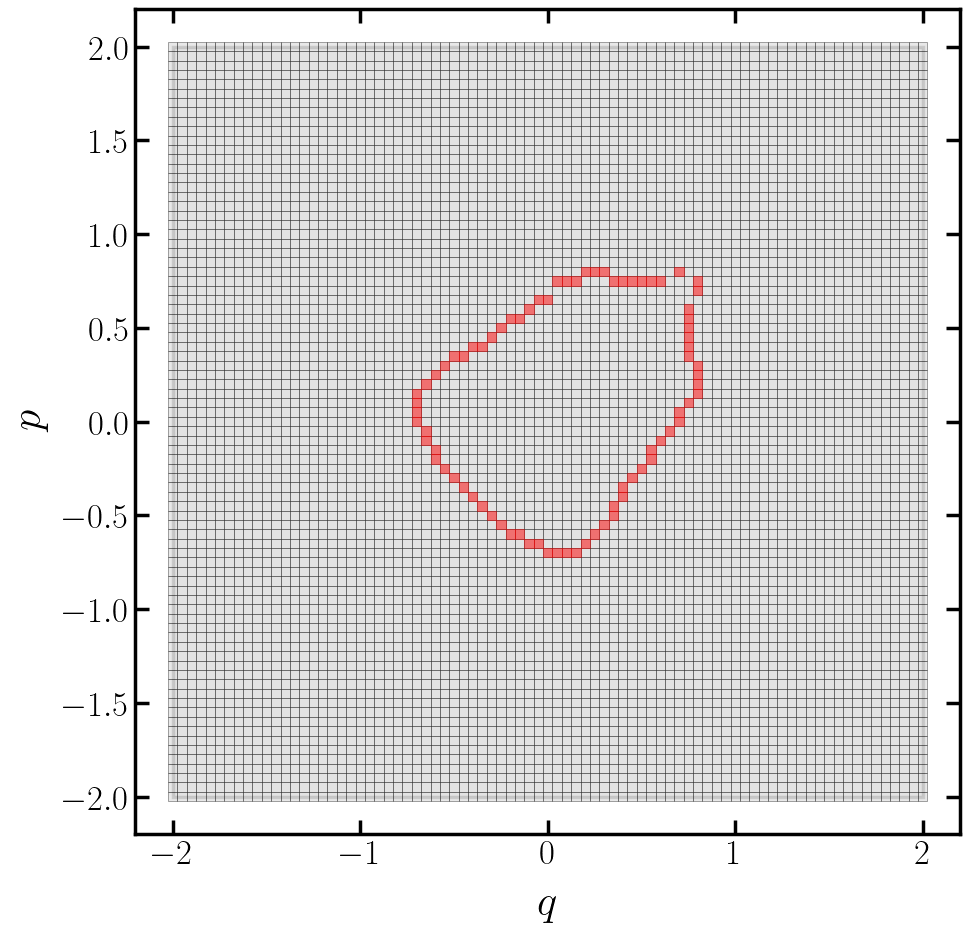

In [48]:
# Step-17: Current

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_17.png', dpi=dpi)      
plt.show()

In [49]:
# Random samples

indices = np.random.choice(domain.list, nsamples)
samples = domain.transform(indices)
initial = sample(npoints, scale*dl, samples)

In [50]:
# Define container

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

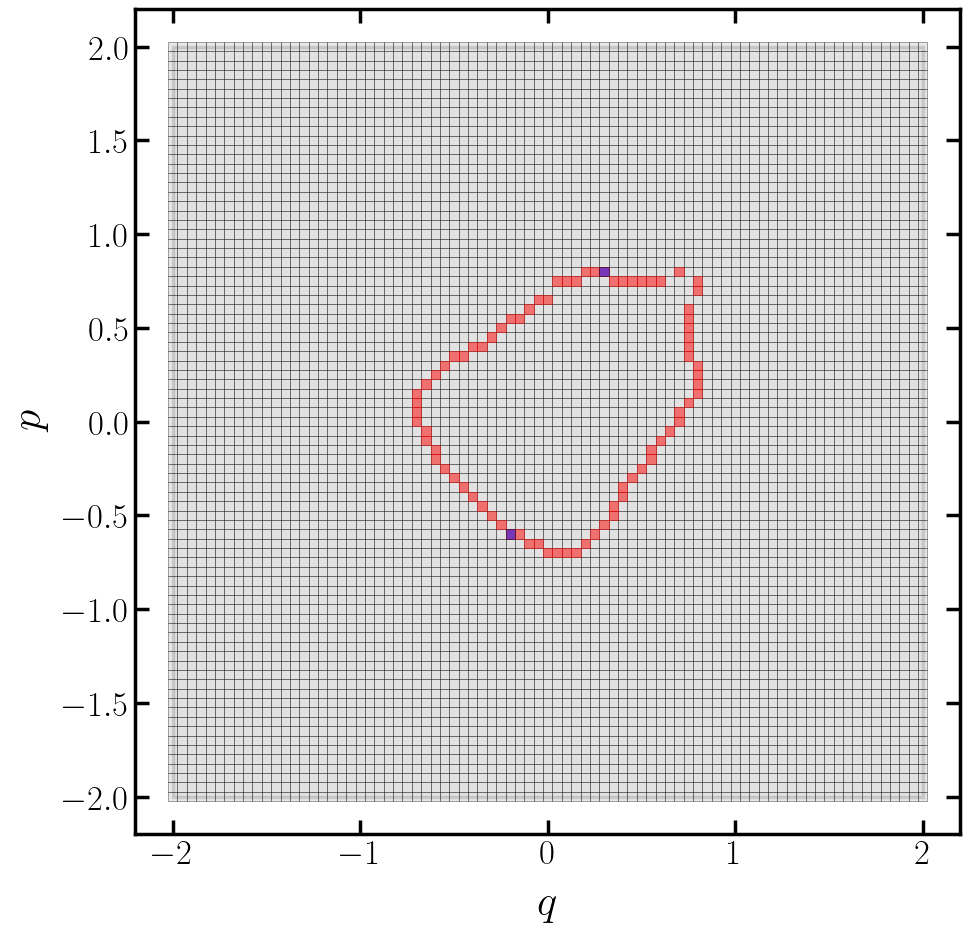

In [51]:
# Step-18: Select

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_18.png', dpi=dpi)      
plt.show()

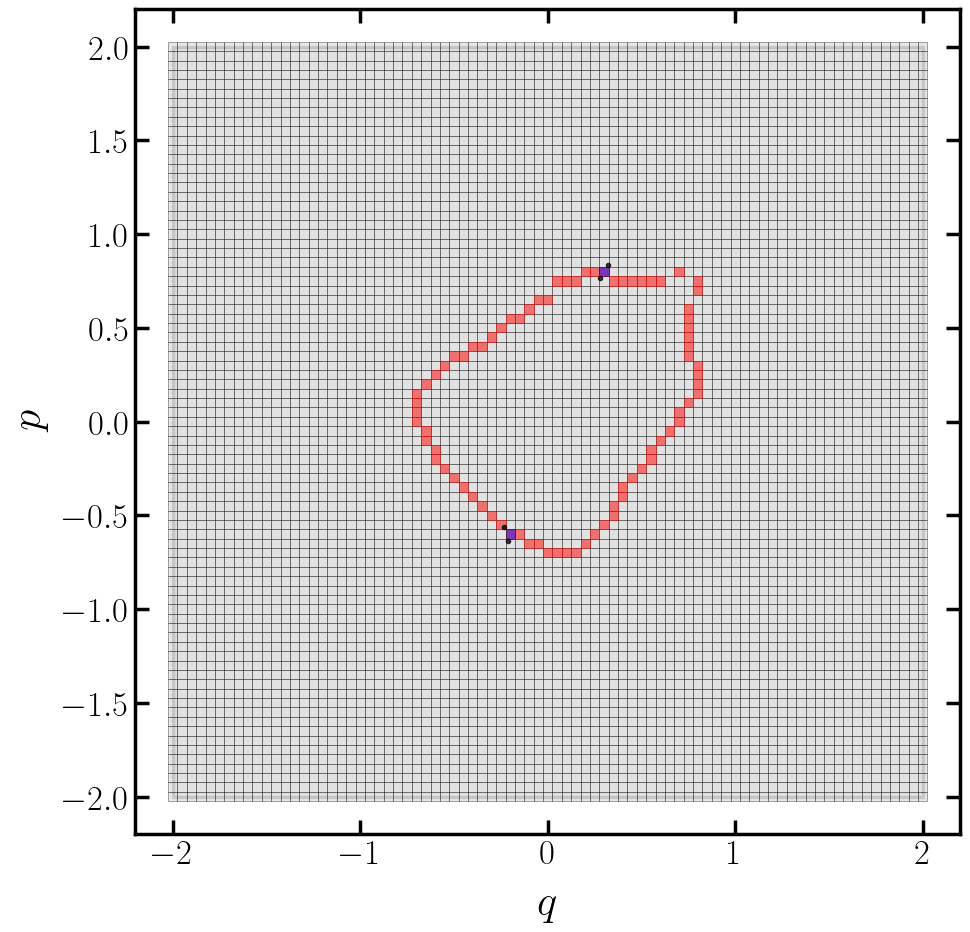

In [52]:
# Step-19: Sample

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.errorbar(*initial.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_19.png', dpi=dpi)      
plt.show()

In [53]:
# Scan (compute orbits)

scan(initial, orbits, orbit(size, threshold, forward2d), knobs)

In [54]:
# Unstable mask (should contain at least one unstalbe orbit)

unstable = np.isnan(np.sum(orbits[:, -1], axis=1))
unstable

array([ True, False,  True, False])

In [55]:
# Reshape and filter orbits

ps = orbits[mask(orbits, threshold)].reshape(-1, dimension)
ps = filter(ps, cut)

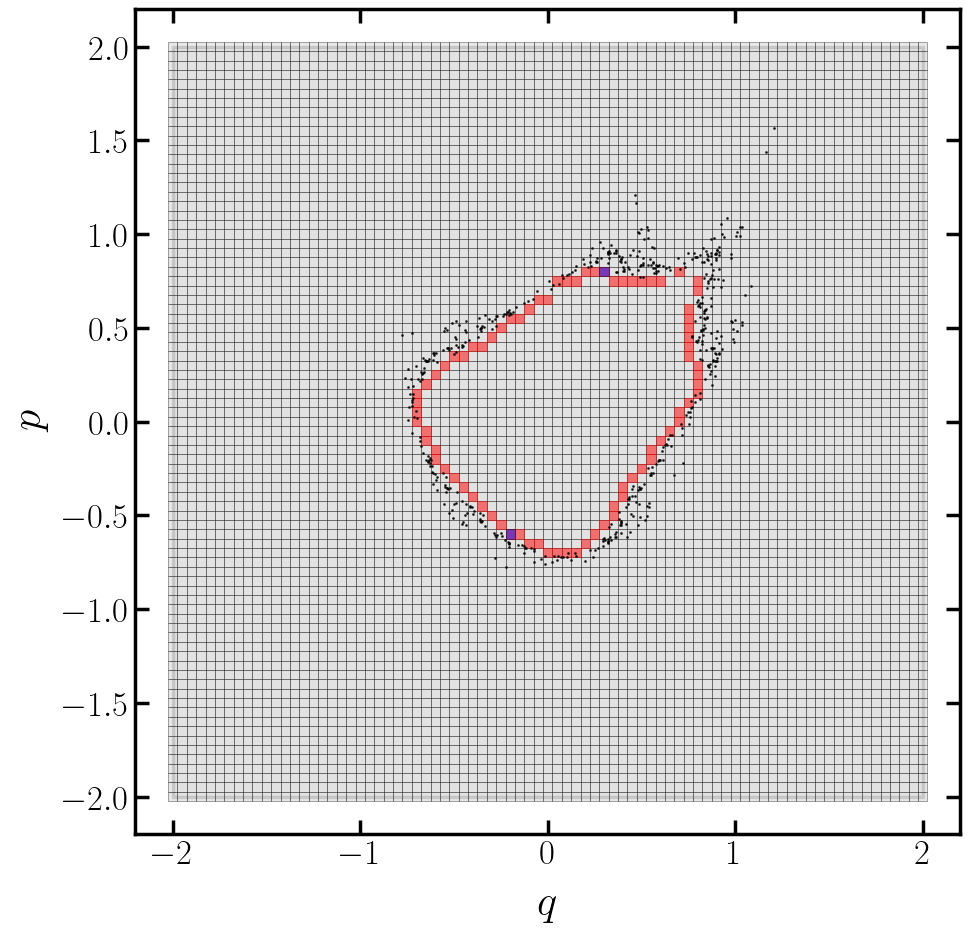

In [56]:
# Step-20: Orbits

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_20.png', dpi=dpi)      
plt.show()

In [57]:
# Update domain

domain.update(ps)

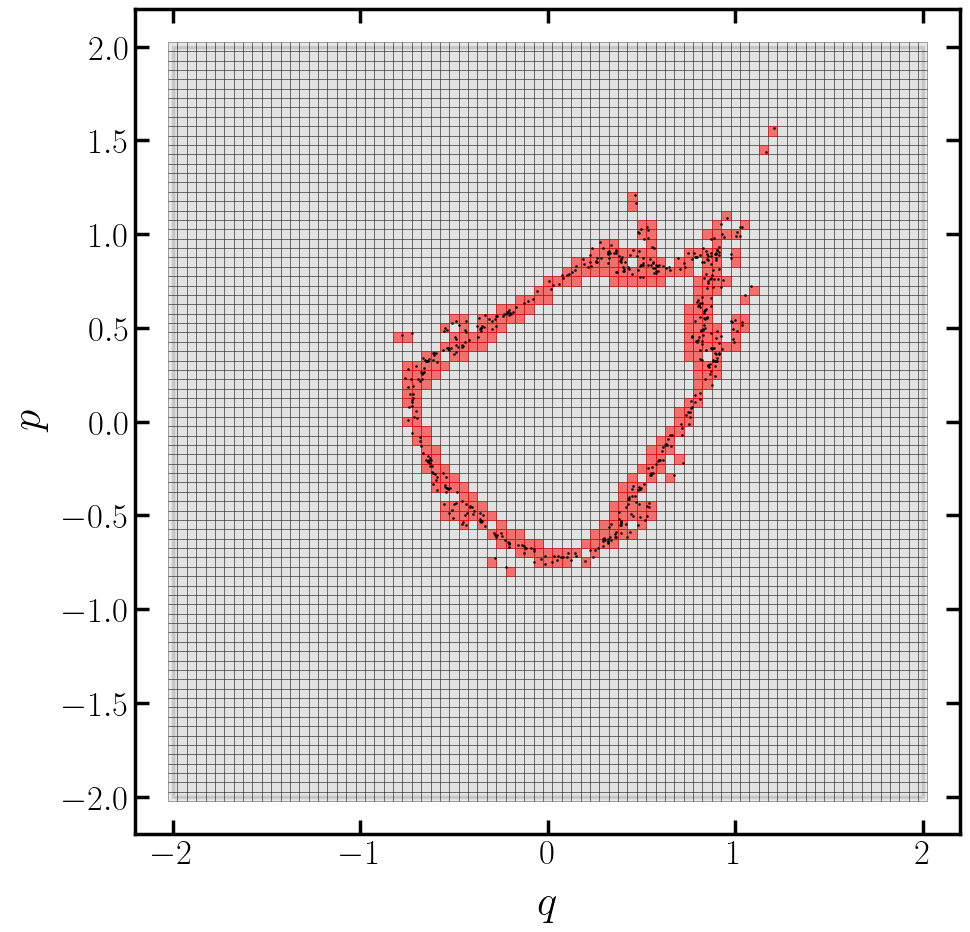

In [58]:
# Step-21: Project

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_21.png', dpi=dpi)      
plt.show()

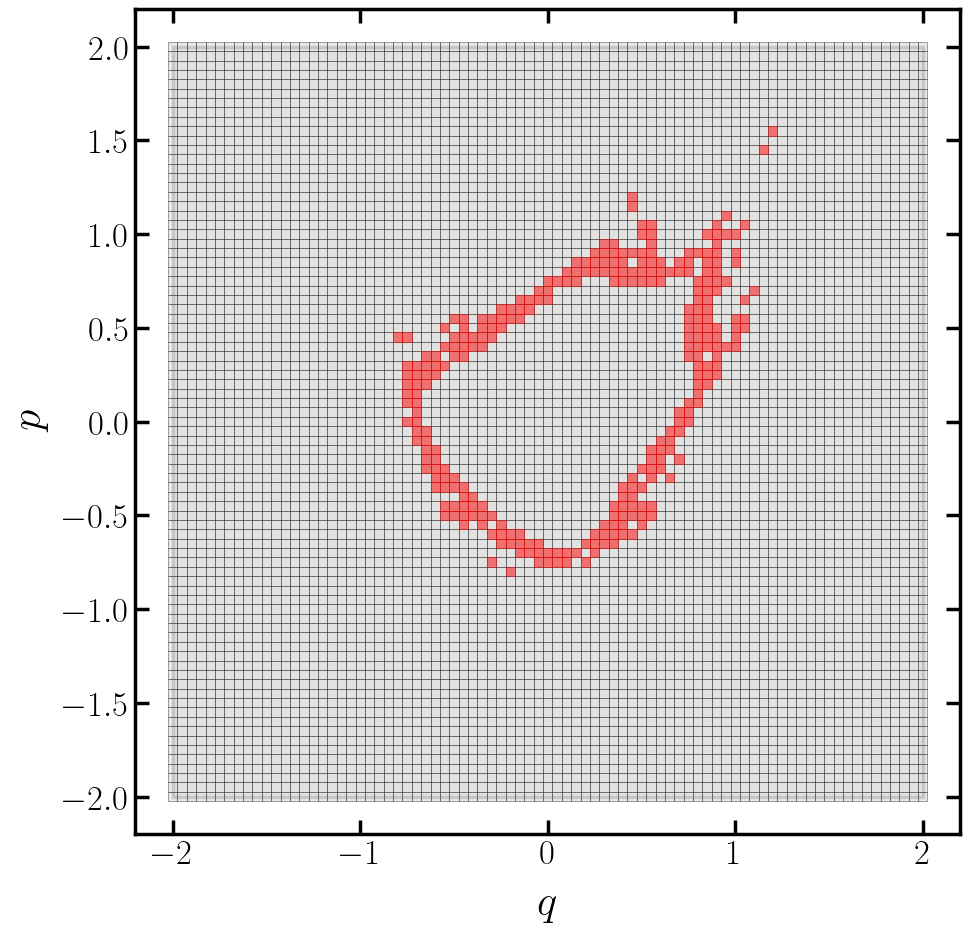

In [59]:
# Step-22: Current

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_22.png', dpi=dpi)      
plt.show()

In [60]:
keys, *_  = domain.boundary(*(128, 128), center, ds)
flag = np.sum(keys == -1)
flag

np.int64(0)

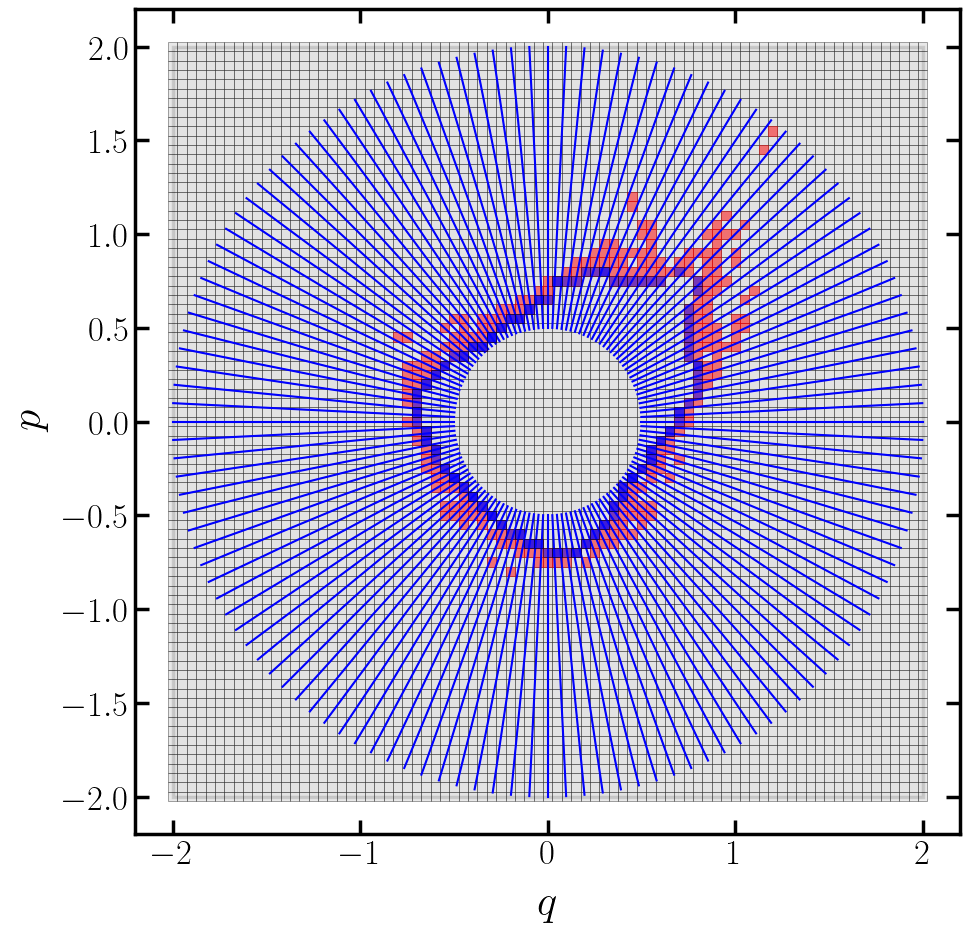

In [61]:
# Step-23: Activation

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
rmin = 0.5
rmax = 2.0
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.75, linestyle="-", alpha=0.75, zorder=1)  
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=3))
for (dq, dp), key in zip(ds, keys):
    if key == -1:
        ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="red", linewidth=1.5, linestyle="-", alpha=1, zorder=3) 
        continue
    (cx, cy), *_ = domain.transform(np.array([key]))
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="blue", linewidth=1.5, linestyle="-", alpha=1, zorder=4) 
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=4))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_23.png', dpi=dpi)      
plt.show()

In [62]:
# Keep only the inner shell

domain = Domain(lb, ub, dl)
domain.insert(keys[keys!=-1])

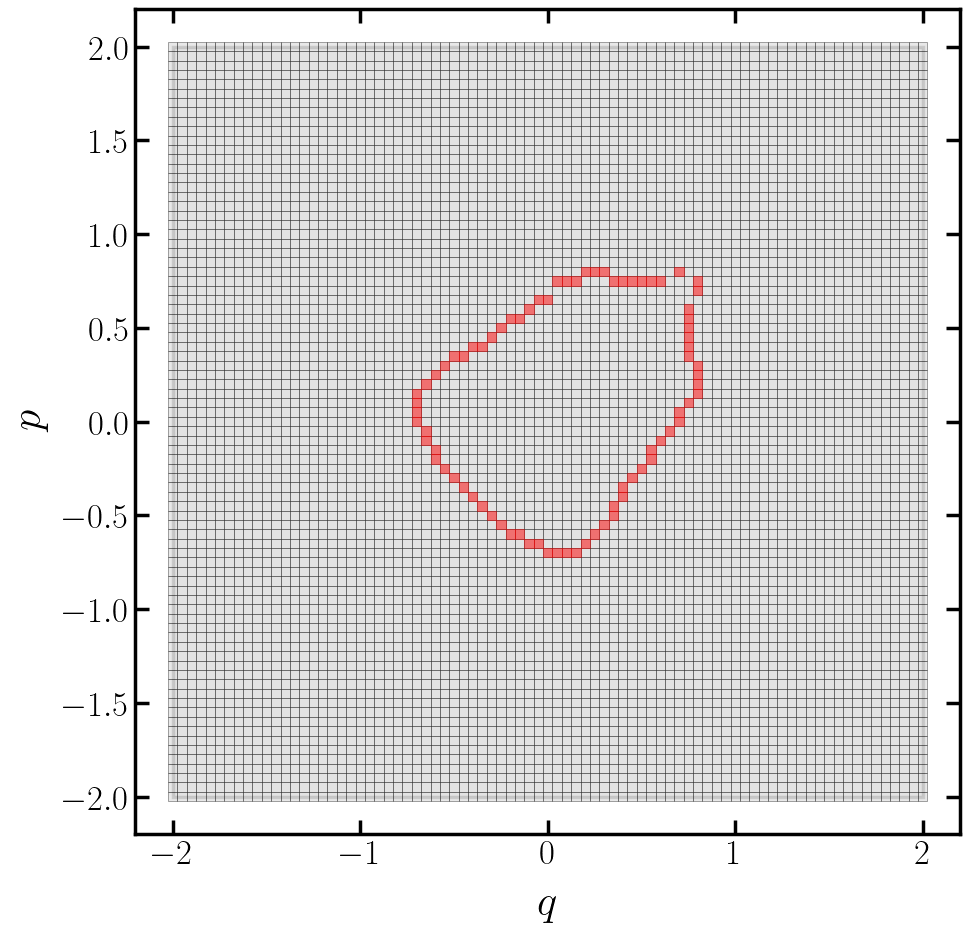

In [63]:
# Step-24: Current

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_24.png', dpi=dpi)      
plt.show()

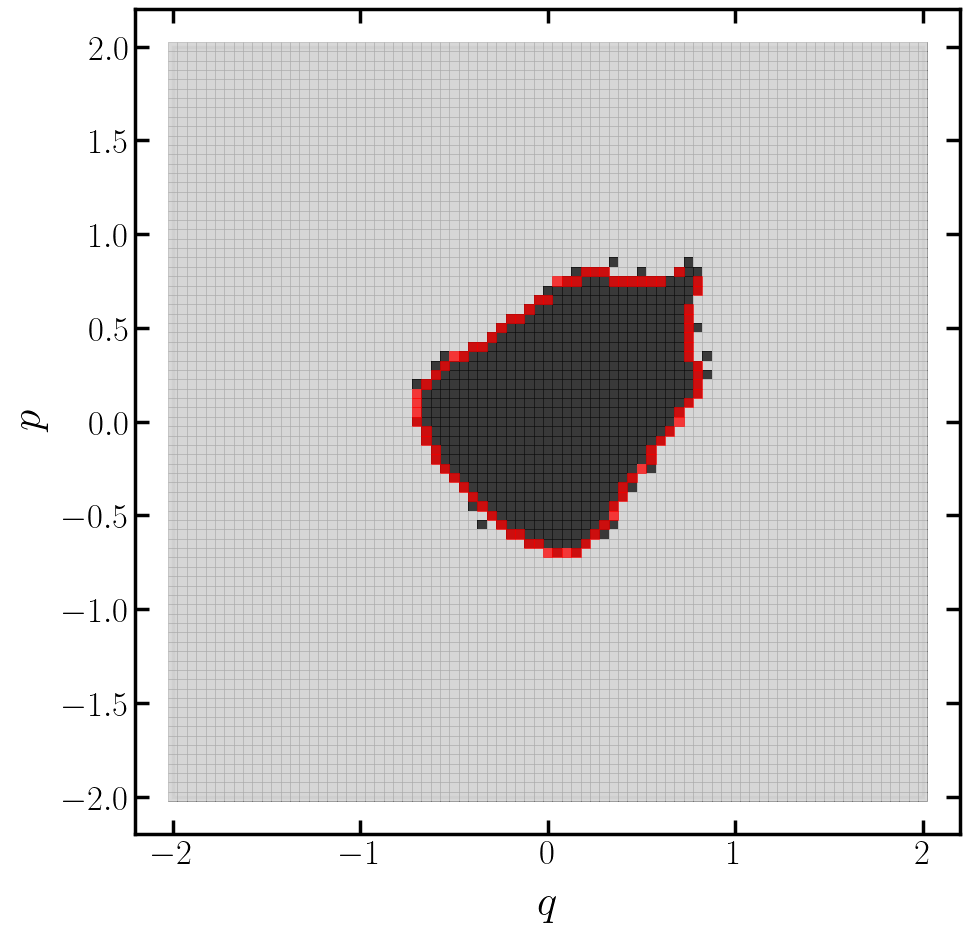

In [64]:
# Step-25: Comparison

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in grid[out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
for cx, cy in grid[~out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.75, zorder=3))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_25.png', dpi=dpi)
plt.show()

In [65]:
# Grow the domain (forward)

domain_forward = Domain(lb, ub, dl)
domain_forward.insert(domain.keys)

domain_forward_box = []
local = Domain(lb, ub, dl)
local.insert(domain_forward.keys)
domain_forward_box.append(local)

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

for epoch in range(32):
    indices = np.random.choice(domain_forward.list, nsamples)
    centers = domain_forward.transform(indices)
    initial = sample(npoints, scale*dl, centers)
    scan(initial, orbits, orbit(size, threshold, forward2d), knobs)
    points = orbits[mask(orbits, threshold)].reshape(-1, dimension)
    points = filter(points, threshold)
    domain_forward.update(points)
    local = Domain(lb, ub, dl)
    local.insert(domain_forward.keys)
    domain_forward_box.append(local)
    print(f'{epoch + 1:02d}', f'{domain_forward.size:12d}')
    if domain_forward.size > 128_000_000:
        break

01           78
02          255
03          295
04          370
05          409
06          426
07          434
08          468
09          509
10          527
11          532
12          570
13          577
14          580
15          599
16          626
17          634
18          655
19          679
20          695
21          712
22          730
23          746
24          752
25          765
26          766
27          774
28          778
29          785
30          801
31          801
32          803


In [66]:
# Grow the domain (inverse)

domain_inverse = Domain(lb, ub, dl)
domain_inverse.insert(domain.keys)

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

domain_inverse_box = []
local = Domain(lb, ub, dl)
local.insert(domain_inverse.keys)
domain_inverse_box.append(local)

for epoch in range(32):
    indices = np.random.choice(domain_inverse.list, nsamples)
    centers = domain_inverse.transform(indices)
    initial = sample(npoints, scale*dl, centers)
    scan(initial, orbits, orbit(size, threshold, inverse2d), knobs)
    points = orbits[mask(orbits, threshold)].reshape(-1, dimension)
    points = filter(points, threshold)
    domain_inverse.update(points)
    local = Domain(lb, ub, dl)
    local.insert(domain_inverse.keys)
    domain_inverse_box.append(local)    
    print(f'{epoch + 1:02d}', f'{domain_inverse.size:12d}')
    if domain_inverse.size > 128_000_000:
        break

01           78
02          205
03          205
04          357
05          392
06          462
07          495
08          497
09          533
10          561
11          598
12          615
13          623
14          623
15          626
16          641
17          656
18          660
19          674
20          679
21          683
22          705
23          707
24          726
25          749
26          751
27          757
28          765
29          771
30          773
31          775
32          782


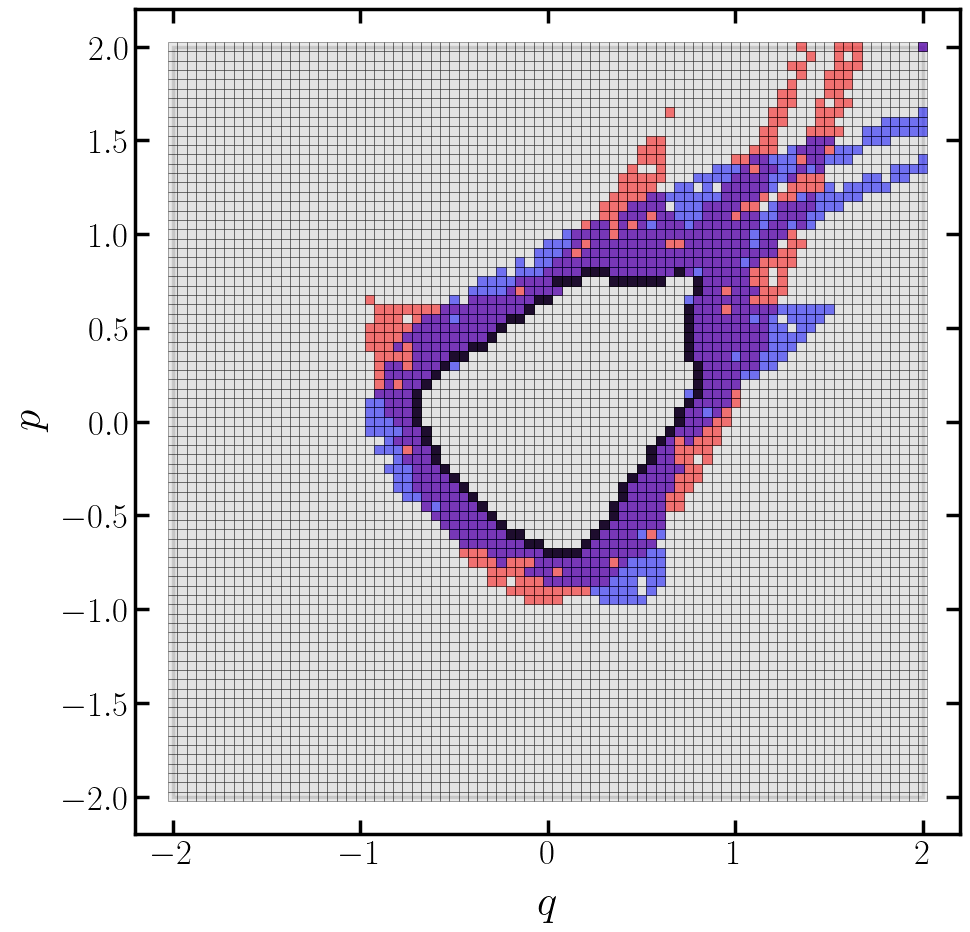

In [67]:
# Step-26: Growth

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain_forward.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain_inverse.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="black", linewidth=0.5, alpha=0.75, zorder=5))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_26.png', dpi=dpi)
plt.show()

In [68]:
domain_final = Domain(lb, ub, dl)
domain_final.insert(keys[keys!=-1])

In [69]:
domain_final = Domain(lb, ub, dl)
domain_final.insert(domain_forward.keys)
domain_final.insert(domain_inverse.keys)

In [70]:
keys, *_  = domain_final.boundary(*(128, 128), center, ds)
flag = np.sum(key == -1)
flag

np.int64(0)

In [71]:
domain_final = Domain(lb, ub, dl)
domain_final.insert(keys[keys!=-1])

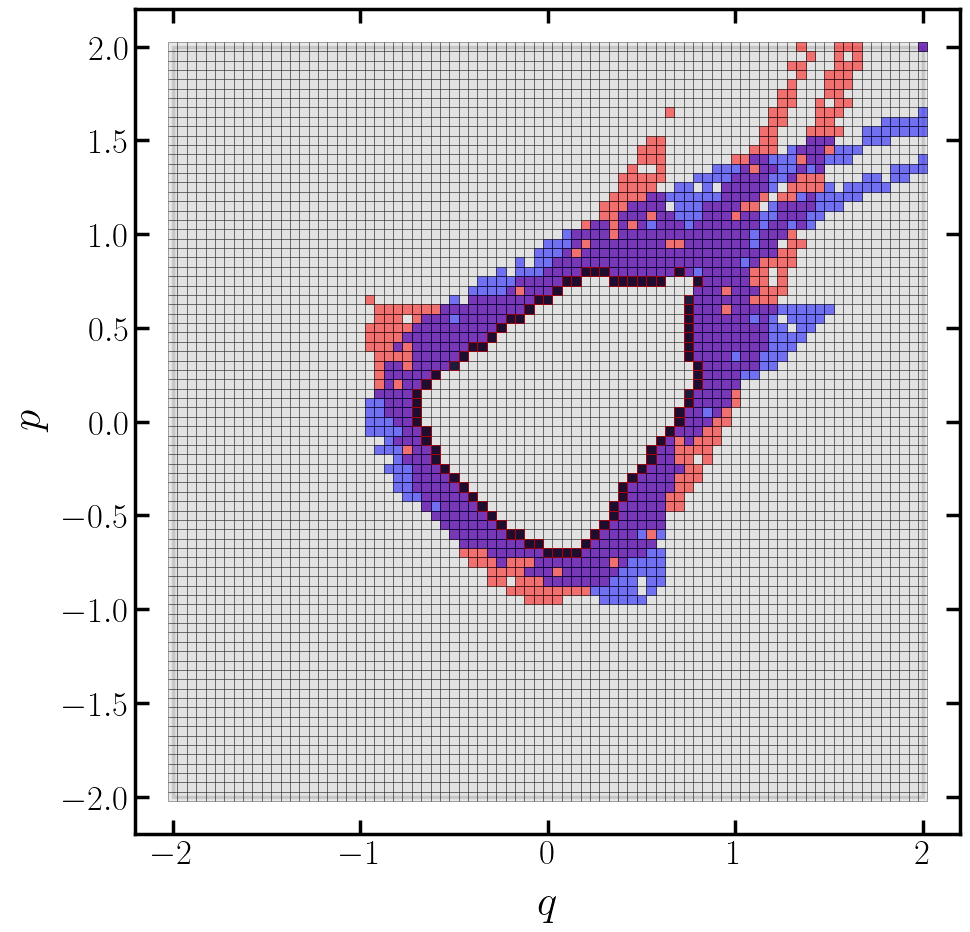

In [72]:
# Step-27: Updated

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain_forward.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain_inverse.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain_final.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="red", linewidth=0.5, alpha=0.75, zorder=5))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_27.png', dpi=dpi)
plt.show()

## Steps: Global parameters (alternative knob values)

In [73]:
# Domain 

dimension = 2                            # -- phase-space dimension
dl = 0.05                                # -- domain cell side length
dr = dl*dimension**0.5                   # -- radial step size
lb = np.array([-2, -2])                  # -- domain lower bounds for (qx, qy, px, py)
ub = np.array([+2, +2])                  # -- domain upper bounds for (qx, qy, px, py)
size = 2**10                             # -- total number of iterations
ndirections = 2                          # -- number of initial random directions
nsamples = 2                             # -- number of random marked cells selected from the current marked cells
npoints = 2                              # -- number of random points to generate for each selected cell
nrounds = 128                            # -- maximum number of expansion rounds to perform
nepochs = 32                             # -- number of domain computations (MC over initial directions and expansion)
center = np.array([0., 0., 0., 0])       # -- domain center
cut = 2.0                                # -- selection cut radius
threshold = 100.0                        # -- threshold radius (an initial condition with larger radius is considered lost)
termination = 0.95                       # -- termination parameter (fraction of rays hitting marked domain cells)
scale = 1.0                              # -- perturbation scaling factor for new sample generation
bins_plane = 16                          # -- number of bins for the mixing coordinate
bins_phase = 32                          # -- number of bins for the in-plane phases
phase_threshold = 1.0E-3                 # -- phase threshold used in weighted selection
alpha_plane = 1.0                        # -- plane weight factor
alpha_phase = 0.5                        # -- phase weight factor
boost = 0.5                              # -- weight boost near the edges
delta = 1.0                              # -- inverse-density score regularization
uniform = 0.05                           # -- fraction of uniform sampling to use
power = 1.0                              # -- score power
uniform = 0.05                           # -- fraction of uniform sampling

# Grid

grid = Domain(lb, ub, dl) 
grid.insert(np.arange(grid.total))
grid = grid.construct
grid.shape

# Reference point

center = np.array([0.0, 0.0])

# Reference directions

ds = directions(dimension, 128, random=False, ij=(0, 1), omega_min=0.0, omega_max=2*np.pi)

# Map parameters

a, b = -0.065, 0.0
knobs = np.asarray([a, b])

# Objective

objective = iterate(size, threshold, forward2d)

## Steps: The grid scan method (alternative knob values)

In [74]:
# Set output container

out = np.zeros((len(grid, )), dtype=np.bool_)

In [75]:
# Perform scan

scan(grid, out, objective, knobs)

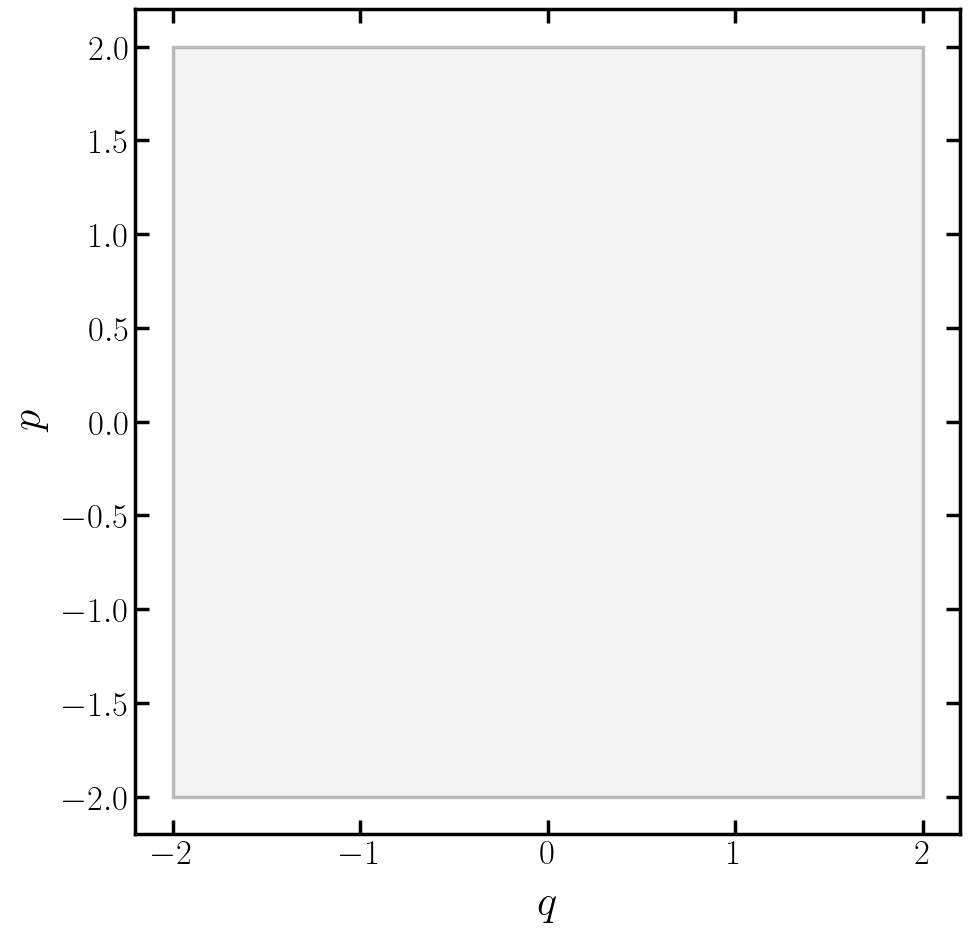

In [76]:
# Step-01: Domain

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'grid_01.png', dpi=dpi)
plt.show()

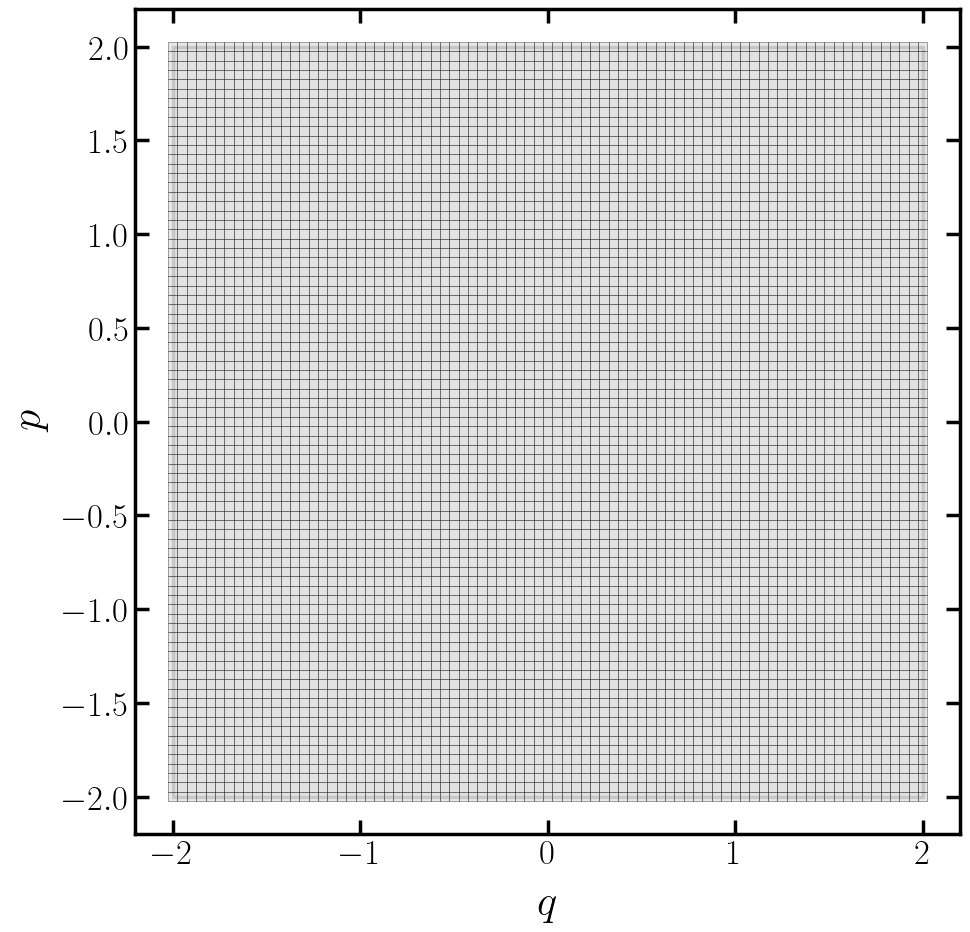

In [77]:
# Step-02: Grid

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'grid_02.png', dpi=dpi)    
plt.show()

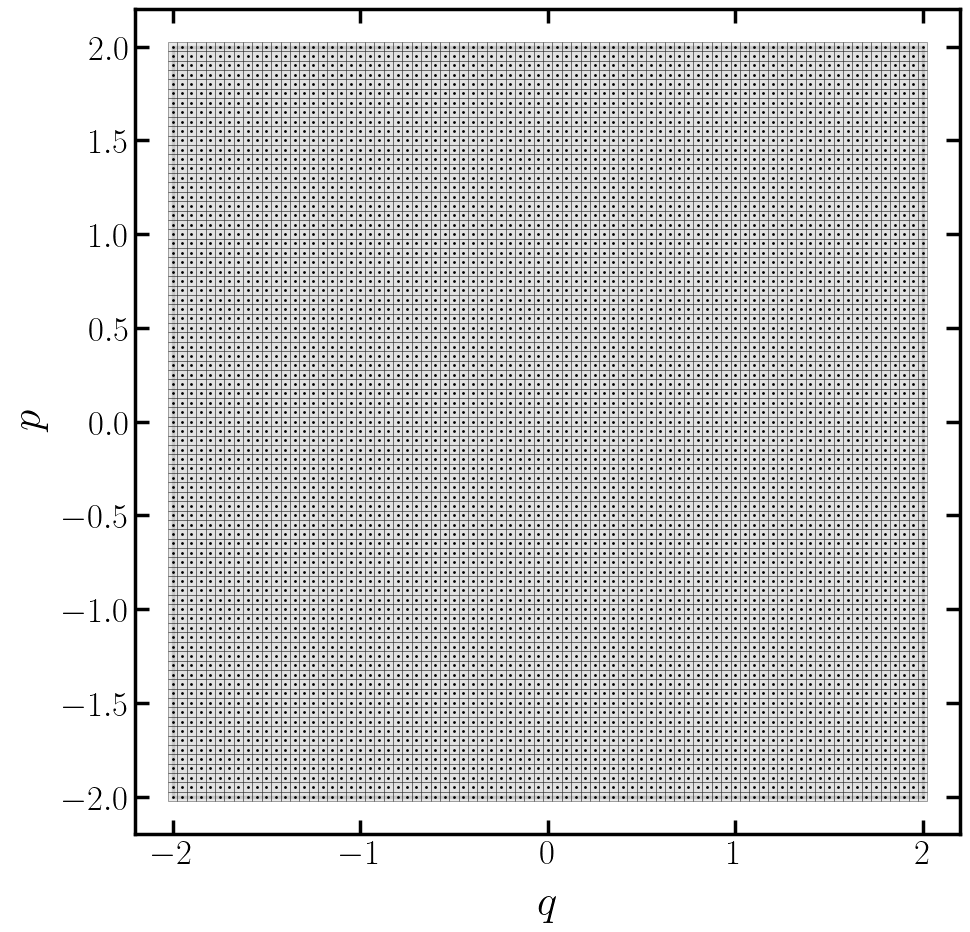

In [78]:
# Step-03: Coordinates

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
ax.errorbar(*grid.T, fmt=' ', marker="o", ms=1, color="black", zorder=2)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'grid_03.png', dpi=dpi)      
plt.show()

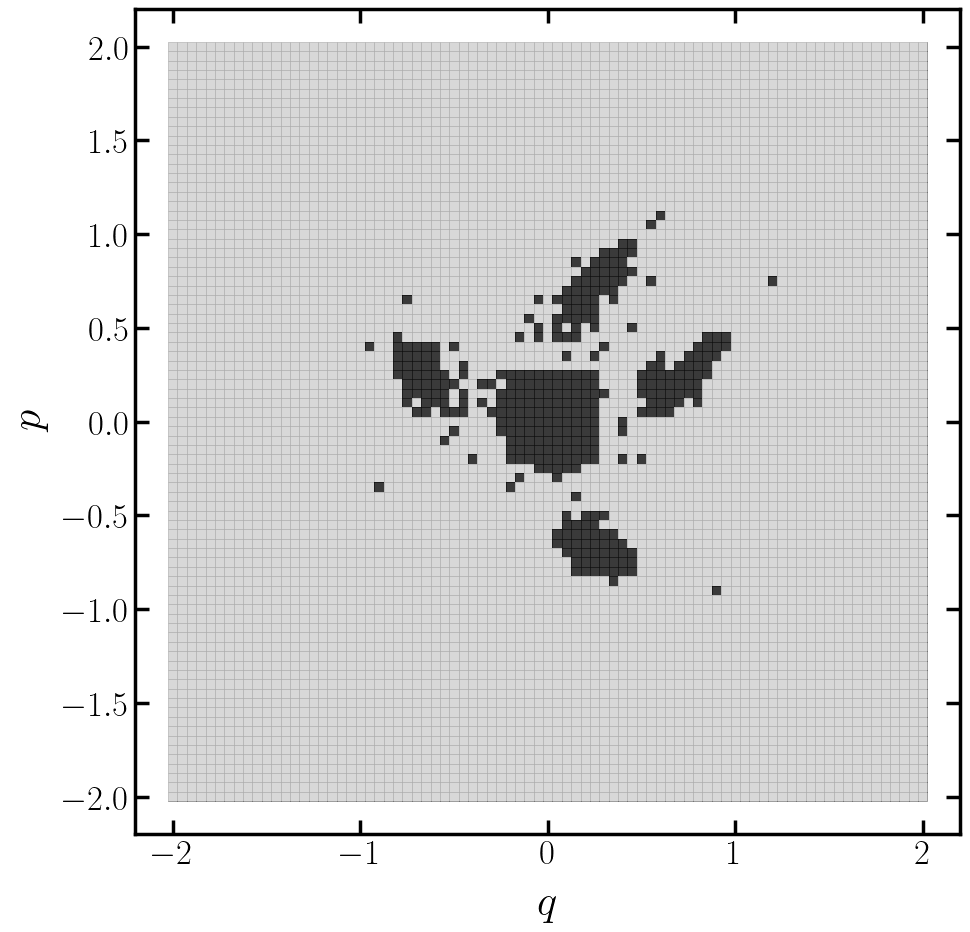

In [79]:
# Step-04: Scan

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.0, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in grid[out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
for cx, cy in grid[~out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'grid_04.png', dpi=dpi)      
plt.show()

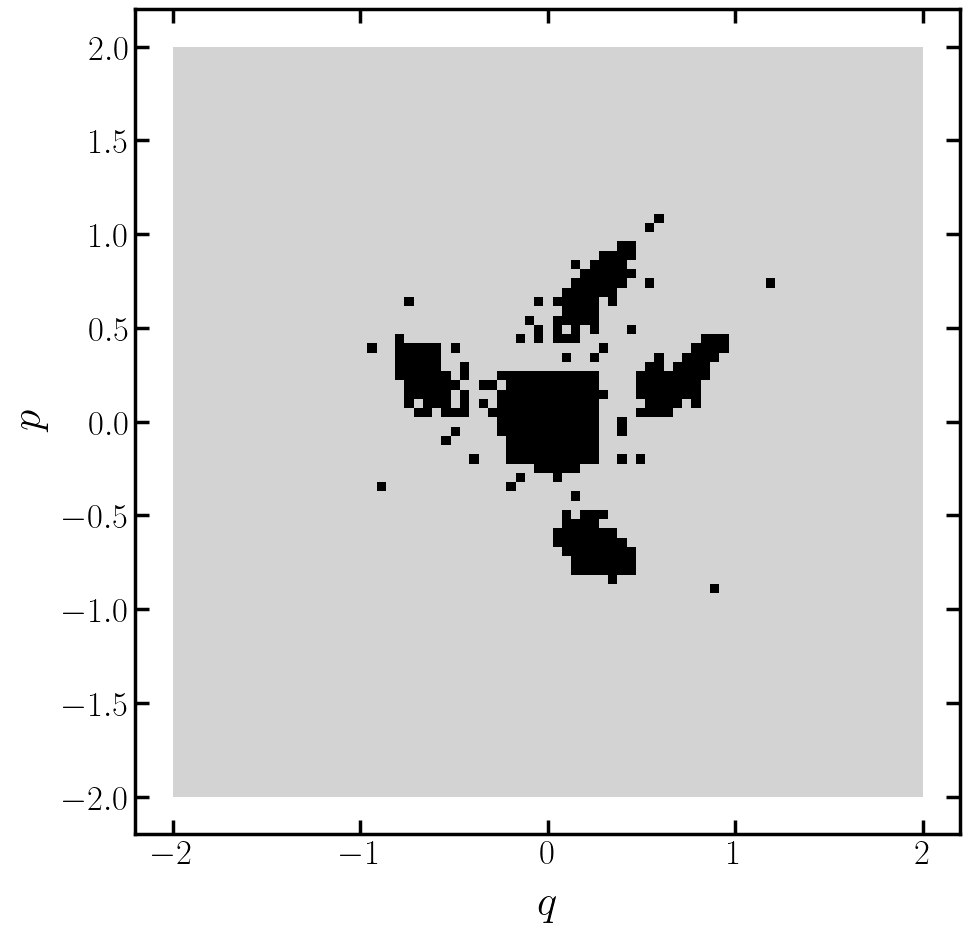

In [80]:
# Direct plotting

from matplotlib.colors import ListedColormap
cmap = ListedColormap(["lightgrey", "black"])

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
ax.imshow(out.reshape(int(len(out)**0.5), int(len(out)**0.5)), origin="lower", extent=(-2.0, 2.0, -2.0, 2.0), cmap=cmap, vmin=0, vmax=1, interpolation="nearest", aspect="equal")
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.show()

## Steps: The ray scan method (alternative knob values)

In [81]:
# Compute first unstable, stable and refined radii along the reference directions

ru, xu = da(1 + 1, dr, threshold, center, ds, objective, knobs, unstable=True)
rs, xs = da(1 + 1, dr, threshold, center, ds, objective, knobs, unstable=False)
rb, xb = refine(1 + 1, dr, threshold, center, ds, 8, rs, objective, knobs)

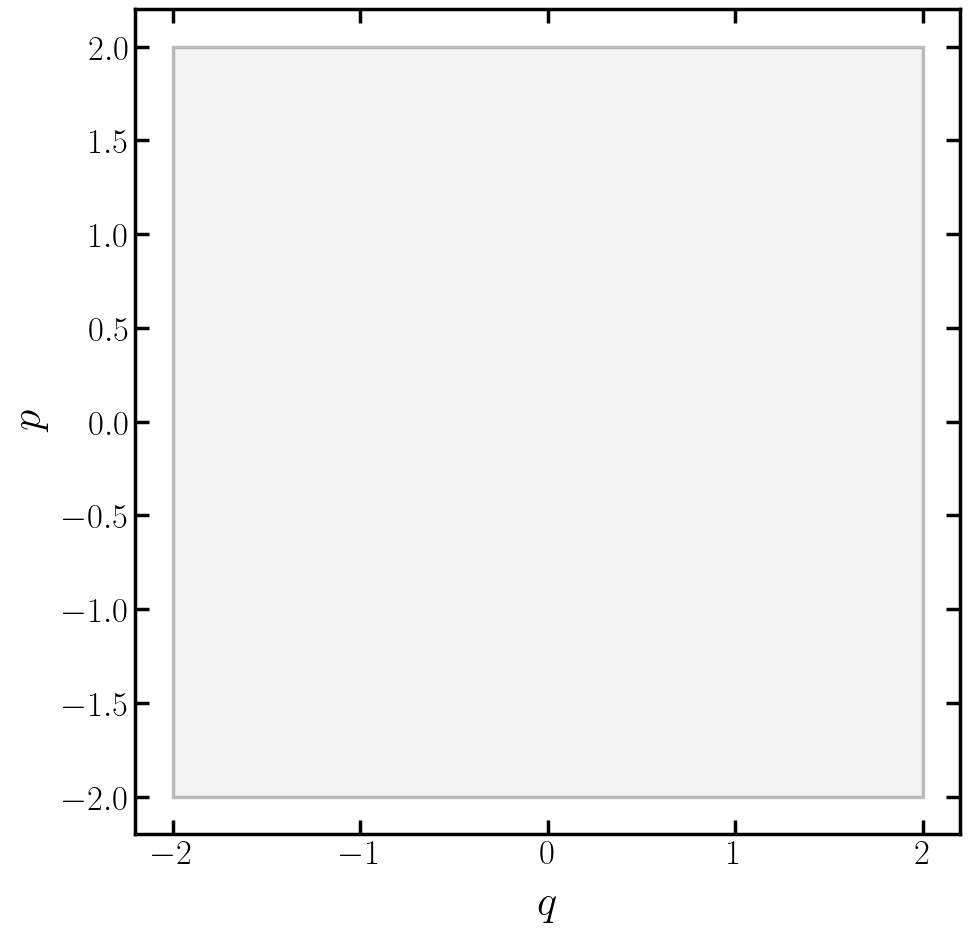

In [82]:
# Step-01: Domain

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_01.png', dpi=dpi)
plt.show()

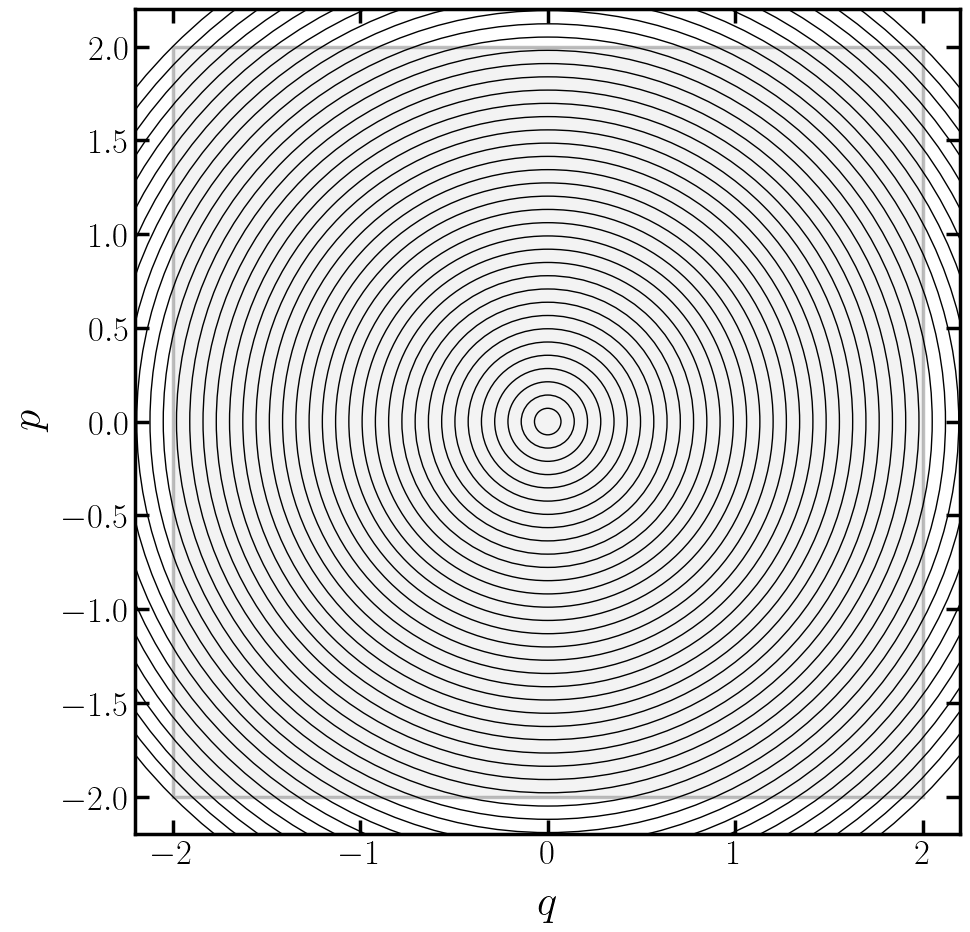

In [83]:
# Step-02: Circles

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
r = dr
while r <= 2.0*2**0.5:
    ax.add_patch(Circle((0.0, 0.0), radius=r, facecolor="none", edgecolor="black", linewidth=1.0, linestyle="-", alpha=1.0, zorder=2))
    r += dr
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_02.png', dpi=dpi)
plt.show()

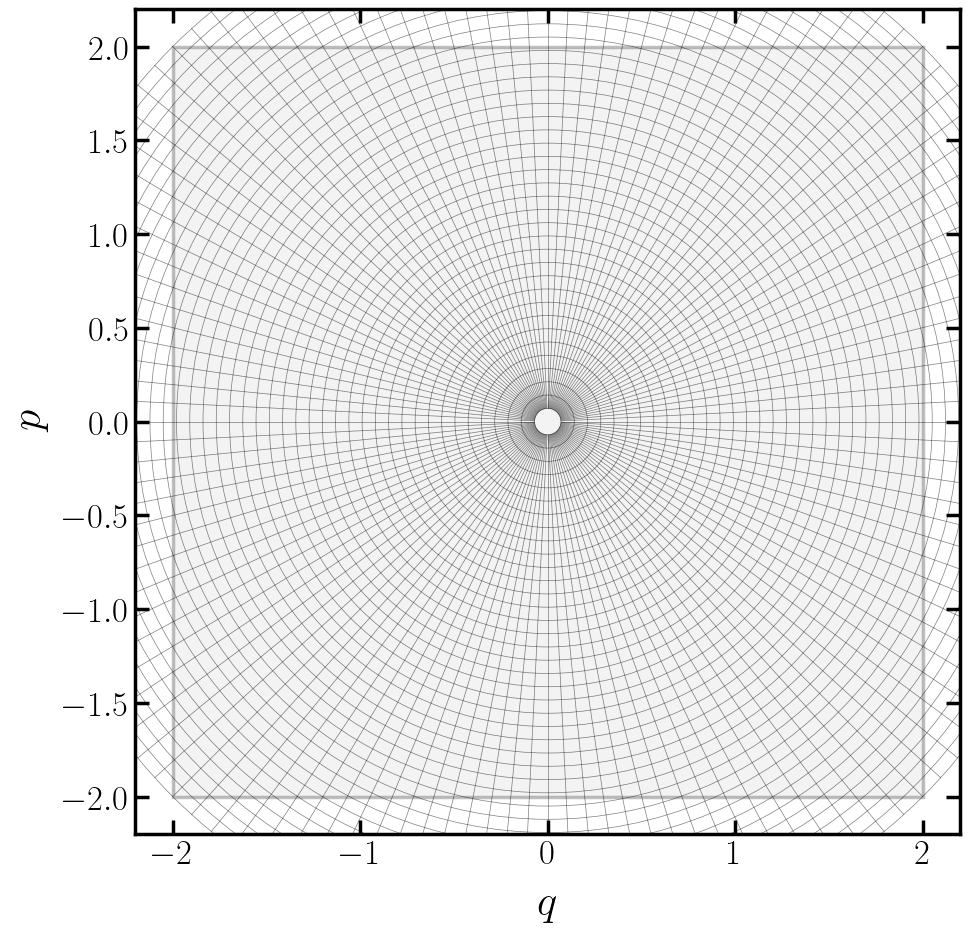

In [84]:
# Step-03: Rays

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)

domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
r = dr
while r <= 2.0 * 2**0.5:
    ax.add_patch(Circle((0.0, 0.0), radius=r, facecolor="none", edgecolor="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=2))
    r += dr
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_03.png', dpi=dpi)
plt.show()

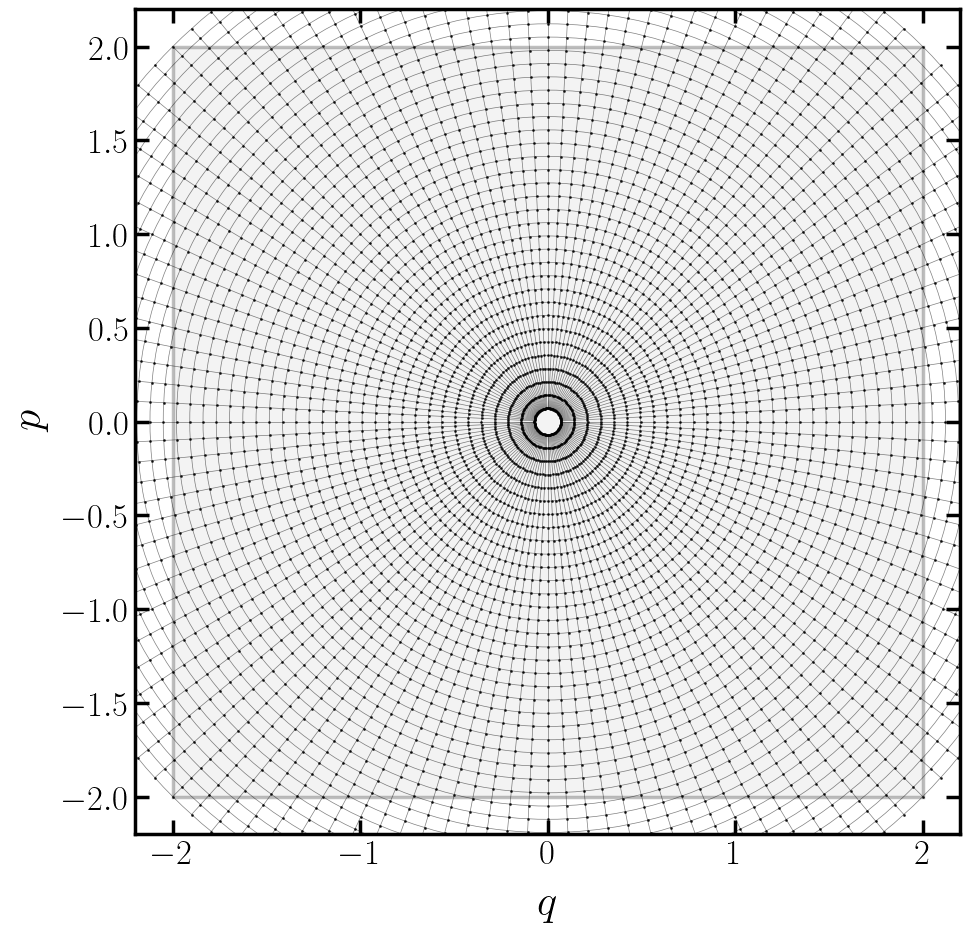

In [85]:
# Step-04: Coordinates

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
r = dr
while r <= 2.0 * 2**0.5:
    ax.add_patch(Circle((0.0, 0.0), radius=r, facecolor="none", edgecolor="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=2))
    r += dr
rmin = dr
rmax = 2.0 * 2**0.5
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=3)
points = np.array([[r * dq, r * dp] for dq, dp in ds for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_04.png', dpi=dpi)
plt.show()

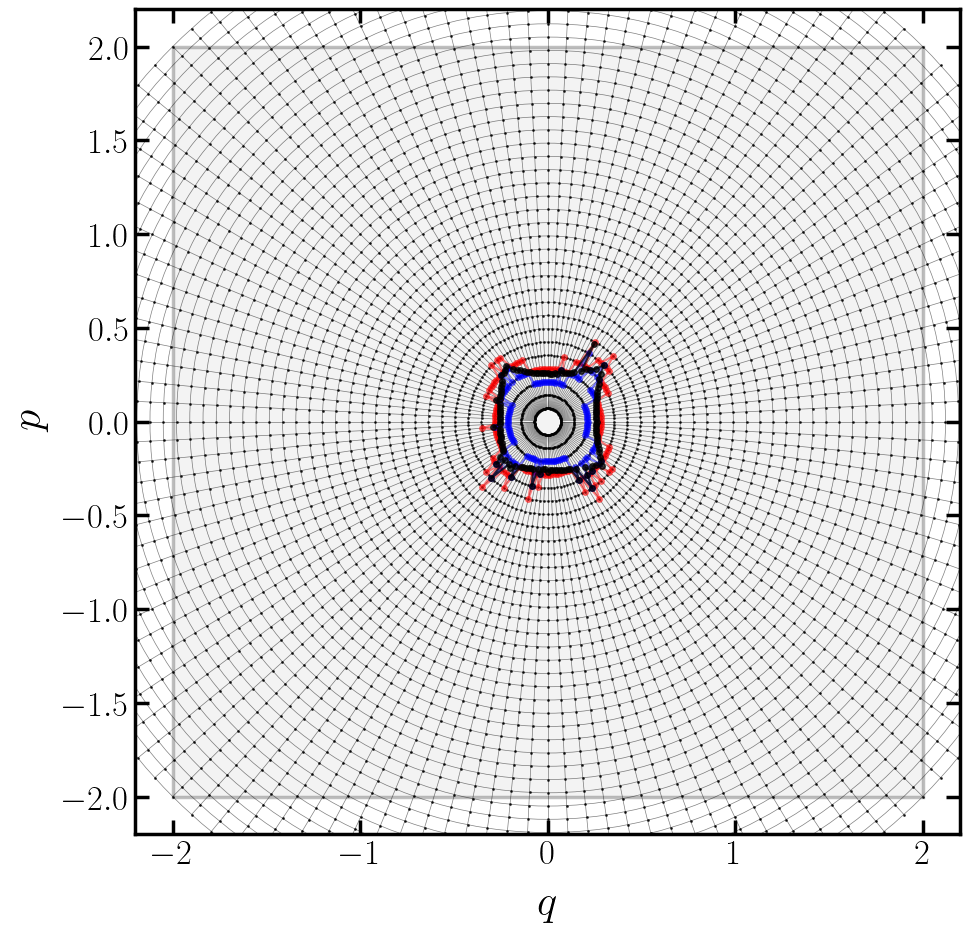

In [86]:
# Step-05: Scan

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
r = dr
while r <= 2.0 * 2**0.5:
    ax.add_patch(Circle((0.0, 0.0), radius=r, facecolor="none", edgecolor="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=2))
    r += dr
rmin = dr
rmax = 2.0 * 2**0.5
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.5, zorder=3)
points = np.array([[r * dq, r * dp] for dq, dp in ds for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=4)
ax.errorbar(*xu.T, fmt = '-', ms=4, marker="o", color="red", alpha=0.5, zorder=5)
ax.errorbar(*xs.T, fmt = '-', ms=4, marker="o", color="blue", alpha=0.5, zorder=5)
ax.errorbar(*xb.T, fmt = '-', ms=4, marker="o", color="black", alpha=0.75, zorder=5)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_05.png', dpi=dpi)
plt.show()

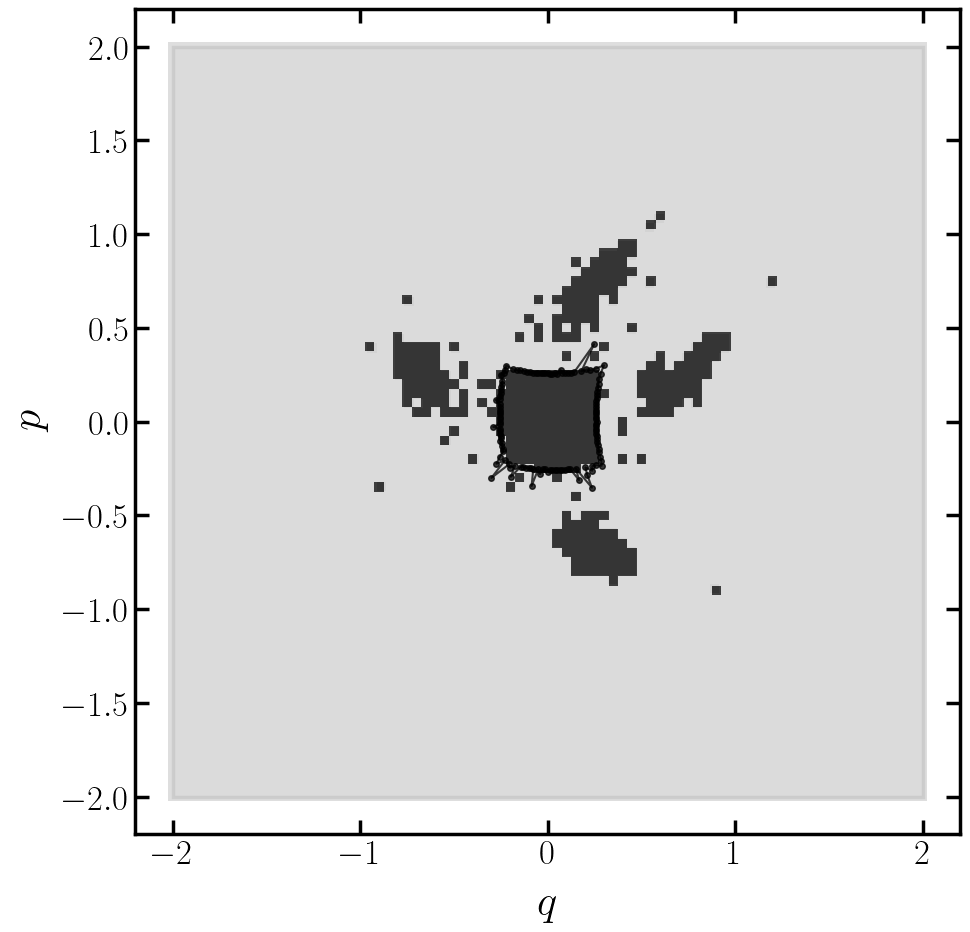

In [87]:
# Step-06: Comparison

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
cmap = ListedColormap(["white", "lightgrey"])
ax.imshow(out.reshape(int(len(out)**0.5), int(len(out)**0.5)), origin="lower", extent=(-2.0, 2.0, -2.0, 2.0), cmap=cmap, vmin=0, vmax=1, interpolation="nearest", aspect="equal", zorder=0)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=1)
ax.add_patch(domain)
for cx, cy in grid[out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
for cx, cy in grid[~out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
ax.errorbar(*xb.T, fmt = '-', ms=4, marker="o", color="black", alpha=0.75, zorder=5)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'ray_06.png', dpi=dpi)
plt.show()

## Steps: The bounding-set method (alternative knob values)

In [88]:
# Generate random initial rays

random = directions(dimension, ndirections)
random.shape

(2, 2)

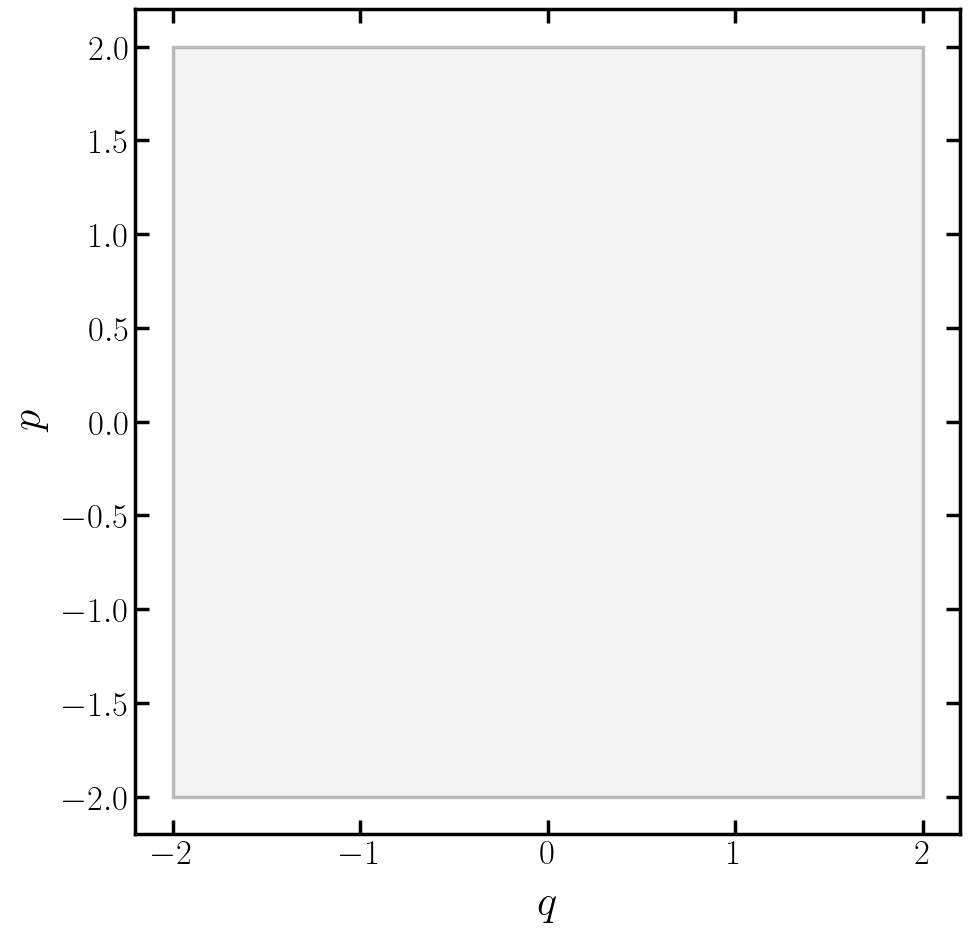

In [89]:
# Step-01: Domain

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_01.png', dpi=dpi)
plt.show()

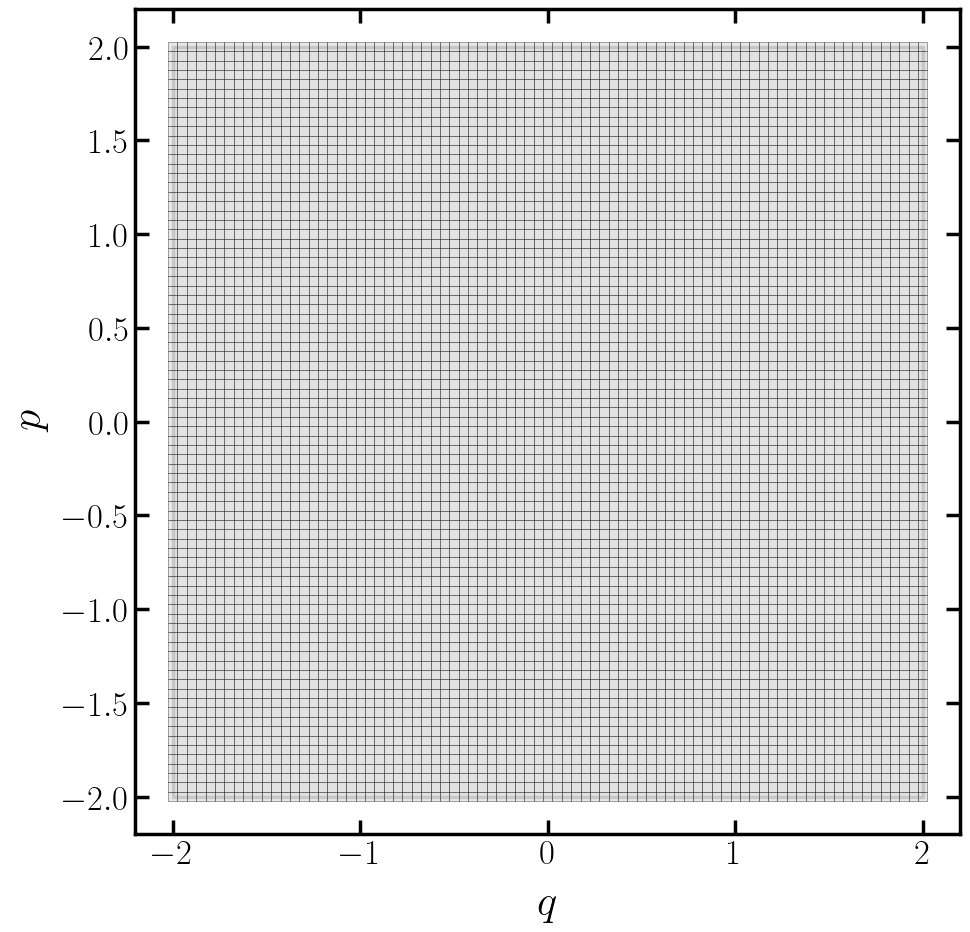

In [90]:
# Step-02: Grid

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_02.png', dpi=dpi)    
plt.show()

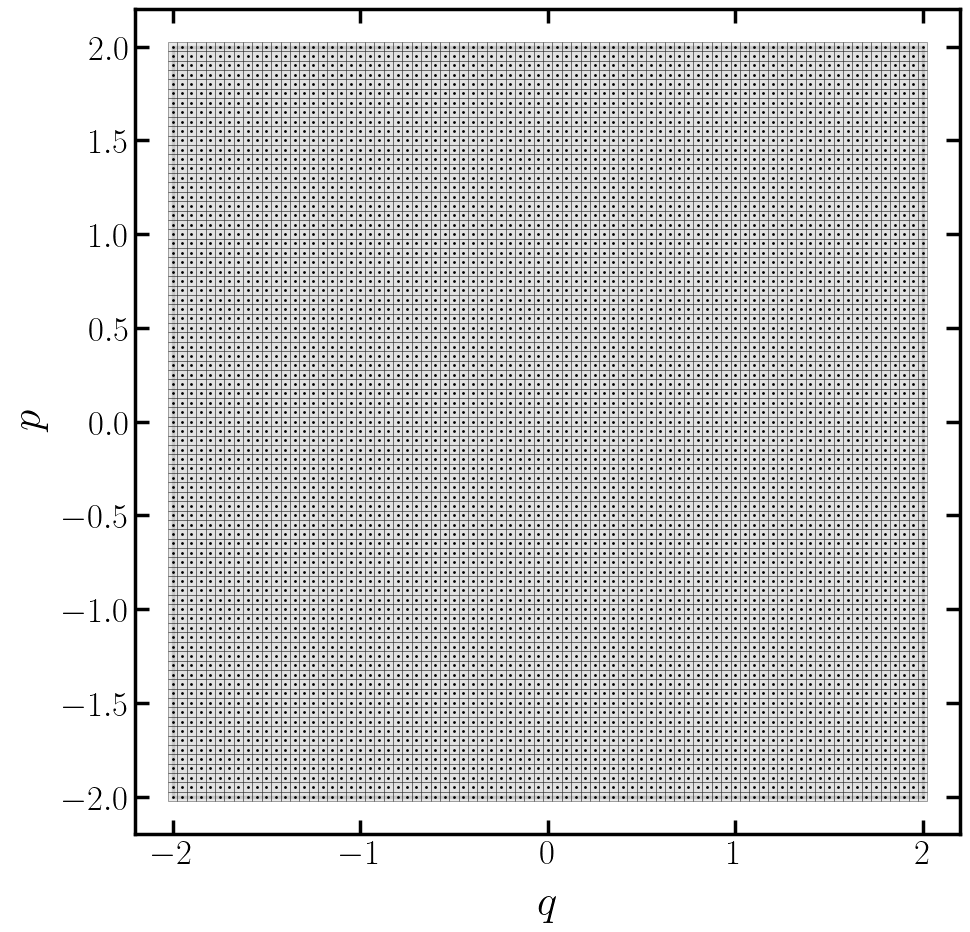

In [91]:
# Step-03: Coordinates

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
domain = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(domain)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
ax.errorbar(*grid.T, fmt=' ', marker="o", ms=1, color="black", zorder=2)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_03.png', dpi=dpi)      
plt.show()

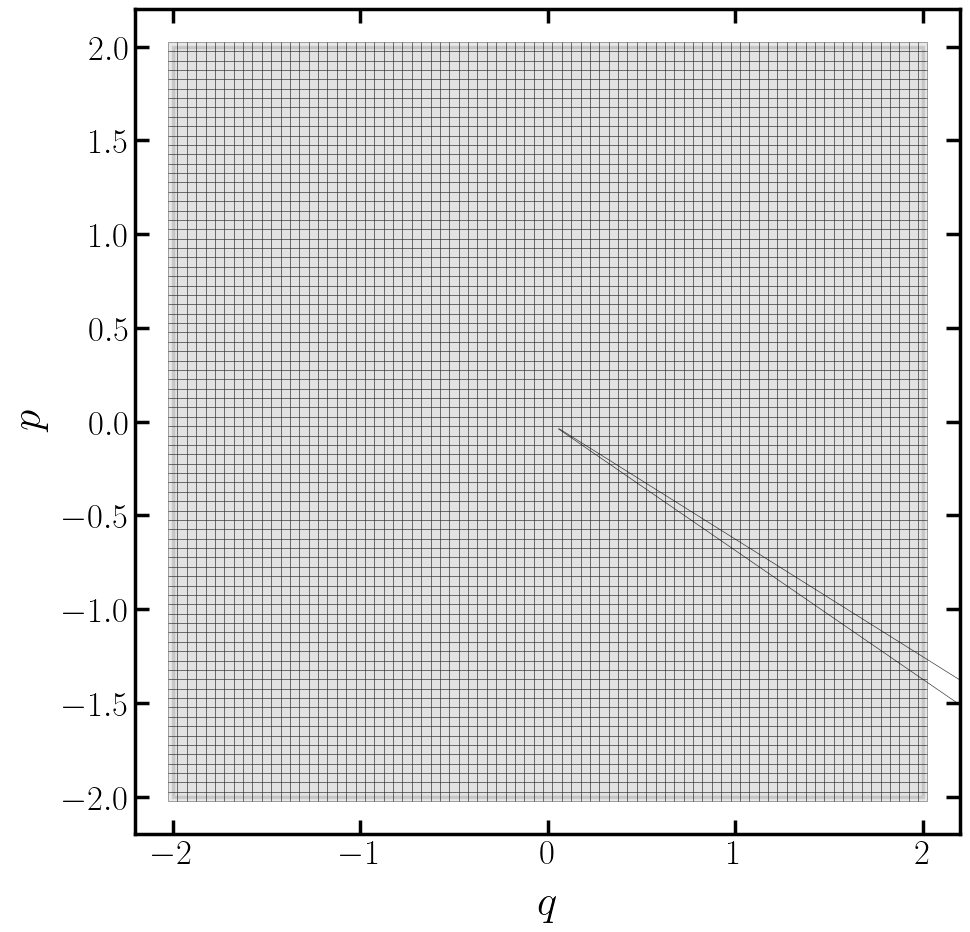

In [92]:
# Step-04: Directions

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in random:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.75, zorder=2)    
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_04.png', dpi=dpi)      
plt.show()

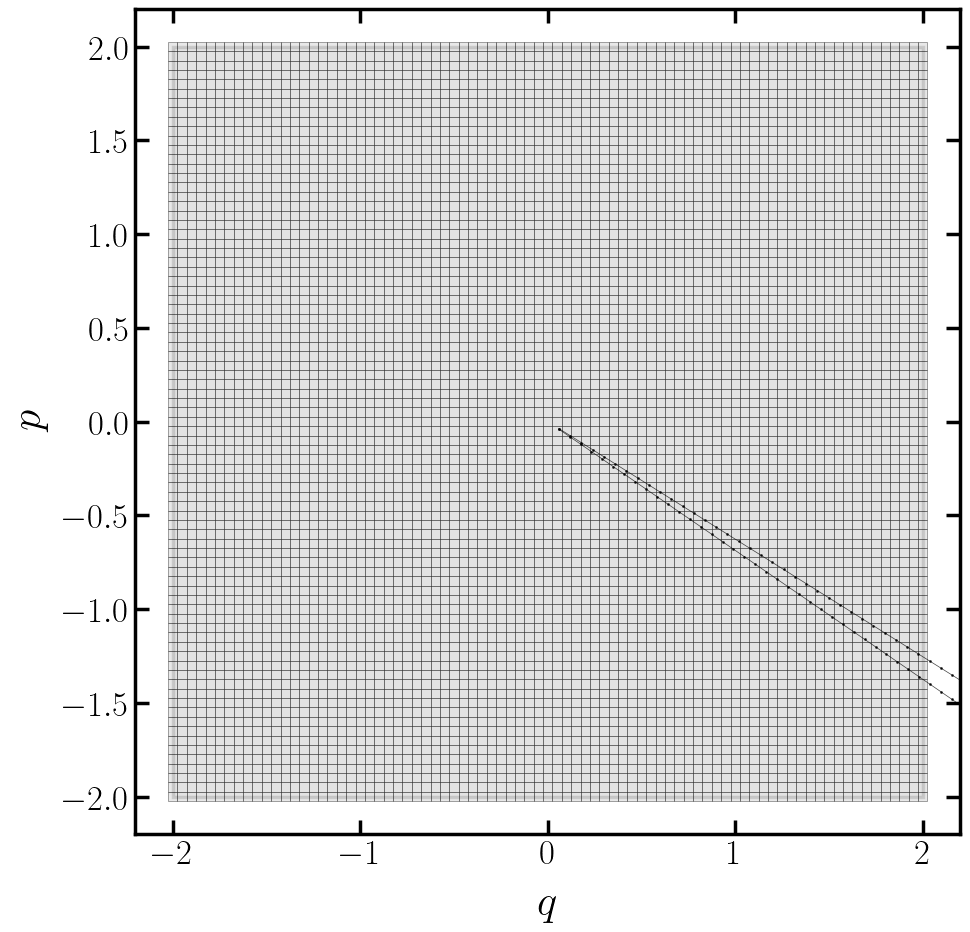

In [93]:
# Step-05: Points

from matplotlib.patches import Rectangle

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in random:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.75, zorder=2)    
points = np.array([[r * dq, r * dp] for dq, dp in random for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_05.png', dpi=dpi)      
plt.show()

In [94]:
# Compute first unstable radius along each random ray

rb, xb = da(dimension, dr, threshold, center, random, objective, knobs, unstable=True)

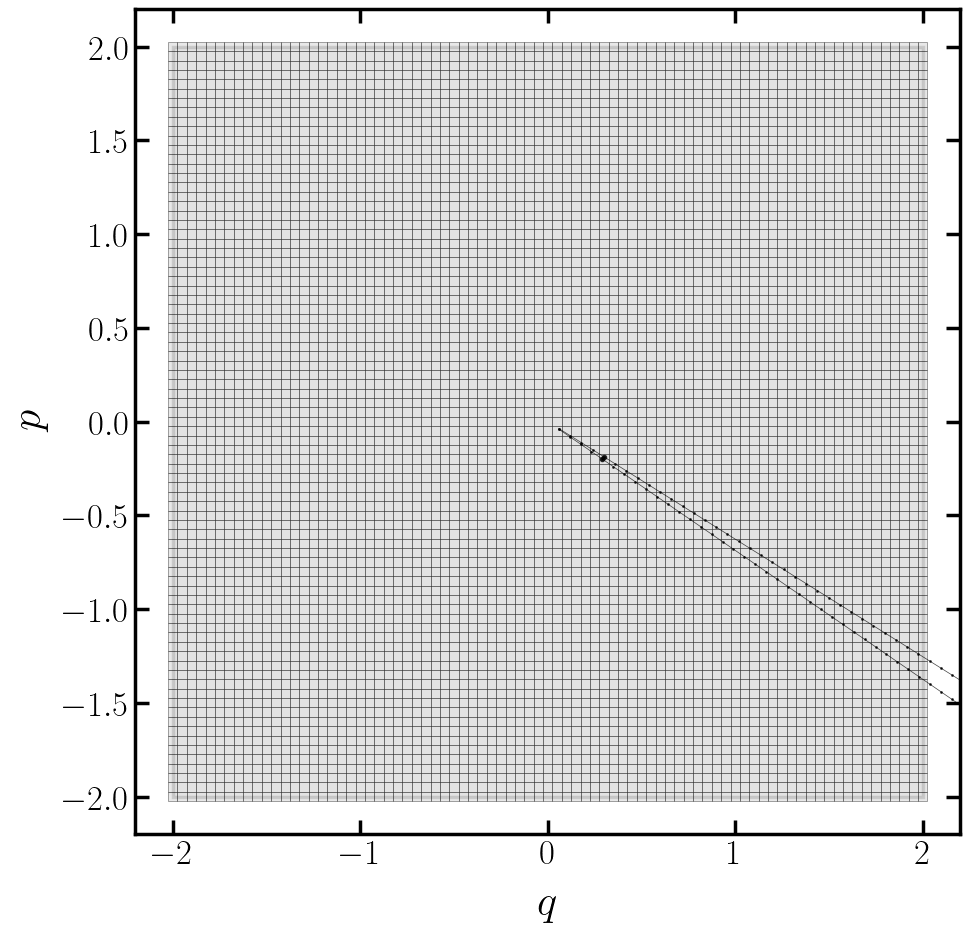

In [95]:
# Step-06: Rays

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in random:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.75, zorder=2)    
points = np.array([[r * dq, r * dp] for dq, dp in random for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.errorbar(*xb.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_06.png', dpi=dpi)      
plt.show()

In [96]:
# Compute full orbits for unstable points

orbits = np.zeros((ndirections, size, dimension), dtype=np.float64)
scan(xb, orbits, orbit(size, threshold, forward2d), knobs)
ps = filter(np.vstack(orbits), cut)

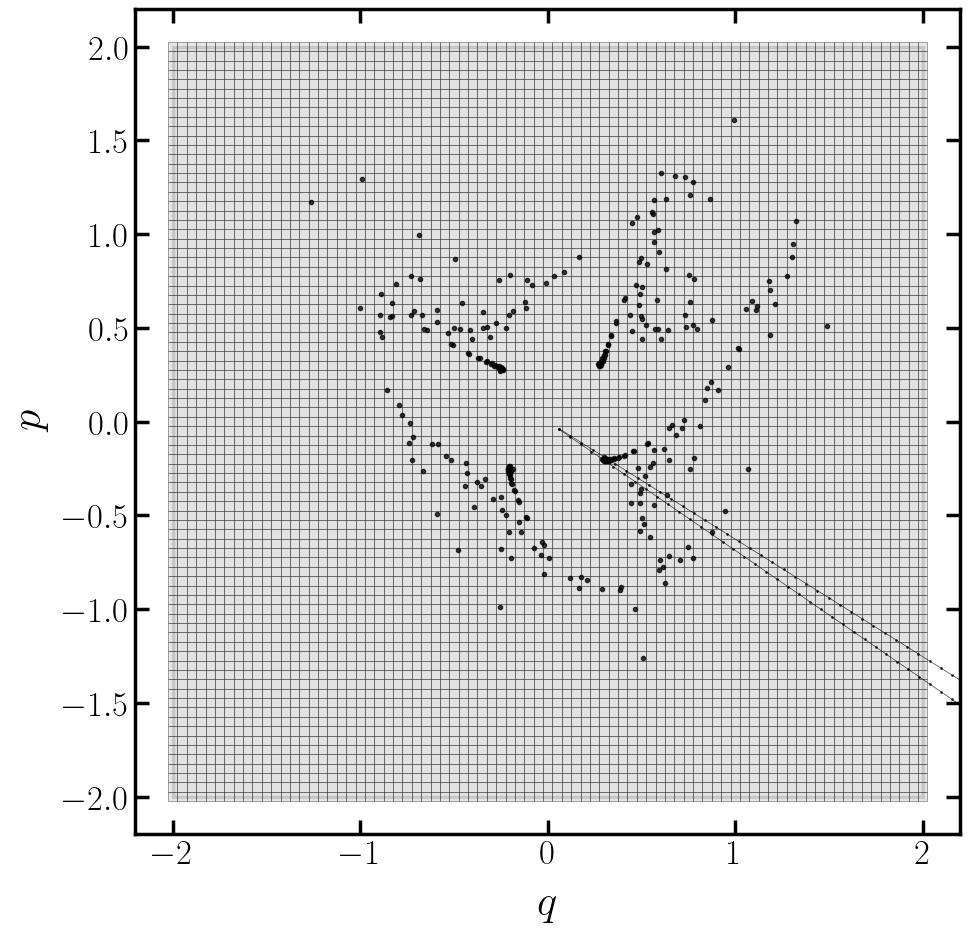

In [97]:
# Step-07: Orbits

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
rmin = dr
rmax = 2.0*2**0.5
for dq, dp in random:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.5, linestyle="-", alpha=0.75, zorder=2)    
points = np.array([[r * dq, r * dp] for dq, dp in random for r in np.arange(rmin, rmax + 0.5 * dr, dr)])
ax.errorbar(*points.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.errorbar(*xb.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=3)
ax.errorbar(*ps.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_07.png', dpi=dpi)      
plt.show()

In [98]:
# Define domain and add orbit points

domain  = Domain(lb, ub, dl)
domain.update(ps)

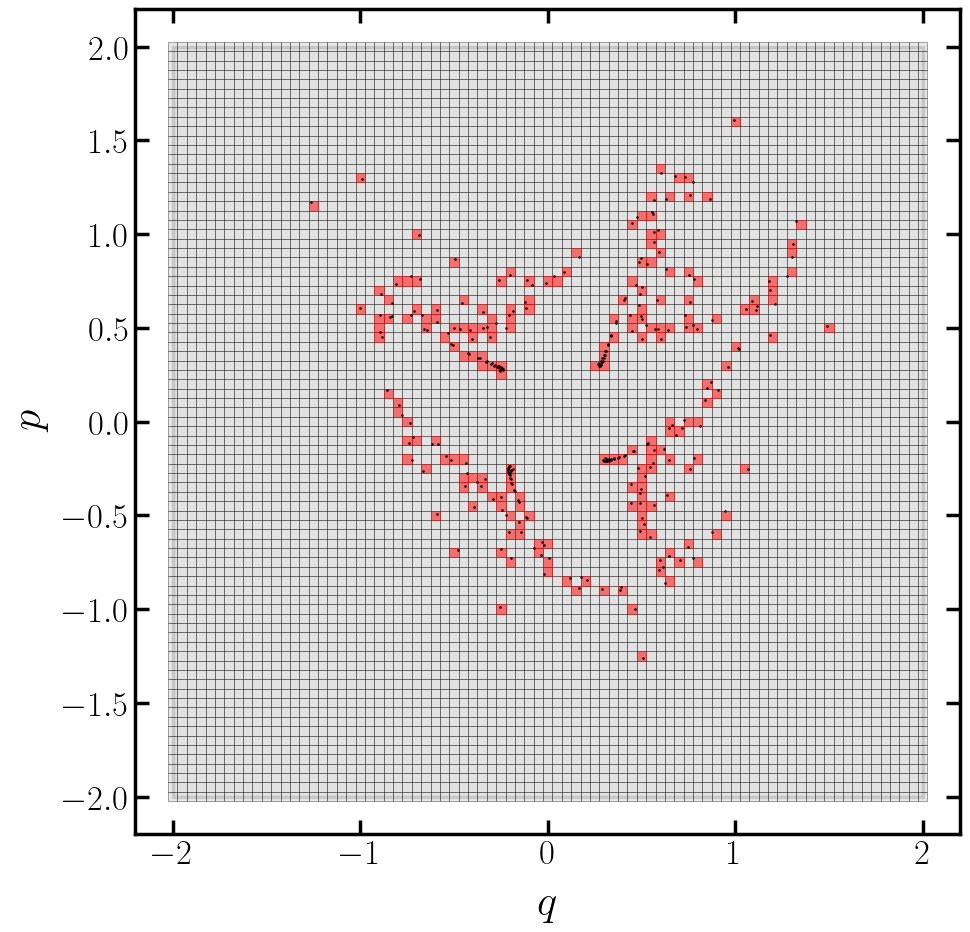

In [99]:
# Step-08: Project

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_08.png', dpi=dpi)      
plt.show()

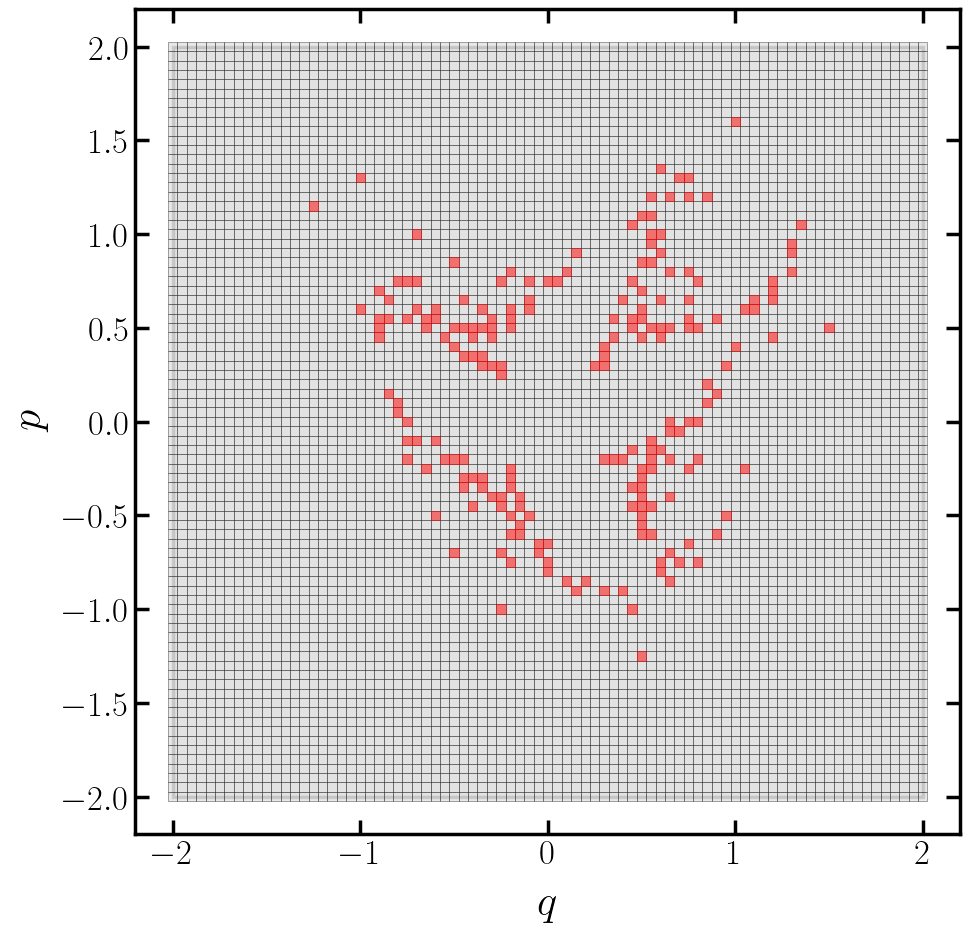

In [100]:
# Step-09: Initial

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_09.png', dpi=dpi)      
plt.show()

In [101]:
# Random samples

indices = np.random.choice(domain.list, nsamples)
samples = domain.transform(indices)
initial = sample(npoints, scale*dl, samples)

In [102]:
# Define container

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

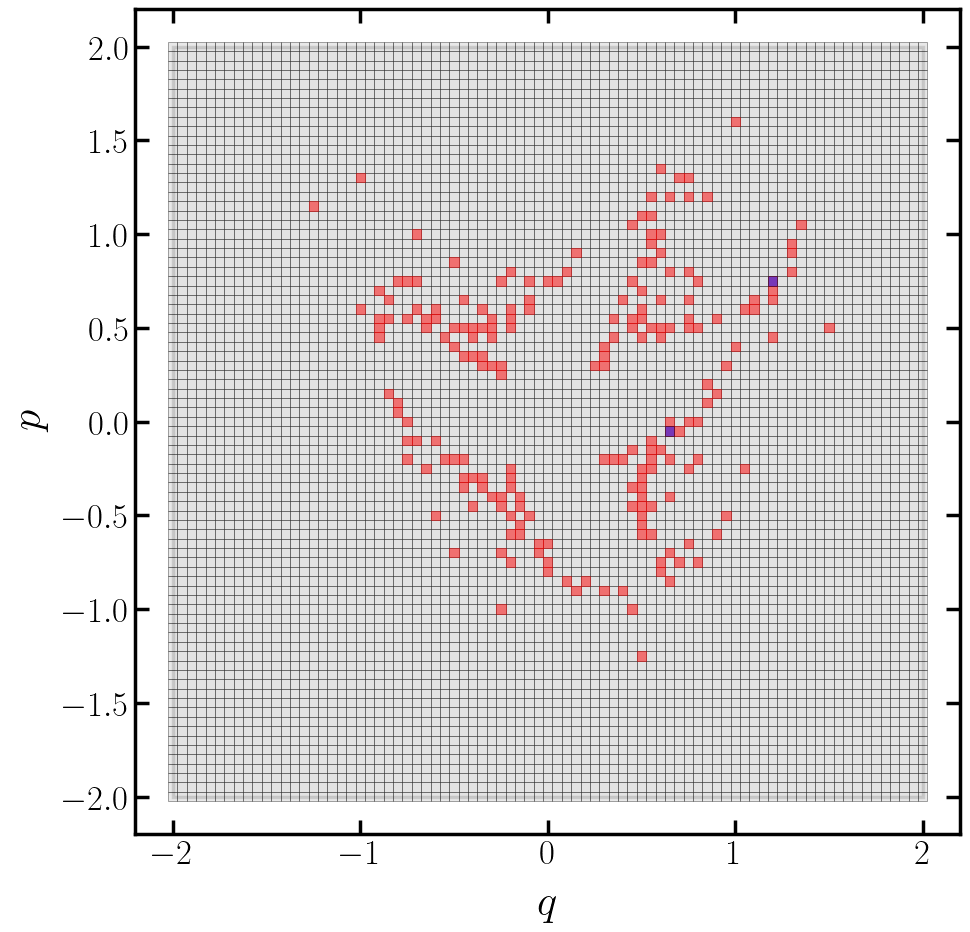

In [103]:
# Step-10: Select

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_10.png', dpi=dpi)      
plt.show()

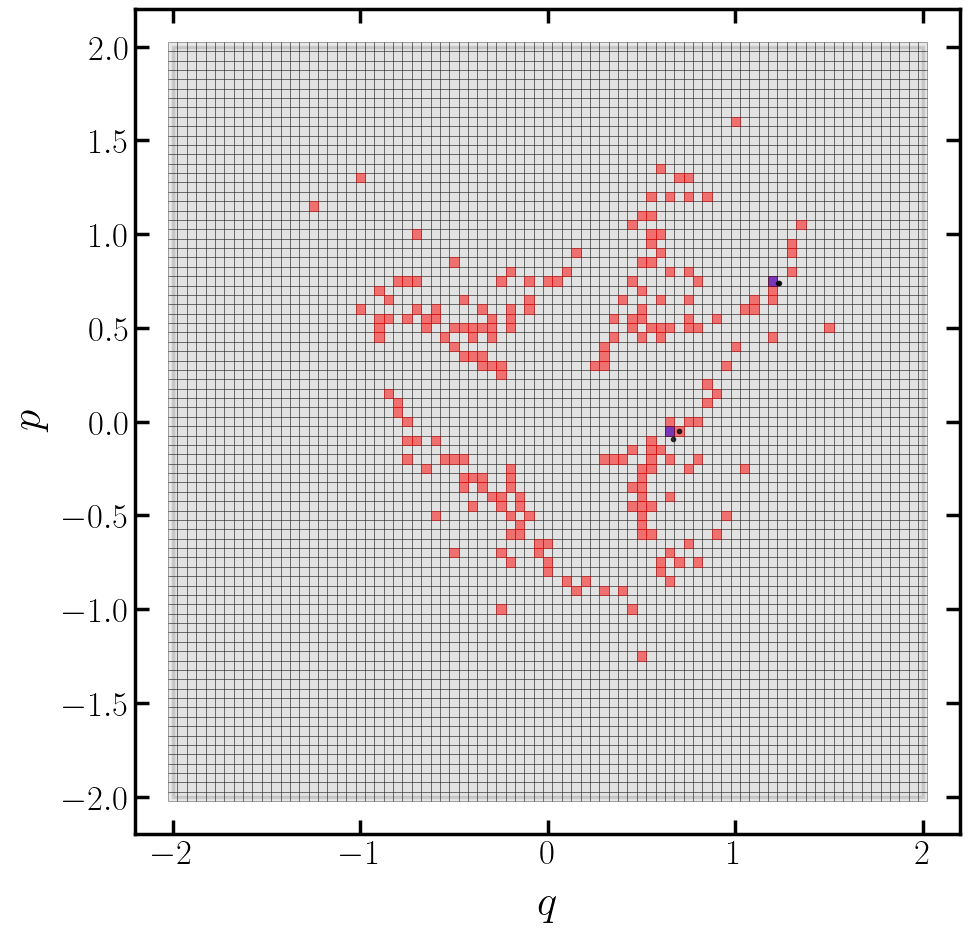

In [104]:
# Step-11: Sample

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.errorbar(*initial.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_11.png', dpi=dpi)      
plt.show()

In [105]:
# Scan (compute orbits)

scan(initial, orbits, orbit(size, threshold, forward2d), knobs)

In [106]:
# Unstable mask (should contain at least one unstalbe orbit)

unstable = np.isnan(np.sum(orbits[:, -1], axis=1))
unstable

array([ True,  True,  True,  True])

In [107]:
# Reshape and filter orbits

ps = orbits[mask(orbits, threshold)].reshape(-1, dimension)
ps = filter(ps, cut)

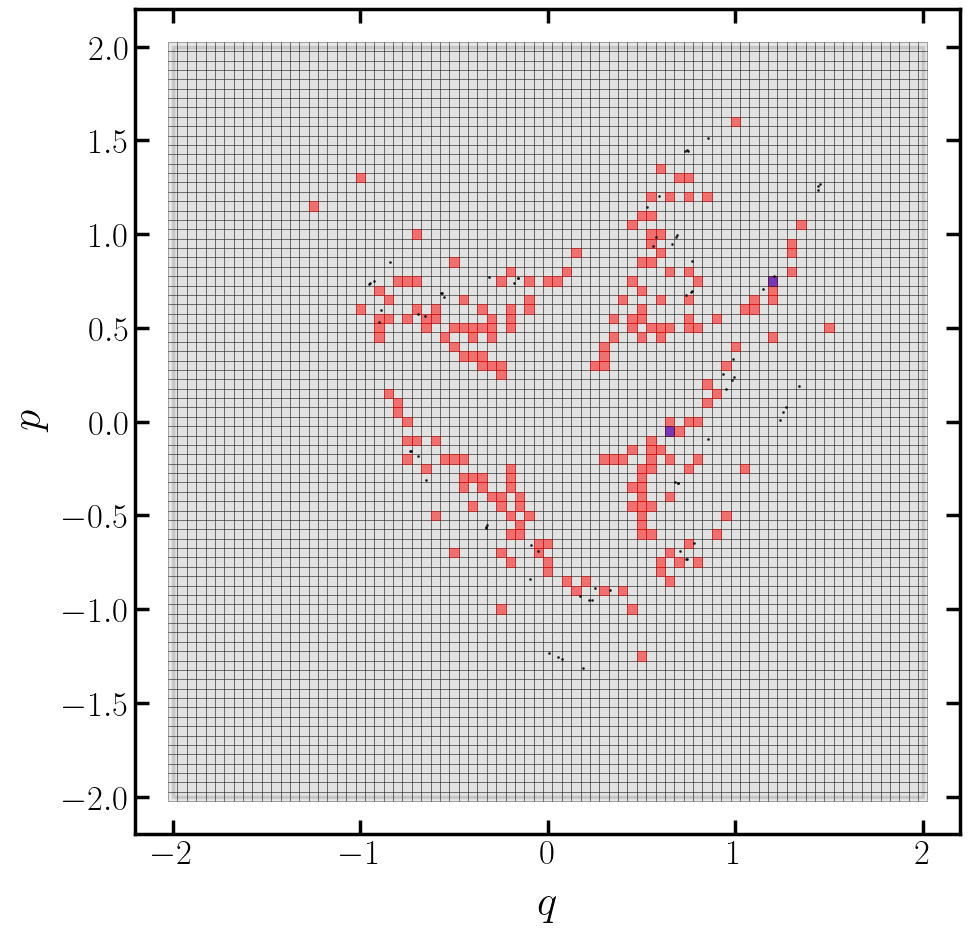

In [108]:
# Step-12: Orbits

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_12.png', dpi=dpi)      
plt.show()

In [109]:
# Update domain

domain.update(ps)

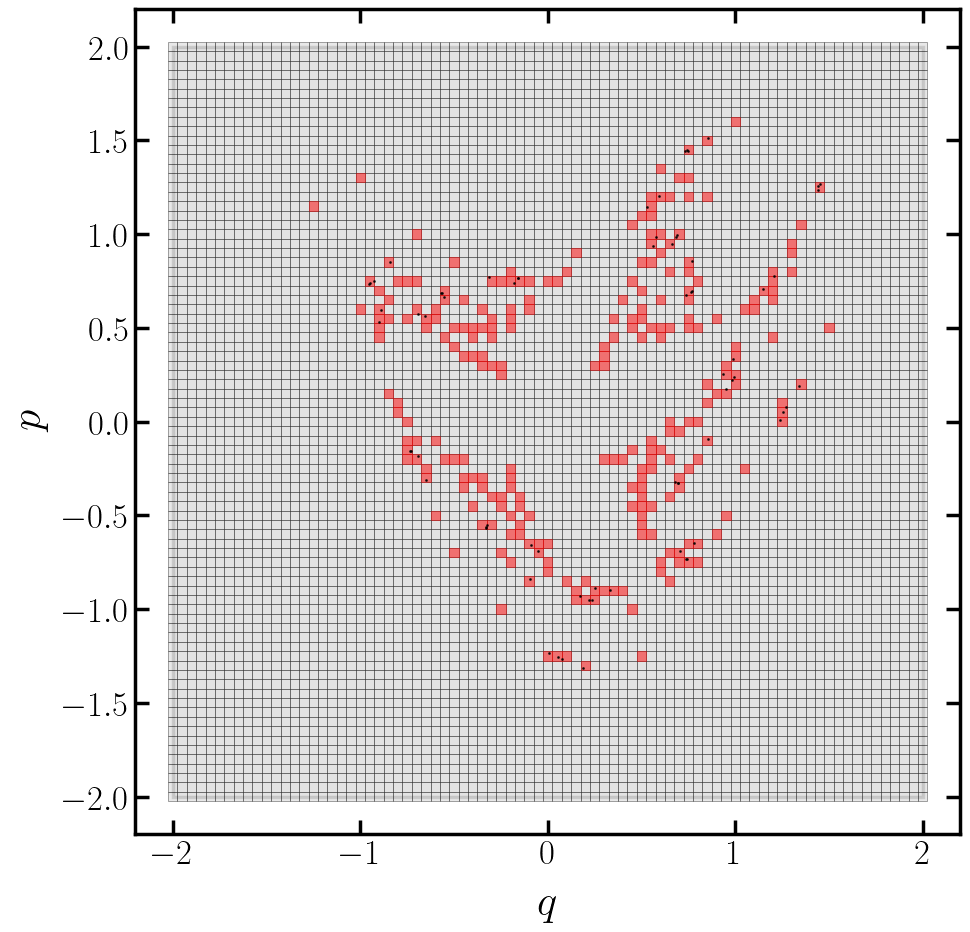

In [110]:
# Step-13: Project

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_13.png', dpi=dpi)      
plt.show()

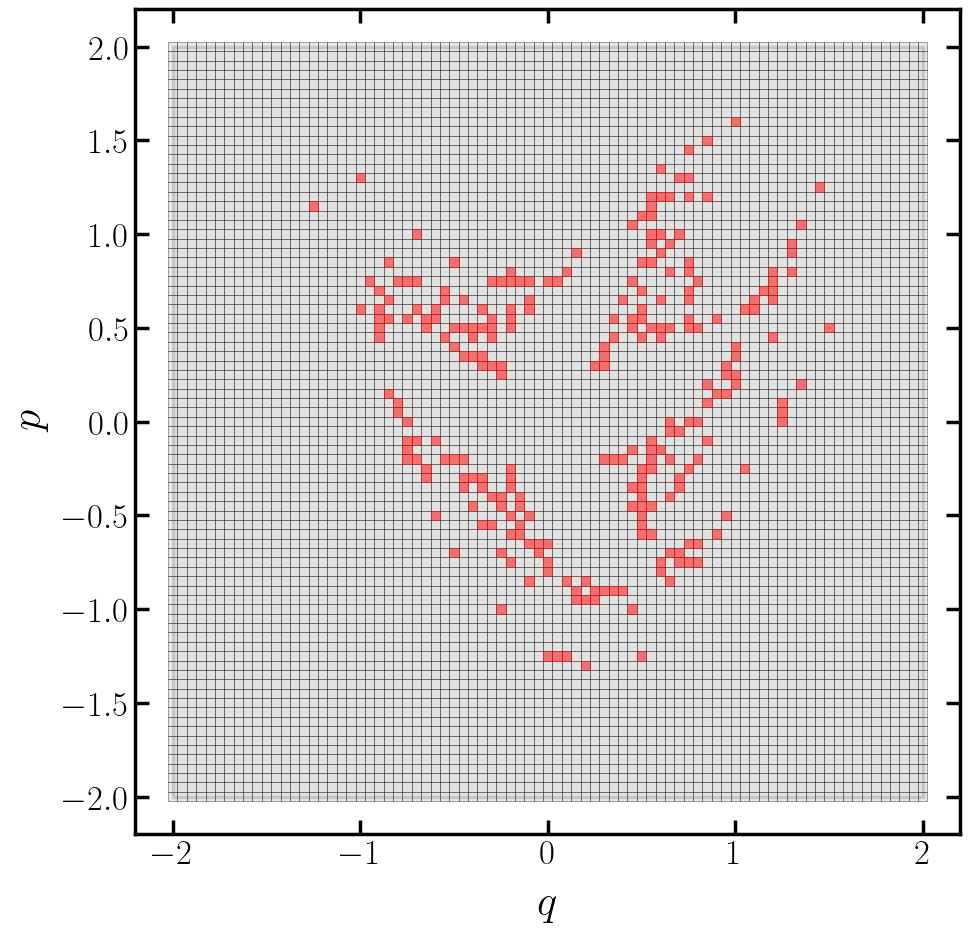

In [111]:
# Step-14: Current

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_14.png', dpi=dpi)      
plt.show()

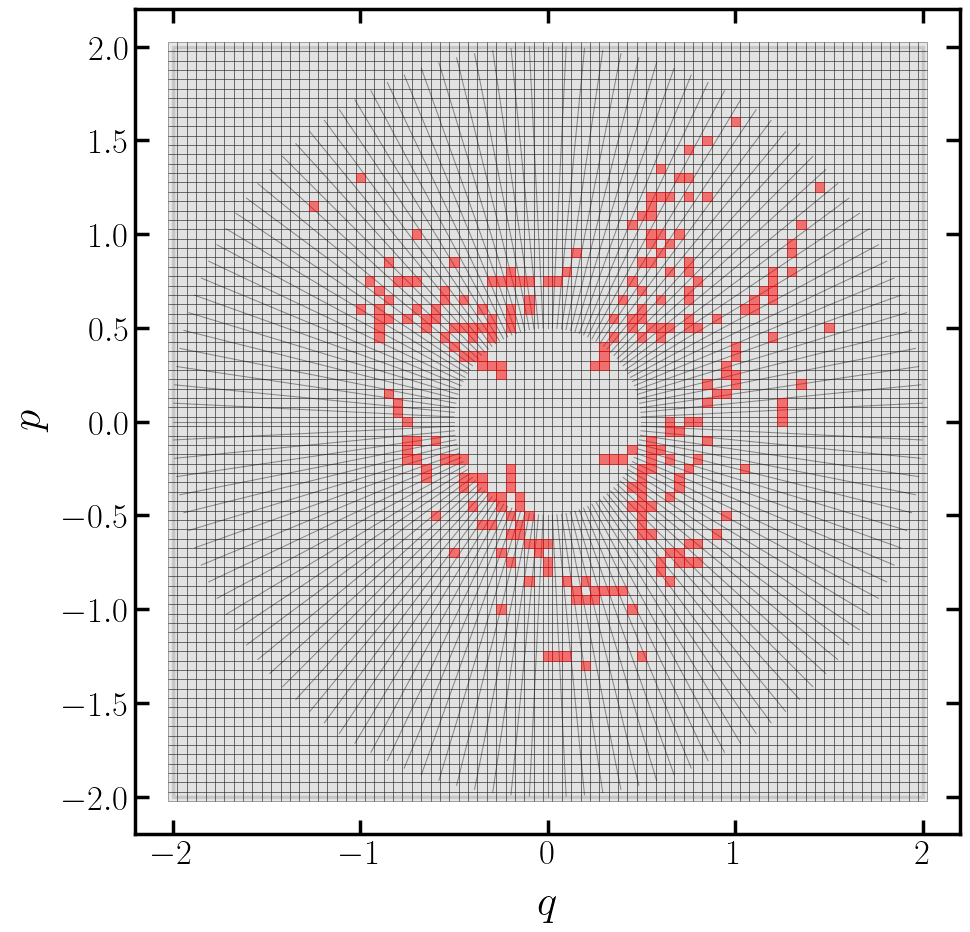

In [112]:
# Step-15: Directions

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
rmin = 0.5
rmax = 2.0
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.75, linestyle="-", alpha=0.75, zorder=1)  
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=3))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_15.png', dpi=dpi)      
plt.show()

In [113]:
keys, *_  = domain.boundary(*(128, 128), center, ds)
flag = np.sum(keys == -1)
flag

np.int64(14)

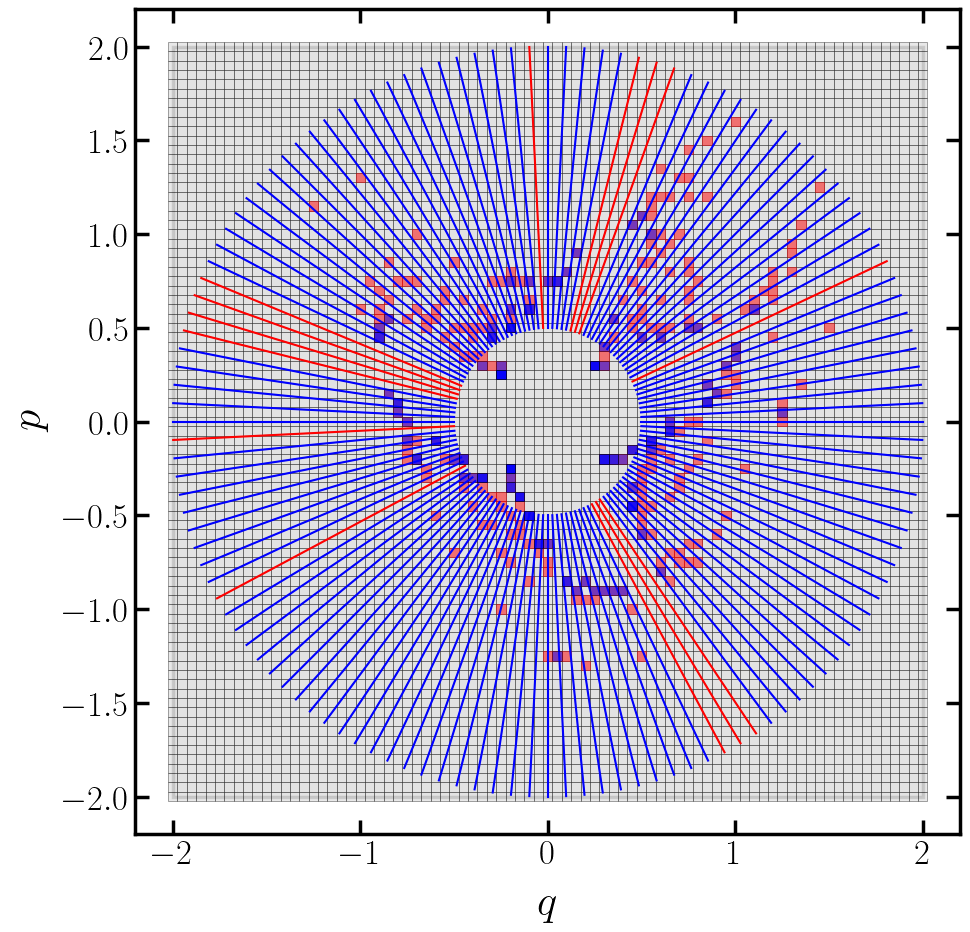

In [114]:
# Step-16: Activation

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
rmin = 0.5
rmax = 2.0
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.75, linestyle="-", alpha=0.75, zorder=1)  
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=3))
for (dq, dp), key in zip(ds, keys):
    if key == -1:
        ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="red", linewidth=1.5, linestyle="-", alpha=1, zorder=3) 
        continue
    (cx, cy), *_ = domain.transform(np.array([key]))
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="blue", linewidth=1.5, linestyle="-", alpha=1, zorder=4) 
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=4))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_16.png', dpi=dpi)      
plt.show()

In [115]:
# Keep only the inner shell

domain = Domain(lb, ub, dl)
domain.insert(keys[keys!=-1])

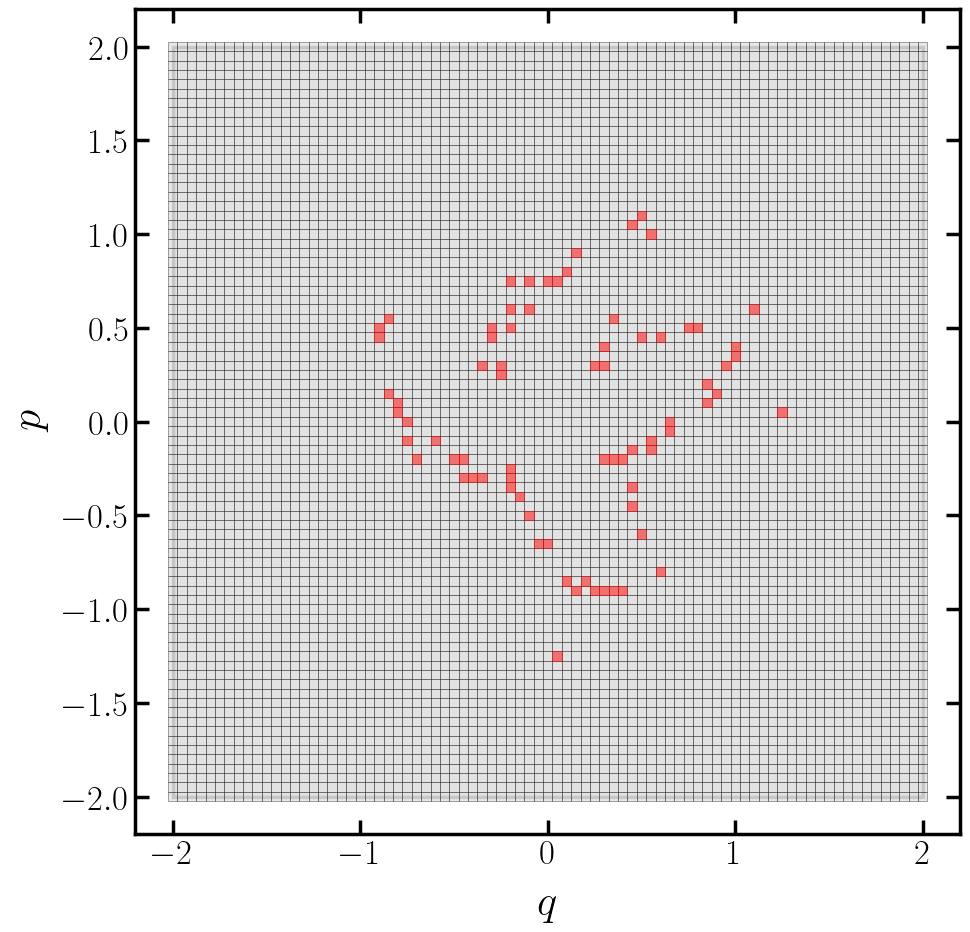

In [116]:
# Step-17: Current

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_17.png', dpi=dpi)      
plt.show()

In [117]:
# Random samples

indices = np.random.choice(domain.list, nsamples)
samples = domain.transform(indices)
initial = sample(npoints, scale*dl, samples)

In [118]:
# Define container

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

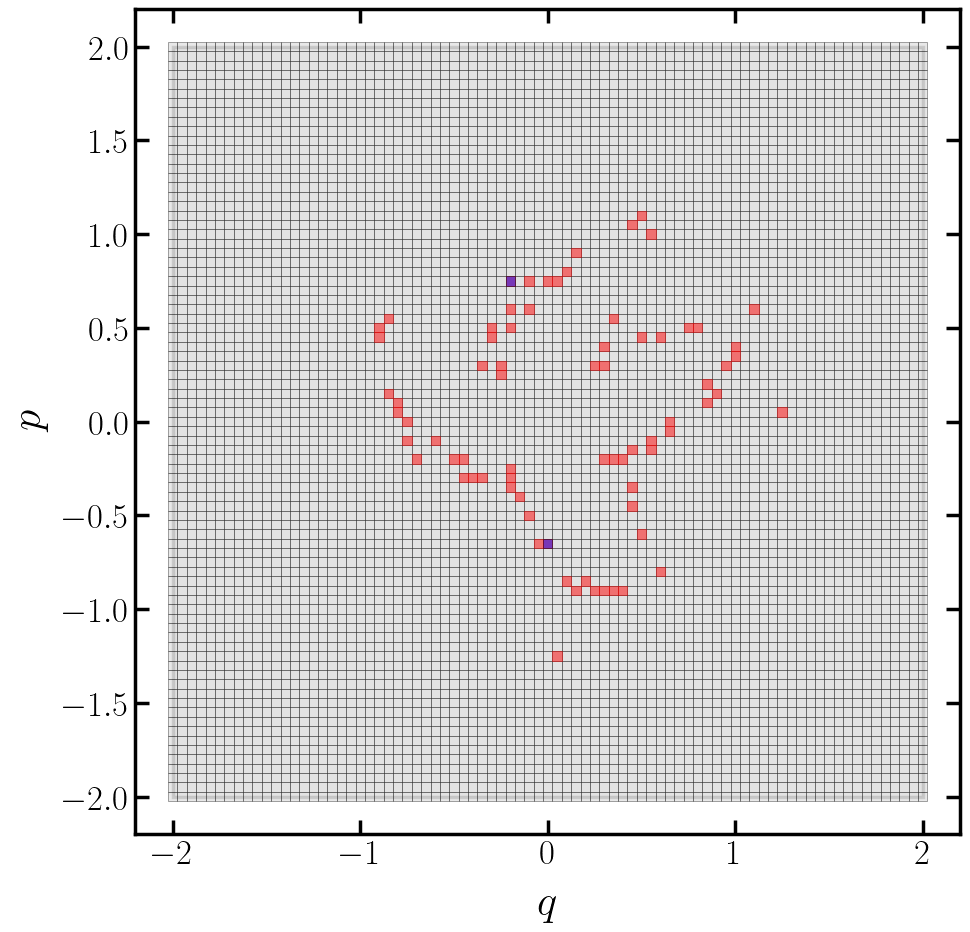

In [119]:
# Step-18: Select

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_18.png', dpi=dpi)      
plt.show()

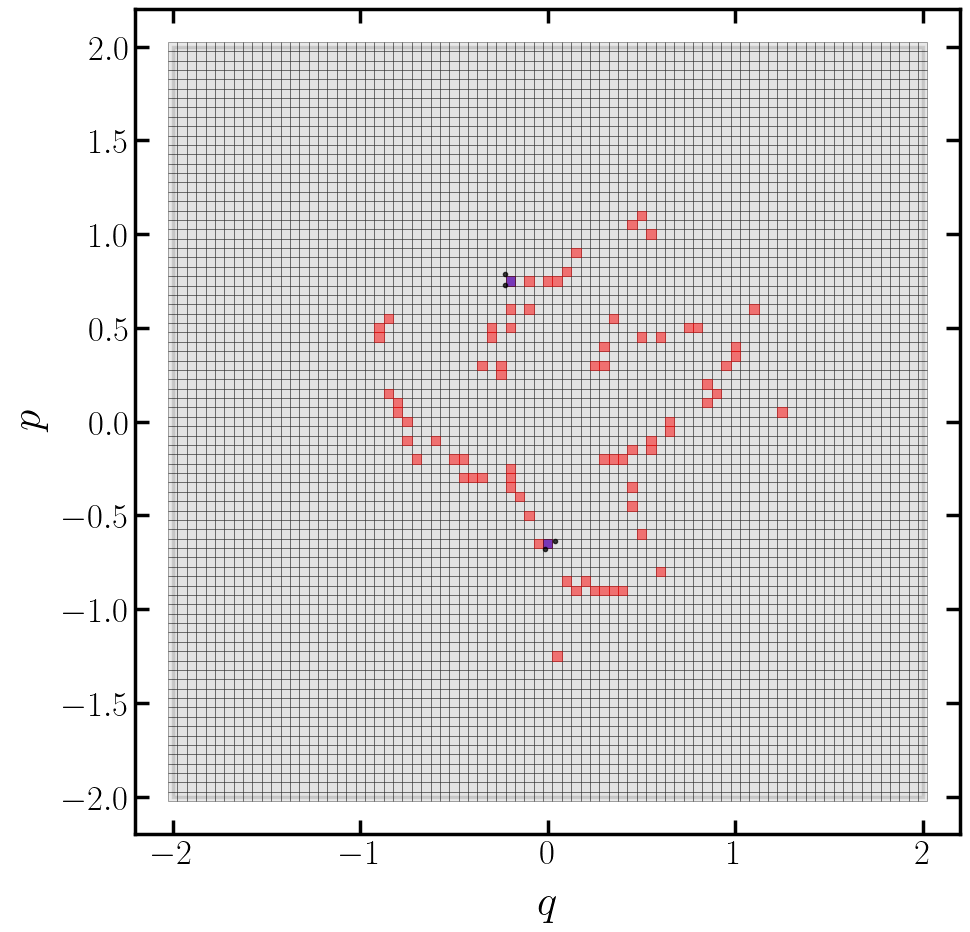

In [120]:
# Step-19: Sample

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.errorbar(*initial.T, fmt = ' ', ms=3, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_19.png', dpi=dpi)      
plt.show()

In [121]:
# Scan (compute orbits)

scan(initial, orbits, orbit(size, threshold, forward2d), knobs)

In [122]:
# Unstable mask (should contain at least one unstalbe orbit)

unstable = np.isnan(np.sum(orbits[:, -1], axis=1))
unstable

array([ True,  True,  True,  True])

In [123]:
# Reshape and filter orbits

ps = orbits[mask(orbits, threshold)].reshape(-1, dimension)
ps = filter(ps, cut)

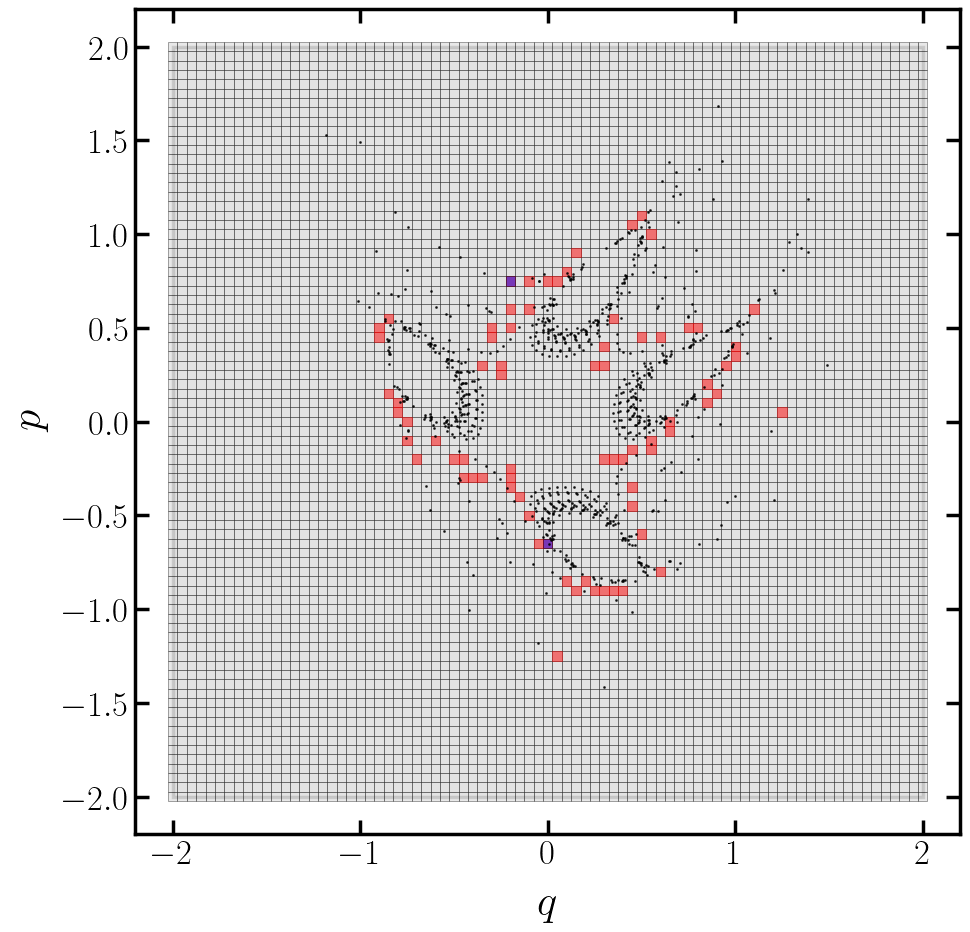

In [124]:
# Step-20: Orbits

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in samples:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=4)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_20.png', dpi=dpi)      
plt.show()

In [125]:
# Update domain

domain.update(ps)

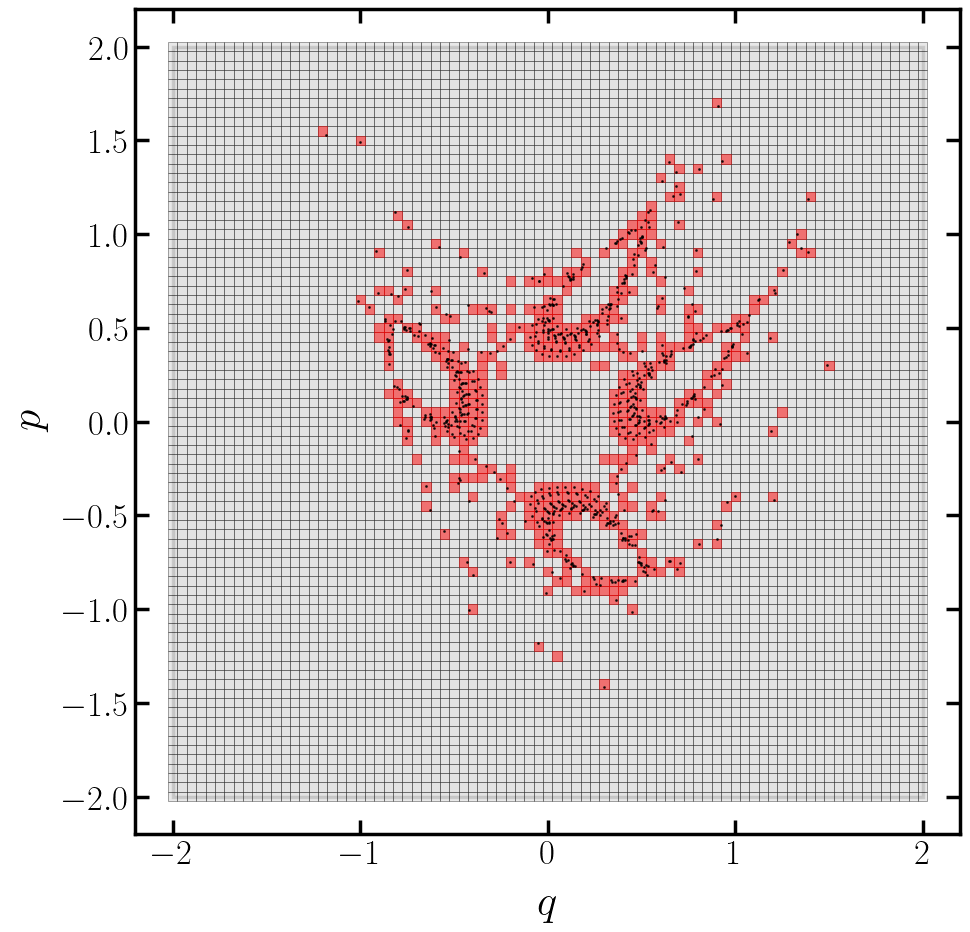

In [126]:
# Step-21: Project

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.errorbar(*ps.T, fmt = ' ', ms=1, marker="o", color="black", alpha=0.75, zorder=3)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_21.png', dpi=dpi)      
plt.show()

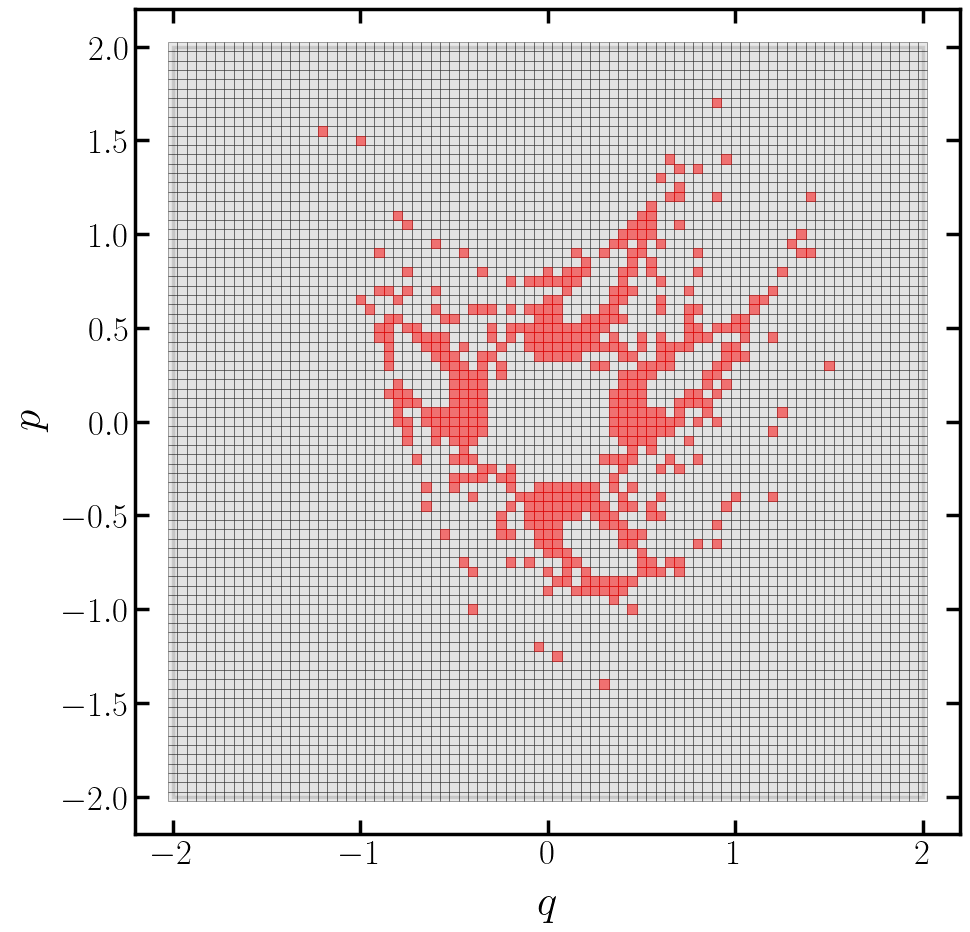

In [127]:
# Step-22: Current

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_22.png', dpi=dpi)      
plt.show()

In [128]:
keys, *_  = domain.boundary(*(128, 128), center, ds)
flag = np.sum(keys == -1)
flag

np.int64(0)

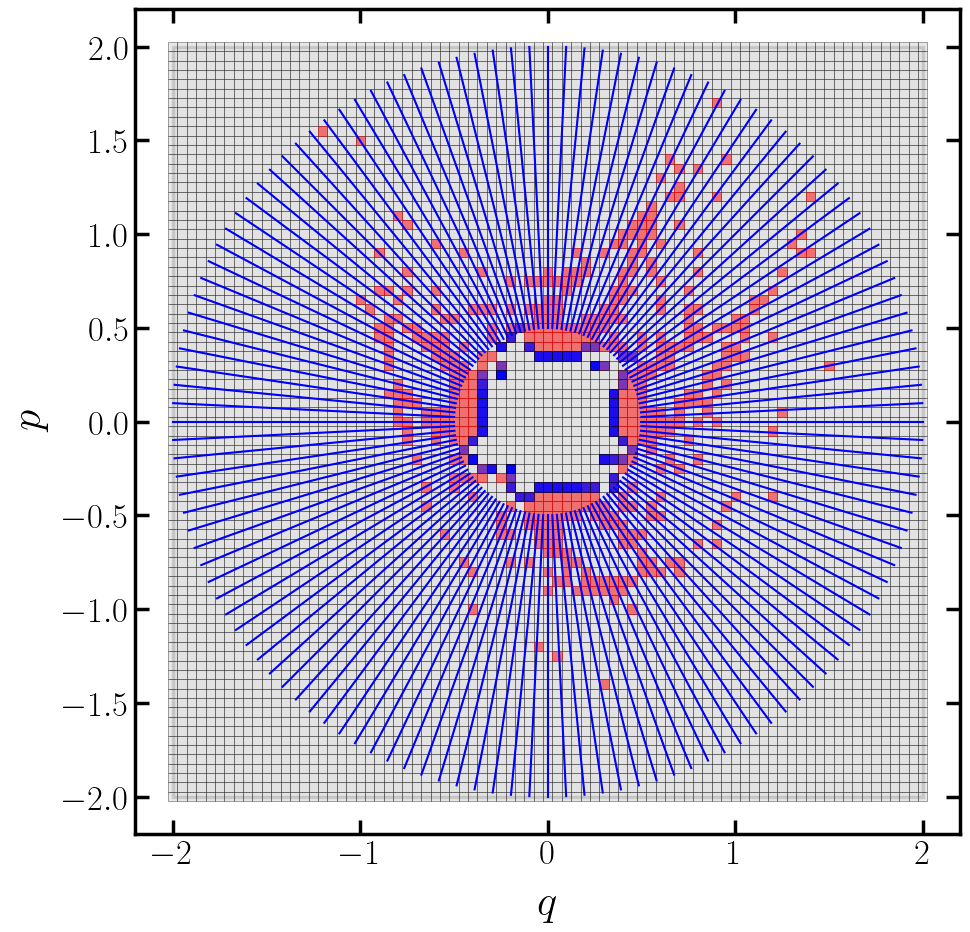

In [129]:
# Step-23: Activation

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
rmin = 0.5
rmax = 2.0
for dq, dp in ds:
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="black", linewidth=0.75, linestyle="-", alpha=0.75, zorder=1)  
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=2))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=3))
for (dq, dp), key in zip(ds, keys):
    if key == -1:
        ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="red", linewidth=1.5, linestyle="-", alpha=1, zorder=3) 
        continue
    (cx, cy), *_ = domain.transform(np.array([key]))
    ax.plot([rmin * dq, rmax * dq], [rmin * dp, rmax * dp], color="blue", linewidth=1.5, linestyle="-", alpha=1, zorder=4) 
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=4))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_23.png', dpi=dpi)      
plt.show()

In [130]:
# Keep only the inner shell

domain = Domain(lb, ub, dl)
domain.insert(keys[keys!=-1])

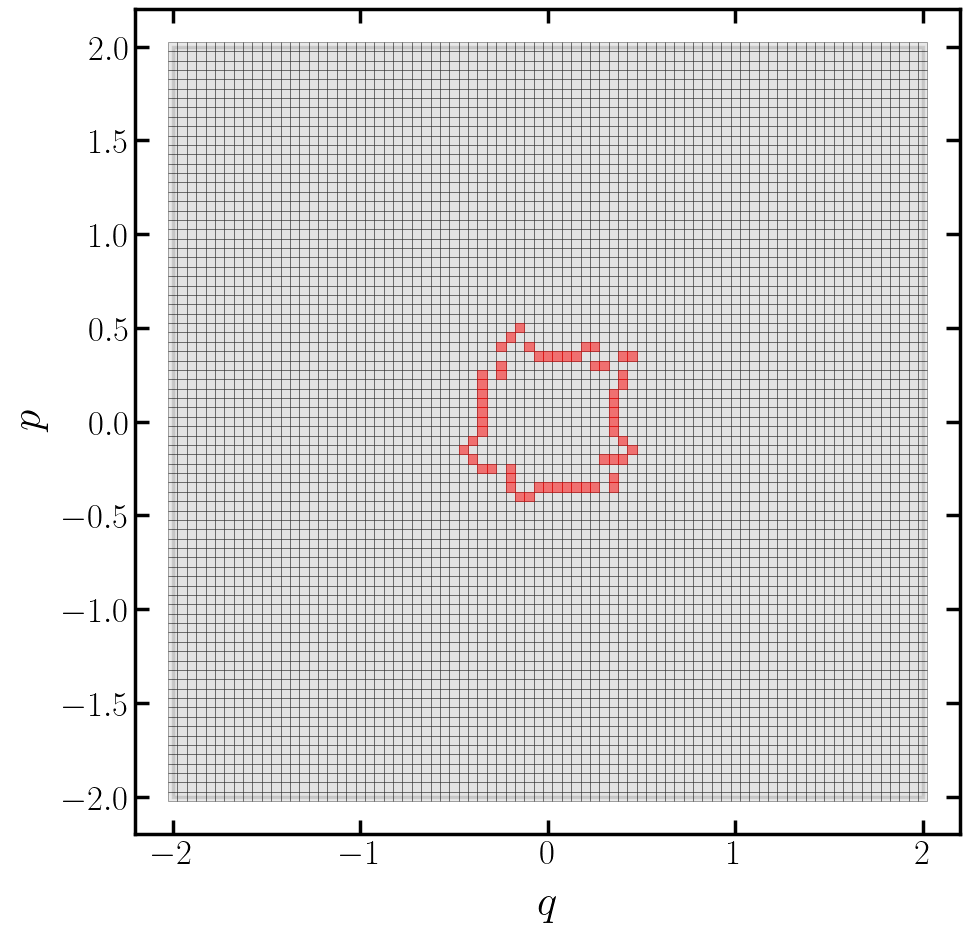

In [131]:
# Step-24: Current

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.5, zorder=2))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_24.png', dpi=dpi)      
plt.show()

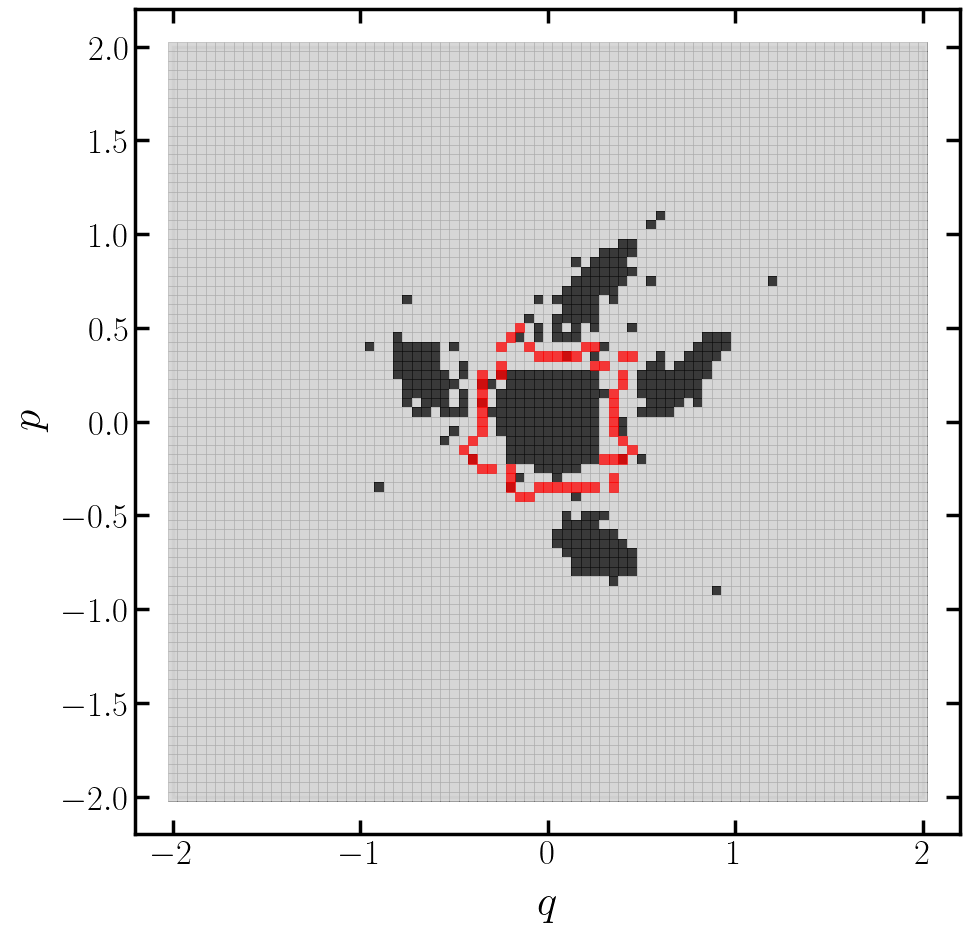

In [132]:
# Step-25: Comparison

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in grid[out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
for cx, cy in grid[~out]:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="none", linewidth=0.5, alpha=0.75, zorder=2))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="red", linewidth=0.5, alpha=0.75, zorder=3))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_25.png', dpi=dpi)
plt.show()

In [133]:
# Grow the domain (forward)

domain_forward = Domain(lb, ub, dl)
domain_forward.insert(domain.keys)

domain_forward_box = []
local = Domain(lb, ub, dl)
local.insert(domain_forward.keys)
domain_forward_box.append(local)

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

for epoch in range(32):
    indices = np.random.choice(domain_forward.list, nsamples)
    centers = domain_forward.transform(indices)
    initial = sample(npoints, scale*dl, centers)
    scan(initial, orbits, orbit(size, threshold, forward2d), knobs)
    points = orbits[mask(orbits, threshold)].reshape(-1, dimension)
    points = filter(points, threshold)
    domain_forward.update(points)
    local = Domain(lb, ub, dl)
    local.insert(domain_forward.keys)
    domain_forward_box.append(local)
    print(f'{epoch + 1:02d}', f'{domain_forward.size:12d}')
    if domain_forward.size > 128_000_000:
        break

01          593
02          764
03          861
04          884
05          926
06          967
07         1016
08         1036
09         1047
10         1083
11         1084
12         1103
13         1143
14         1158
15         1164
16         1175
17         1184
18         1216
19         1255
20         1282
21         1282
22         1292
23         1308
24         1311
25         1315
26         1320
27         1331
28         1339
29         1342
30         1347
31         1352
32         1383


In [134]:
# Grow the domain (inverse)

domain_inverse = Domain(lb, ub, dl)
domain_inverse.insert(domain.keys)

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

domain_inverse_box = []
local = Domain(lb, ub, dl)
local.insert(domain_inverse.keys)
domain_inverse_box.append(local)

for epoch in range(32):
    indices = np.random.choice(domain_inverse.list, nsamples)
    centers = domain_inverse.transform(indices)
    initial = sample(npoints, scale*dl, centers)
    scan(initial, orbits, orbit(size, threshold, inverse2d), knobs)
    points = orbits[mask(orbits, threshold)].reshape(-1, dimension)
    points = filter(points, threshold)
    domain_inverse.update(points)
    local = Domain(lb, ub, dl)
    local.insert(domain_inverse.keys)
    domain_inverse_box.append(local)    
    print(f'{epoch + 1:02d}', f'{domain_inverse.size:12d}')
    if domain_inverse.size > 128_000_000:
        break

01          754
02          825
03          911
04         1017
05         1027
06         1081
07         1123
08         1159
09         1192
10         1222
11         1240
12         1257
13         1279
14         1295
15         1303
16         1310
17         1315
18         1330
19         1344
20         1349
21         1369
22         1374
23         1384
24         1393
25         1405
26         1412
27         1414
28         1421
29         1427
30         1438
31         1448
32         1451


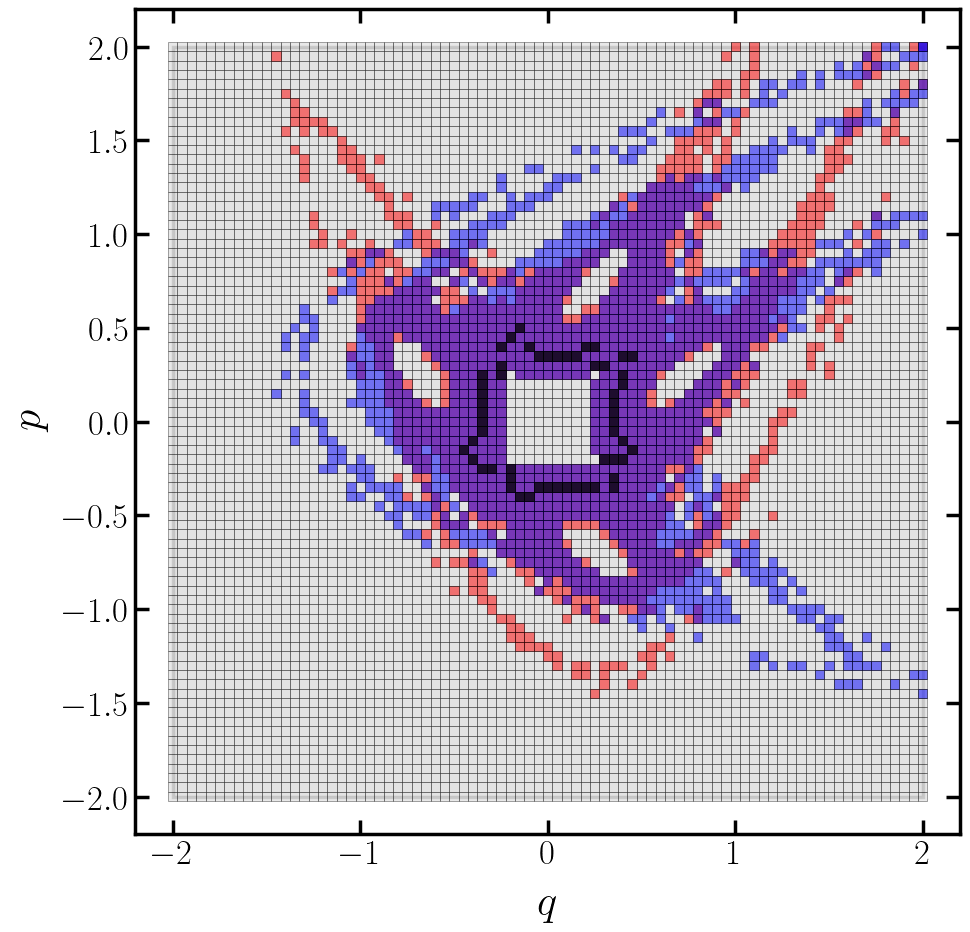

In [135]:
# Step-26: Growth

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain_forward.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain_inverse.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="black", linewidth=0.5, alpha=0.75, zorder=5))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_26.png', dpi=dpi)
plt.show()

In [136]:
domain_final = Domain(lb, ub, dl)
domain_final.insert(domain_forward.keys)
domain_final.insert(domain_inverse.keys)

In [137]:
keys, *_  = domain_final.boundary(*(128, 128), center, ds)
flag = np.sum(key == -1)
flag

np.int64(0)

In [138]:
domain_final = Domain(lb, ub, dl)
domain_final.insert(keys[keys!=-1])

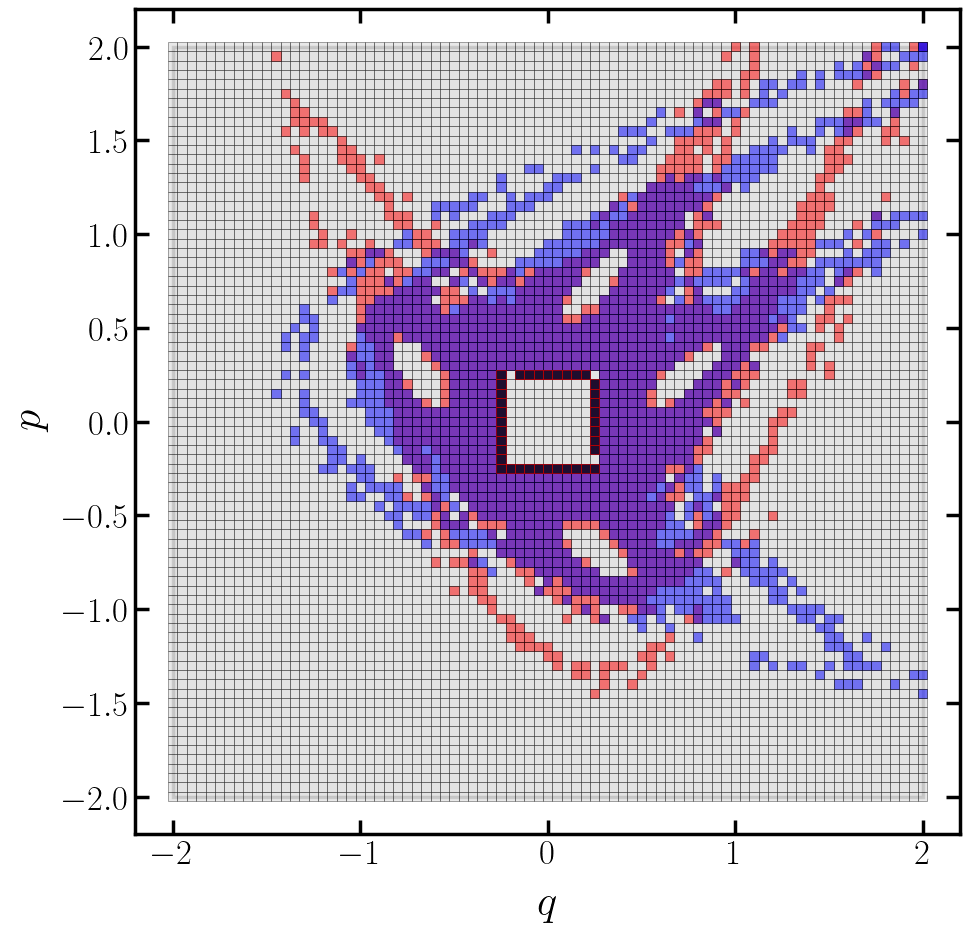

In [139]:
# Step-27: Updated

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain_forward.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain_inverse.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain_final.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="red", linewidth=0.5, alpha=0.75, zorder=5))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_27.png', dpi=dpi)
plt.show()

In [140]:
domain_island = Domain(lb, ub, dl)
domain_island.insert(domain_forward.keys)
domain_island.insert(domain_inverse.keys)
domain_island.size

1877

In [141]:
point = np.array([-0.725, 0.25])
print(objective(point, knobs))

keys, *_  = domain_island.boundary(*(128, 128), point, ds)
flag = np.sum(keys == -1)
flag

True


np.int64(0)

In [142]:
domain_island = Domain(lb, ub, dl)
domain_island.insert(keys[keys!=-1])
domain_island.size

18

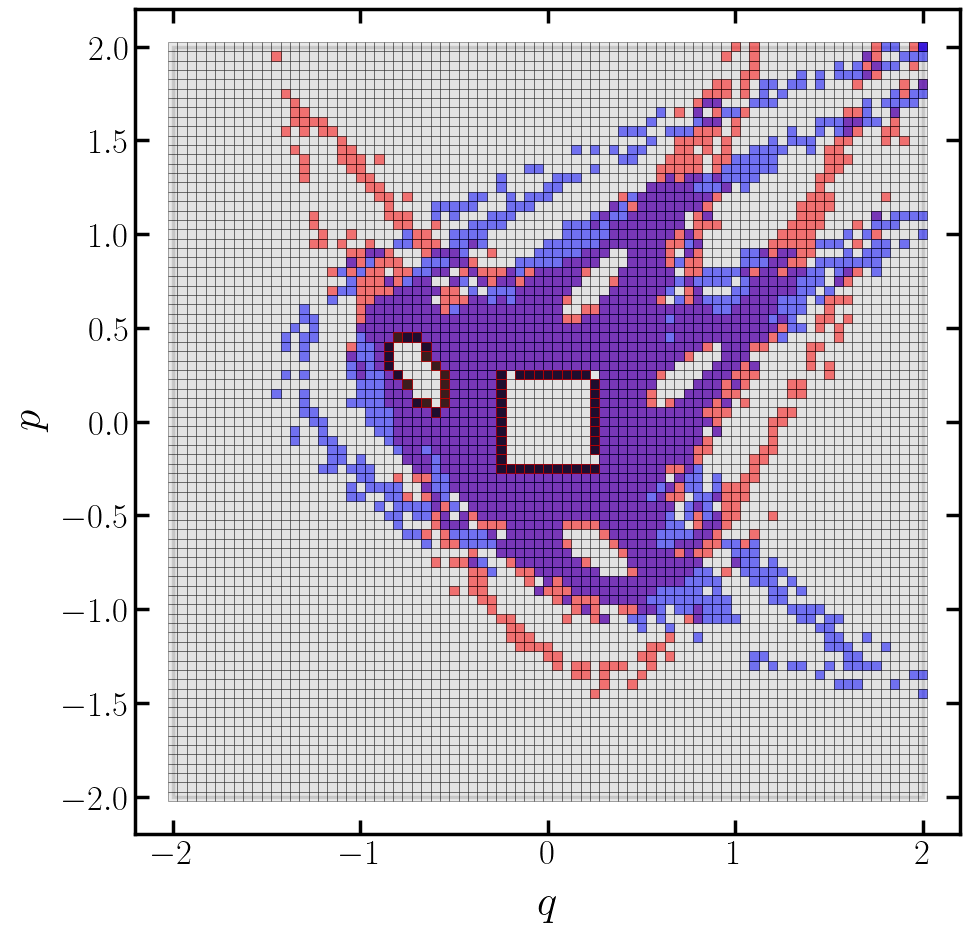

In [143]:
# Step-28: Island

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
for cx, cy in grid:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=1))
for cx, cy in domain_forward.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="red", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain_inverse.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="blue", edgecolor="black", linewidth=0.5, alpha=0.5, zorder=3))
for cx, cy in domain_final.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="red", linewidth=0.5, alpha=0.75, zorder=5))
for cx, cy in domain_island.construct:
    ax.add_patch(Rectangle((cx - 0.5 * dl, cy - 0.5 * dl), dl, dl, facecolor="black", edgecolor="red", linewidth=0.5, alpha=0.75, zorder=5))
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain_28.png', dpi=dpi)
plt.show()

## Steps: Global parameters (alternative knob values & fine resolution)

In [144]:
# Domain 

dimension = 2                            # -- phase-space dimension
dl = 0.001                               # -- domain cell side length
dr = dl*dimension**0.5                   # -- radial step size
lb = np.array([-2, -2])                  # -- domain lower bounds for (qx, qy, px, py)
ub = np.array([+2, +2])                  # -- domain upper bounds for (qx, qy, px, py)
size = 2**10                             # -- total number of iterations
ndirections = 8                          # -- number of initial random directions
nsamples = 32                            # -- number of random marked cells selected from the current marked cells
npoints = 64                             # -- number of random points to generate for each selected cell
nrounds = 128                            # -- maximum number of expansion rounds to perform
nepochs = 32                             # -- number of domain computations (MC over initial directions and expansion)
center = np.array([0., 0., 0., 0])       # -- domain center
cut = 2.0                                # -- selection cut radius
threshold = 100.0                        # -- threshold radius (an initial condition with larger radius is considered lost)
termination = 0.95                       # -- termination parameter (fraction of rays hitting marked domain cells)
scale = 1.0                              # -- perturbation scaling factor for new sample generation
bins_plane = 16                          # -- number of bins for the mixing coordinate
bins_phase = 32                          # -- number of bins for the in-plane phases
phase_threshold = 1.0E-3                 # -- phase threshold used in weighted selection
alpha_plane = 1.0                        # -- plane weight factor
alpha_phase = 0.5                        # -- phase weight factor
boost = 0.5                              # -- weight boost near the edges
delta = 1.0                              # -- inverse-density score regularization
uniform = 0.05                           # -- fraction of uniform sampling to use
power = 1.0                              # -- score power
uniform = 0.05                           # -- fraction of uniform sampling

# Grid

grid = Domain(lb, ub, dl) 
grid.insert(np.arange(grid.total))
grid = grid.construct
grid.shape

# Reference point

center = np.array([0.0, 0.0])

# Reference directions

ds = directions(dimension, 512, random=False, ij=(0, 1), omega_min=0.0, omega_max=2*np.pi)

# Map parameters

a, b = -0.065, 0.0
knobs = np.asarray([a, b])

# Objective

objective = iterate(size, threshold, forward2d)

## Steps: The bounding-set method (alternative knob values & fine resolution)

In [145]:
# Generate random initial rays

random = directions(dimension, ndirections)
random.shape

(8, 2)

In [146]:
# Compute first unstable radius along each random ray

rb, xb = da(dimension, dr, threshold, center, random, objective, knobs, unstable=True)

In [147]:
# Compute full orbits for unstable points

orbits = np.zeros((ndirections, size, dimension), dtype=np.float64)
scan(xb, orbits, orbit(size, threshold, forward2d), knobs)
ps = filter(np.vstack(orbits), cut)

In [148]:
# Define domain and add orbit points

domain  = Domain(lb, ub, dl)
domain.update(ps)

In [149]:
# Random samples

indices = np.random.choice(domain.list, nsamples)
samples = domain.transform(indices)
initial = sample(npoints, scale*dl, samples)

In [150]:
# Define container

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

In [151]:
# Scan (compute orbits)

scan(initial, orbits, orbit(size, threshold, forward2d), knobs)

In [152]:
# Unstable mask (should contain at least one unstalbe orbit)

unstable = np.isnan(np.sum(orbits[:, -1], axis=1))
unstable

array([ True,  True,  True, ...,  True,  True,  True], shape=(2048,))

In [153]:
# Reshape and filter orbits

ps = orbits[mask(orbits, threshold)].reshape(-1, dimension)
ps = filter(ps, cut)

In [154]:
# Update domain

domain.update(ps)

In [155]:
keys, *_  = domain.boundary(*(512, 512), center, ds)
flag = np.sum(keys == -1)
flag

np.int64(0)

In [156]:
# Keep only the inner shell

domain = Domain(lb, ub, dl)
domain.insert(keys[keys!=-1])

In [157]:
# Random samples

indices = np.random.choice(domain.list, nsamples)
samples = domain.transform(indices)
initial = sample(npoints, scale*dl, samples)

In [158]:
# Define container

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

In [159]:
# Scan (compute orbits)

scan(initial, orbits, orbit(size, threshold, forward2d), knobs)

In [160]:
# Unstable mask (should contain at least one unstalbe orbit)

unstable = np.isnan(np.sum(orbits[:, -1], axis=1))
unstable

array([ True, False, False, ...,  True,  True,  True], shape=(2048,))

In [161]:
# Reshape and filter orbits

ps = orbits[mask(orbits, threshold)].reshape(-1, dimension)
ps = filter(ps, cut)

In [162]:
# Update domain

domain.update(ps)

In [163]:
keys, *_  = domain.boundary(*(512, 512), center, ds)
flag = np.sum(keys == -1)
flag

np.int64(0)

In [164]:
# Keep only the inner shell

domain = Domain(lb, ub, dl)
domain.insert(keys[keys!=-1])

In [165]:
# Grow the domain (forward)

domain_forward = Domain(lb, ub, dl)
domain_forward.insert(domain.keys)

domain_forward_box = []
local = Domain(lb, ub, dl)
local.insert(domain_forward.keys)
domain_forward_box.append(local)

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

for epoch in range(32):
    indices = np.random.choice(domain_forward.list, nsamples)
    centers = domain_forward.transform(indices)
    initial = sample(npoints, scale*dl, centers)
    scan(initial, orbits, orbit(size, threshold, forward2d), knobs)
    points = orbits[mask(orbits, threshold)].reshape(-1, dimension)
    points = filter(points, threshold)
    domain_forward.update(points)
    local = Domain(lb, ub, dl)
    local.insert(domain_forward.keys)
    domain_forward_box.append(local)
    print(f'{epoch + 1:02d}', f'{domain_forward.size:12d}')
    if domain_forward.size > 128_000_000:
        break

01       200326
02       439604
03       629462
04       791003
05       920386
06      1045012
07      1142908
08      1216687
09      1278630
10      1327985
11      1376469
12      1418427
13      1447328
14      1480548
15      1504437
16      1529808
17      1554621
18      1580875
19      1597855
20      1618451
21      1638677
22      1652555
23      1671043
24      1684968
25      1697099
26      1712411
27      1723896
28      1736966
29      1748605
30      1759938
31      1770875
32      1782043


In [166]:
# Grow the domain (inverse)

domain_inverse = Domain(lb, ub, dl)
domain_inverse.insert(domain.keys)

orbits = np.empty((nsamples*npoints, size, dimension), dtype=np.float64)

domain_inverse_box = []
local = Domain(lb, ub, dl)
local.insert(domain_inverse.keys)
domain_inverse_box.append(local)

for epoch in range(32):
    indices = np.random.choice(domain_inverse.list, nsamples)
    centers = domain_inverse.transform(indices)
    initial = sample(npoints, scale*dl, centers)
    scan(initial, orbits, orbit(size, threshold, inverse2d), knobs)
    points = orbits[mask(orbits, threshold)].reshape(-1, dimension)
    points = filter(points, threshold)
    domain_inverse.update(points)
    local = Domain(lb, ub, dl)
    local.insert(domain_inverse.keys)
    domain_inverse_box.append(local)    
    print(f'{epoch + 1:02d}', f'{domain_inverse.size:12d}')
    if domain_inverse.size > 128_000_000:
        break

01       225406
02       484721
03       722191
04       873543
05       998458
06      1113778
07      1198563
08      1247709
09      1305524
10      1349422
11      1388720
12      1427257
13      1460981
14      1492121
15      1518642
16      1545557
17      1567550
18      1588623
19      1606714
20      1625207
21      1643020
22      1660742
23      1675788
24      1693269
25      1707601
26      1723473
27      1738372
28      1750599
29      1760174
30      1769055
31      1779880
32      1788815


In [167]:
domain_final = Domain(lb, ub, dl)
domain_final.insert(domain_forward.keys)
domain_final.insert(domain_inverse.keys)

In [168]:
keys, *_  = domain_final.boundary(*(512, 512), center, ds)
flag = np.sum(keys == -1)
flag

np.int64(0)

In [169]:
domain_final = Domain(lb, ub, dl)
domain_final.insert(keys[keys!=-1])

In [170]:
domain_island = Domain(lb, ub, dl)
domain_island.insert(domain_forward.keys)
domain_island.insert(domain_inverse.keys)
domain_island.size

2359435

In [171]:
point = np.array([-0.725, 0.25])
print(objective(point, knobs))

keys, *_  = domain_island.boundary(*(512, 512), point, ds)
flag = np.sum(keys == -1)
flag

True


np.int64(0)

In [172]:
domain_island = Domain(lb, ub, dl)
domain_island.insert(keys[keys!=-1])
domain_island.size

496

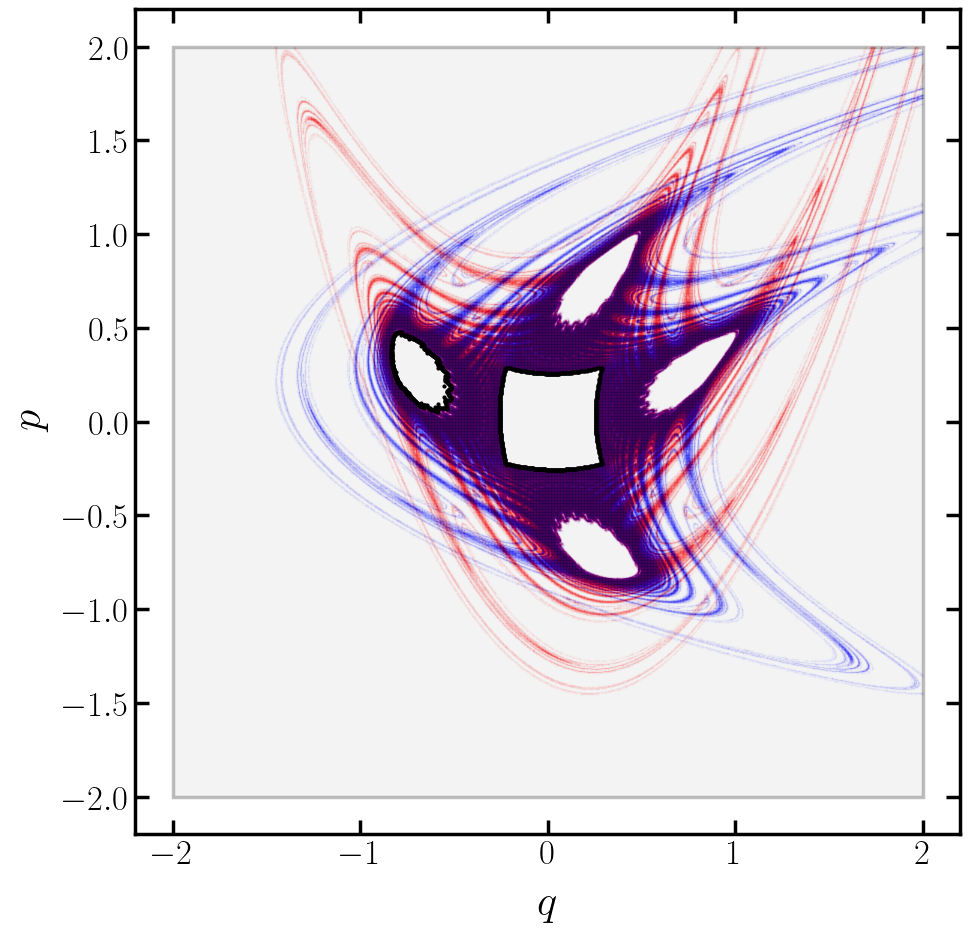

In [173]:
# Domain

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 300

width, height = ub - lb
fig, ax = plt.subplots(figsize=(11.0, 10.0))
fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
ax.add_patch(rec)
plt.errorbar(*domain_forward.construct.T, fmt=' ', ms=1, marker='.', color='red', alpha=0.01, zorder=0)
plt.errorbar(*domain_inverse.construct.T, fmt=' ', ms=1, marker='.', color='blue', alpha=0.01, zorder=0)
plt.errorbar(*domain_final.construct.T, fmt=' ', ms=2, marker='o', color='black', alpha=1, zorder=1)
plt.errorbar(*domain_island.construct.T, fmt=' ', ms=2, marker='o', color='black', alpha=1, zorder=1)
ax.set_xlim(-2.2, 2.2)
ax.set_ylim(-2.2, 2.2)
ax.set_aspect("equal", adjustable="box")
ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig(f'domain.png', dpi=dpi)
plt.show()

In [174]:
# Domain growth animation

fs = 25
spine_width = 2.5
tick_width = 2.5
tick_length = 10
dpi = 100

for i in range(32):
    width, height = ub - lb
    fig, ax = plt.subplots(figsize=(11.0, 10.0))
    fig.subplots_adjust(left=0.150, right=0.975, bottom=0.150, top=0.975)
    rec = Rectangle(lb, width=width, height=height, facecolor="lightgrey", edgecolor="black", linewidth=2.5, linestyle="-", alpha=0.25, zorder=0)
    ax.add_patch(rec)
    plt.errorbar(*domain_forward_box[i].construct.T, fmt=' ', ms=1, marker='.', color='red', alpha=0.01, zorder=0)
    plt.errorbar(*domain_inverse_box[i].construct.T, fmt=' ', ms=1, marker='.', color='blue', alpha=0.01, zorder=0)
    ax.set_xlim(-2.2, 2.2)
    ax.set_ylim(-2.2, 2.2)
    ax.set_aspect("equal", adjustable="box")
    ax.set_xlabel(r"$q$", fontsize=1.25 * fs, labelpad=10)
    ax.set_ylabel(r"$p$", fontsize=1.25 * fs, labelpad=10)
    ax.tick_params(axis="both", which="major", width=tick_width, length=tick_length, direction="in", labelsize=fs, top=True, right=True)
    ax.tick_params(axis="both", which="minor", width=0.75 * tick_width, length=0.75 * tick_length, direction="in", top=True, right=True)
    for spine in ax.spines.values():
        spine.set_linewidth(spine_width)
    plt.savefig(f'domain_{i}.png', dpi=dpi)
    plt.close()